## <center>КУРСОВОЙ ПРОЕКТ<center>

**Задача**

Требуется, на основании имеющихся данных о клиентах банка, построить модель, используя обучающий датасет, для прогнозирования невыполнения долговых обязательств по текущему кредиту. Выполнить прогноз для примеров из тестового датасета.
(Задача предсказать для текущих клиентов, кто в следующем месяце будет должником, а кто нет и все данные именно к этому одному кредиту одного клиента и относятся)

**Целевая переменная**

Credit Default - факт невыполнения кредитных обязательств

**Метрика качества**

F1-score (sklearn.metrics.f1_score)

**Требования к решению**

*Целевая метрика*
* F1 > 0.5
* Метрика оценивается по качеству прогноза для главного класса (1 - просрочка по кредиту)

*Решение должно содержать*
1. Тетрадка Jupyter Notebook с кодом Вашего решения
2. Укажите свой ник на kaggle

*Рекомендации для файла с кодом (ipynb)*
1. Файл должен содержать заголовки и комментарии (markdown)
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. По возможности добавлять графики, описывающие данные (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. Весь проект должен быть в одном скрипте (файл ipynb).
8. Допускается применение библиотек Python и моделей машинного обучения,
которые были в данном курсе.

**Сроки сдачи**

Cдать проект нужно в течение 7 дней после окончания последнего вебинара.

## <center>Используемые библиотеки, директории и функции<center>

In [612]:
# Установка необходимых библиотек
#!pip install featuretools
#!pip install xgboost 
#!pip install lightgbm
#!pip install catboost
#!pip install imblearn

**Подключение библиотек и скриптов**

In [832]:
import numpy as np
import pandas as pd
import pickle
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns


from scipy.stats import shapiro
from scipy.stats import probplot
from scipy.stats import mannwhitneyu
from scipy.stats import chi2_contingency

#from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb, lightgbm as lgbm, catboost as catb

from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import f1_score,\
                            plot_confusion_matrix, \
                            classification_report, \
                            plot_precision_recall_curve,\
                            precision_score, recall_score
import featuretools as ft
import featuretools.variable_types as vtypes


from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')

**Пути к директориям и файлам**

In [614]:
TRAIN_DATASET_PATH = './course_project_train.csv'
TEST_DATASET_PATH = './course_project_test.csv'

**Пользовательские функции**

In [615]:
#Для просмотра тестового датасета
def view_test_dataset():
    print(f'Форма тестового датасета: \n количество записей: {df_test.shape[0]}, \n количество признаков: {df_test.shape[1]}');
    print(df_test.info());
    return df_test.head();

#Для определения выбросов в количественных признаках тренировочного набора
def blowout_in_features_train(feature):
    print(f'Данные по признаку {feature} и их количество \n {X[feature].value_counts().sort_index()}');
    print(f'Описание признака {feature}: {X[feature].describe()}');
    plt.figure(figsize=(6, 3))
    sns.boxplot(X[feature], whis=1.5)
    plt.xlabel(feature)
    return plt.show()

#Для определения выбросов в количественных признаках тестового набора
def blowout_in_features_test(feature):
    print(f'Данные по признаку {feature} и их количество \n {df_test[feature].value_counts().sort_index()}');
    print(f'Описание признака {feature}: {df_test[feature].describe()}');
    plt.figure(figsize=(6, 3))
    sns.boxplot(df_test[feature], whis=1.5)
    plt.xlabel(feature)
    return plt.show()

#Для обработки выбросов, пропусков и создания новых признаков в тестовом наборе
def prep_test_dataset(df_test):   
    # 0. Приведение типов 
    for colname in ['Tax Liens', 'Number of Credit Problems', 'Bankruptcies']:
        df_test[colname] = df_test[colname].astype(str)
   
    # 1. Анализ выбросов показал, что
        #1) в признаке 'Maximum Open Credit' "подозрительное" значение 0 \
        #2) в признаке 'Current Loan Amount' сумма 99999999.0 (297 раз) -- выброс \
        #3) в признаке 'Credit Score' значения > 6000 -- выброс или ошибка в сборе данных
   
    # 2. Заменяем "странное значение" 99999999 в Current Loan Amount на текущий ненулевой Current Credit Balance
    df_test.loc[(df_test['Current Loan Amount'] > 90000000) & (df_test['Current Credit Balance'] > 0), 'Current Loan Amount'] =\
    df_test.loc[(df_test['Current Loan Amount'] > 90000000) & (df_test['Current Credit Balance'] > 0), 'Current Credit Balance']
   
    #3. В случае Maximum Open Credit = Current Credit Balance = 0, а Monthly Debt !=0 
    # Заменяем "странную" сумму 99999999 медианой 
    df_test.loc[(df_test['Maximum Open Credit'] == 0) & (df_test['Current Credit Balance'] == 0) & (df_test['Monthly Debt'] != 0) & (df_test['Current Loan Amount'] == 99999999.0), 'Current Loan Amount'] =\
    df_test.loc[(df_test['Maximum Open Credit'] == 0) & (df_test['Current Credit Balance'] == 0) & (df_test['Monthly Debt'] != 0), 'Current Loan Amount'].median()
    
    # 4. В случае Maximum Open Credit = Current Credit Balance = 0, а Monthly Debt !=0 
    # Заменяем нулевой Maximum Open Credit на Current Loan Amount
    df_test.loc[(df_test['Maximum Open Credit'] == 0) & (df_test['Current Credit Balance'] == 0), 'Maximum Open Credit'] =\
    df_test.loc[(df_test['Maximum Open Credit'] == 0) & (df_test['Current Credit Balance'] == 0), 'Current Loan Amount']
   
    # 5. В случае Maximum Open Credit = 0, 'Current Credit Balance' !=0, 'Monthly Debt' !=0
    #Заменяем нулевой Maximum Open Credit на Current Loan Amount
    X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Maximum Open Credit'] =\
    X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Current Credit Balance']
   
    # 6. В случае Maximum Open Credit != 0, Current Credit Balance != 0 и Monthly Debt != 0
    # в подслучае Current Loan Amount < Current Credit Balance
    # заменяем Current Loan Amount на Current Credit Balance
    df_test.loc[(df_test['Maximum Open Credit'] != 0) & (df_test['Current Credit Balance'] != 0) & (df_test['Monthly Debt'] != 0) & (df_test['Current Loan Amount'] < df_test['Current Credit Balance']), 'Current Loan Amount'] =\
    df_test.loc[(df_test['Maximum Open Credit'] != 0) & (df_test['Current Credit Balance'] != 0) & (df_test['Monthly Debt'] != 0) & (df_test['Current Loan Amount'] < df_test['Current Credit Balance']), 'Current Credit Balance']
    
    # 7. Значения Credit Score > 6000 делим на 10
    df_test.loc[df_test['Credit Score'] > 6000, 'Credit Score'] =\
    df_test.loc[df_test['Credit Score'] > 6000, 'Credit Score'] / 10
   
    # 8. Заменяем неопознанные значения Bankruptcies на моду
    df_test.loc[df_test['Bankruptcies'] == 'nan', 'Bankruptcies'] =\
    df_test['Bankruptcies'].mode()[0]
    
    # 9. Анализ пропусков показал, что пропуски есть в признаках:
        #1) 'Annual Income',
        #2) 'Years in current job',
        #3) 'Months since last delinquent',
        #4) 'Credit Score'

    #10. Заполняем пропуски в Annual Income на медиану
    df_test['Annual Income'].fillna(df_test['Annual Income'].median(), inplace=True)
   
    #11. Заполняем пропуски в Years in current job на моду
    df_test['Years in current job'].fillna(df_test['Years in current job'].mode()[0], inplace=True)
   
    #12. Заполняем пропуски в Months since last delinquen на медиану
    df_test['Months since last delinquent'].fillna(df_test['Months since last delinquent'].median(), inplace=True)
  
    #15. Заменяем пропуски в Credit Score медианой
    df_test['Credit Score'].fillna(df_test['Credit Score'].median(), inplace=True)
   
    #16. Построение новых признаков:
        #1) dummies из категориальных признаков,
        #2) Tax Liens_7.0, Number of Credit Problems_6.0, Purpose_renewable energy с нулевыми значениями
        #3) Feature  binarization and encoding
        #4) target encording
        
    #17. Делаем бинарный признак из Term
    df_test['Is_Long_Term'] = \
    df_test['Term'].map({'Short Term':'0', 'Long Term':'1'}).astype(int)
   
    #18. Делаем dummies из категориальных признаков (кроме Term)
    for cat_feature in df_test.select_dtypes(include='object').columns.tolist()[:-1]:
        df_test = pd.concat([df_test, pd.get_dummies(df_test[cat_feature], prefix=cat_feature)], axis=1)
   
    #19. Добавляем недостающие до множества признаков train признаки с нулевыми значениями
    df_test['Tax Liens_7.0'] = 0
    df_test['Number of Credit Problems_6.0'] = 0
    df_test['Purpose_renewable energy'] = 0
    
    #20. Определяем, был ли скрыт годовой доход
    df_test['Is Hidden Income'] =\
    (df_test['Annual Income'].isnull()).astype('int64')

    #21. Определяем было ли скрыто количество лет на последнем месте работы
    df_test['Is Hidden Years in current job'] =\
    (df_test['Years in current job'].isnull()).astype('int64')

    #22. Проверяем разницу между зарплатой и ежемесячным платежом
    df_test['Salary and Mount Debt Difference'] =\
    df_test['Annual Income']/12 - df_test['Monthly Debt']

    #23. Проверяем разницу текущей кредитной суммой и текущим кредитным балансом
    df_test['Current Loan Amount and Current Credit Balance Difference'] =\
    df_test['Current Loan Amount'] - df_test['Current Credit Balance']

    #24. Количество банкронств равно количеству проблем с кредитом
    df_test['Bankruptcies equal Number of Credit Problems'] =\
    (df_test['Bankruptcies'] == df_test['Number of Credit Problems']).astype('int64')

    #25. Доля проблемных кредитов
    df_test['Share of Problem Loans'] =\
    df_test['Number of Credit Problems'].astype('float64')/df_test['Number of Open Accounts']

    #26. Вычислим медианное значение лет кредитной истории по каждому числу открытых счетов
    dt = df_test.groupby('Number of Open Accounts', as_index=False).median()\
    [['Number of Open Accounts', 'Years of Credit History']].\
    rename(columns={'Years of Credit History': \
                    'Years of Credit History encode Number of Open Accounts'})
    df_test = df_test.merge(dt, on='Number of Open Accounts', how='left')

    #27. Определяем является ли доход больше среднего
    df_test['Small Annual Income'] =\
    (df_test['Annual Income'] < df_test['Annual Income'].median()).astype('int64')

    #28. Вычисляем медианное значение в количестве месяцев просрочки платежа по числу кредитных проблем
    et = df_test.groupby('Number of Credit Problems', as_index=False).median()\
    [['Number of Credit Problems', 'Months since last delinquent']].\
    rename(columns={'Months since last delinquent':\
                    'Months since last delinquent encode Number of Credit Problems'})
    df_test = df_test.merge(et, on='Number of Credit Problems', how='left')
    
    return df_test

#Вывод классификационного отчета
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))
    

def evaluate_preds(model, X_train, X_test, y_train, y_test):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

In [795]:
def show_proba_calibration_plots(y_predicted_probs, y_true_labels):
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    for threshold in np.linspace(0.1, 0.9, 9):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('f1', ascending=False).round(3)
  
    figure = plt.figure(figsize = (15, 5))

    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()

In [799]:
def show_learning_curve_plot(estimator, X, y, cv=3, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(15,8))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f"Learning curves ({type(estimator).__name__})")
    plt.xlabel("Training examples")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()

In [818]:
def show_feature_importances(feature_names, feature_importances, get_top=None):
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
       
    plt.figure(figsize = (20, len(feature_importances) * 0.355))
    
    sns.barplot(feature_importances['importance'], feature_importances['feature'])
    
    plt.xlabel('Importance')
    plt.title('Importance of features')
    plt.show()
    
    if get_top is not None:
        return feature_importances['feature'][:get_top].tolist()

## <center>ПЛАН РЕШЕНИЯ<center>

[**Глава 1.** Анализ данных](#part1)\
[$\S1.1$. Загрузка датасетов train и test](#par1.1) \
[$\S1.2$. Сравнение датасетов train и test](#par1.2) \
[$\S1.3$. Обзор обучающего датасета train](#par1.3) \
[$\S1.4$. Обработка выбросов](#par1.4) \
[$\S1.5$. Обработка пропусков](#par1.5) \
[$\S1.6$. Построение новых признаков](#par1.6)\
[$\S1.7$. Обработка датасета test](#par1.7)

[**Глава 2.** Построение модели классификации](#part2)\
[$\S2.1$. Отбор признаков](#par2.1)\
[$\S2.2$. Подбор моделей, получение бейзлана](#par2.2)\
[$\S2.3$. Выбор лучшей модели. Настройка гиперпараметров](#par2.3)\
[$\S2.4$. Подбор оптимального размера выборки, кривая обучения](#par2.4) \
[$\S2.5$. Выбор порога вероятности для определения класса](#par2.5)\
[$\S2.6$. Важность признаков](#par2.6) \
[$\S2.7$. Получение итоговой модели](#par2.7)

[**Глава 3.** Прогнозирование на датасете test](#part3)\
[$\S3.1$. Предсказание класса с помощью итоговой модели](#par3.1) \
[$\S3.2$. Создание и сохранение датасета с прогнозами класса](#par3.2)

## <center>Глава 1. Анализ данных<a class="anchor" id="Part1"></a><center>

### $\S 1.1.$ Загрузка даннных<a class="anchor" id="par1.1">

**Описание датасета**

* **Home Ownership** - домовладение
* **Annual Income** - годовой доход
* **Years in current job** - количество лет на текущем месте работы
* **Tax Liens** - налоговые обременения (обязанности по уплате налогов)
* **Number of Open Accounts** - количество открытых счетов
* **Years of Credit History** - количество лет кредитной истории
* **Maximum Open Credit** - наибольший открытый кредит (максимальная сумма, которая когда-либо была доступна клиенту)
* **Number of Credit Problems** - количество проблем с кредитом (количество просроченных платежей)
* **Months since last delinquent** - количество месяцев с последней просрочки платежа
* **Bankruptcies** - банкротства (неспособность должника производить выплаты по долговым обязательствам)
* **Purpose** - цель кредита
* **Term** - срок кредита
* **Current Loan Amount** - текущая сумма кредита (сумма, которую еще предстоит выплатить клиенту)
* **Current Credit Balance** - текущий кредитный баланс (сумма, которую может тратить клиент с кредитного счета)
* **Monthly Debt** - ежемесячный долг
* **Credit Score** - баллы кредитного рейтинга
* **Credit Default** - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

**Загрузка данных**

In [616]:
# Загружаем тренировочный датасет
df_train = pd.read_csv(TRAIN_DATASET_PATH)
df_train.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0


In [617]:
# Общее количество записей 7500, для каждой 16 признаков
df_train.shape

(7500, 17)

In [618]:
# Замечаем наличие пропусков в признаках 'Annual Income', 'Years in current job', 'Months since last delinquent', 'Bankruptcies', 'Credit Score'
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

In [619]:
# Заружаем и просматриваем тестовый датасет
# Замечаем наличие пропусков в признаках 'Annual Income', 'Years in current job', 'Months since last delinquent', 'Bankruptcies', 'Credit Score'
df_test = pd.read_csv(TEST_DATASET_PATH)
view_test_dataset()

Форма тестового датасета: 
 количество записей: 2500, 
 количество признаков: 16
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                2500 non-null   object 
 1   Annual Income                 1987 non-null   float64
 2   Years in current job          2414 non-null   object 
 3   Tax Liens                     2500 non-null   float64
 4   Number of Open Accounts       2500 non-null   float64
 5   Years of Credit History       2500 non-null   float64
 6   Maximum Open Credit           2500 non-null   float64
 7   Number of Credit Problems     2500 non-null   float64
 8   Months since last delinquent  1142 non-null   float64
 9   Bankruptcies                  2497 non-null   float64
 10  Purpose                       2500 non-null   object 
 11  Term                          2500 non-n

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
0,Rent,NaN,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,debt consolidation,Short Term,162470.0,105906.0,6813.0,NaN
1,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,educational expenses,Short Term,78298.0,46037.0,2318.0,699.0
2,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,NaN,0.0,debt consolidation,Short Term,200178.0,146490.0,18729.0,7260.0
3,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,debt consolidation,Short Term,217382.0,213199.0,27559.0,739.0
4,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,NaN,0.0,debt consolidation,Long Term,777634.0,425391.0,42605.0,706.0


### $\S1.2$. Сравнение датасетов train и test <a class="anchor" id="par1.2">

**Проверим распределения вещественных признаков на train и test**

Annual Income
MannwhitneyuResult(statistic=9362155.5, pvalue=0.45908193952511717)


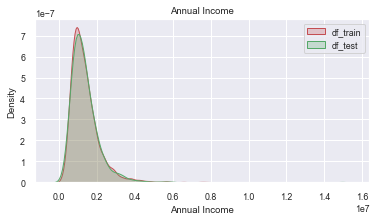

Number of Open Accounts
MannwhitneyuResult(statistic=9279311.5, pvalue=0.22142637178864455)


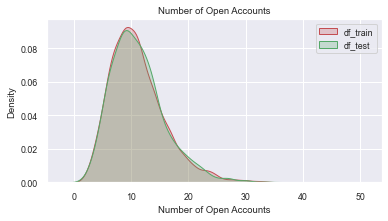

Years of Credit History
MannwhitneyuResult(statistic=9339658.0, pvalue=0.3886945952485082)


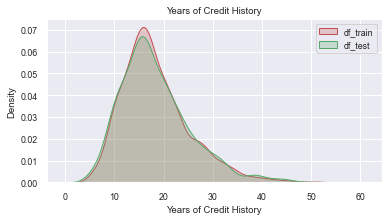

Maximum Open Credit
MannwhitneyuResult(statistic=9337869.0, pvalue=0.3832220993414893)


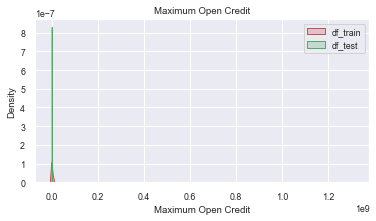

Months since last delinquent
MannwhitneyuResult(statistic=6974400.5, pvalue=1.712573746209761e-82)


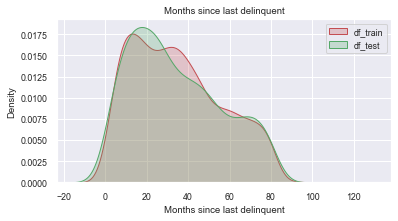

Current Loan Amount
MannwhitneyuResult(statistic=9230199.5, pvalue=0.12317435968682072)


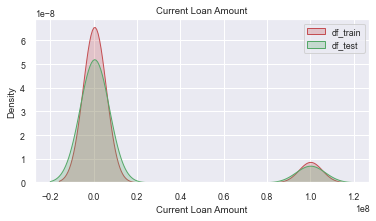

Current Credit Balance
MannwhitneyuResult(statistic=9334050.0, pvalue=0.3716147491364306)


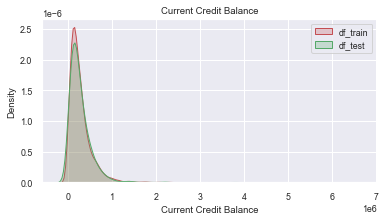

Monthly Debt
MannwhitneyuResult(statistic=9288187.0, pvalue=0.24369523330673137)


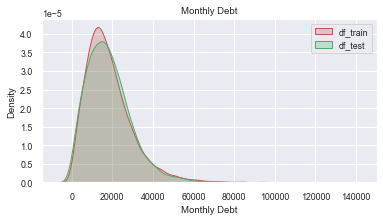

Credit Score
MannwhitneyuResult(statistic=9359581.5, pvalue=0.45091647518794764)


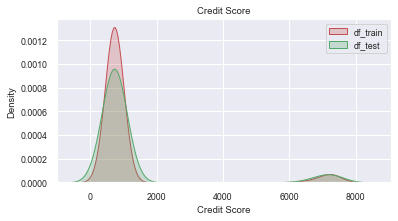

In [620]:
figsize = (6, 3)
for col in ['Annual Income', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', 'Months since last delinquent', 'Current Loan Amount', 'Current Credit Balance','Monthly Debt','Credit Score']:
    plt.figure(figsize=figsize)
    sns.set(font_scale=0.8)
    sns.kdeplot(df_train[col], shade=True, label='df_train', color='r')
    sns.kdeplot(df_test[col], shade=True, label='df_test', color='g')
    print(col)
    print(mannwhitneyu(df_train[col], df_test[col]))
    plt.legend()
    plt.title(col)
    plt.show()

**Вывод:** У всех признаков $p_{value} > 0.05$, следовательно $df_{train}$ и $df_{test}$ похожи числовыми признаками. У признака 'Months since last delinquent' $p_{value} > 1$, необходимо его исследовать отдельно (скорее всего не брать его в обучение). \
***Максимально похожие признаки:*** \
['Annual Income', 'Credit Score', 'Years of Credit History', 'Maximum Open Credit', 'Current Credit Balance']

**Проверим распределения категориальных признаков на train и test**

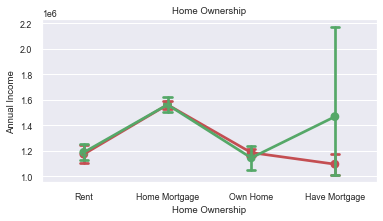

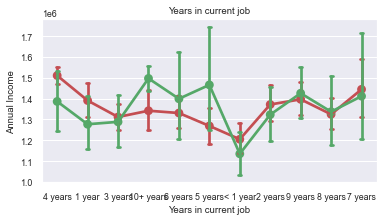

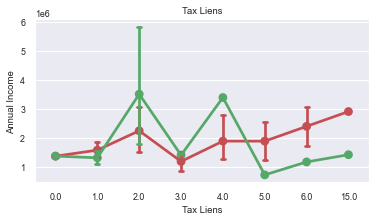

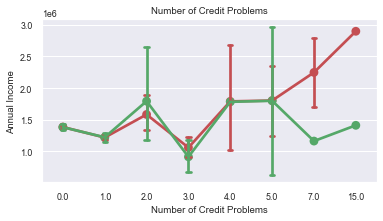

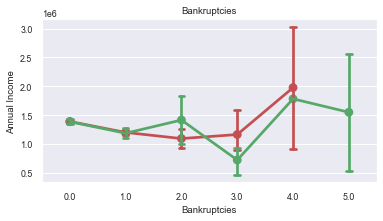

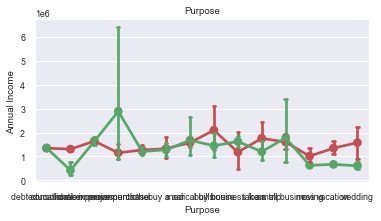

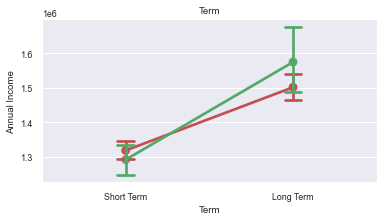

In [621]:
num_feature = 'Annual Income'
for col in ['Home Ownership', 'Years in current job', 'Tax Liens', 'Number of Credit Problems', 'Bankruptcies', 'Purpose', 'Term']:
    plt.figure(figsize=figsize)
    sns.pointplot(x=col, y=num_feature, data=df_train, capsize=.1, label='df_train', color='r')
    sns.pointplot(x=col, y=num_feature, data=df_test, capsize=.1, label='df_test', color='g')
    plt.title(col) 
    plt.show()

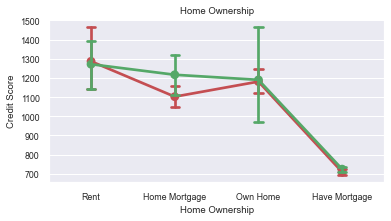

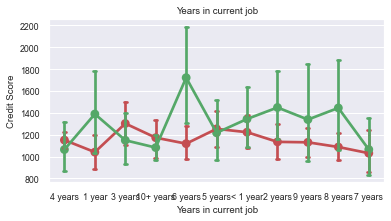

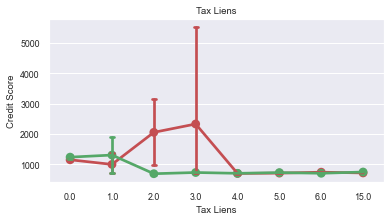

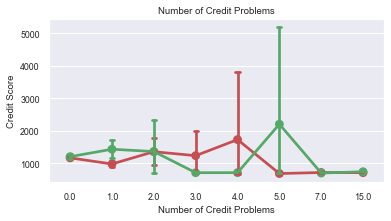

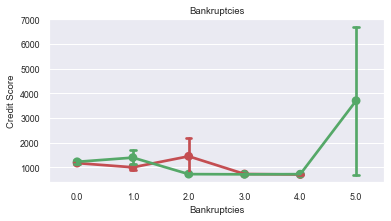

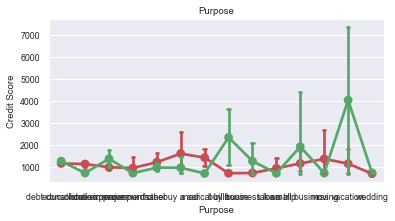

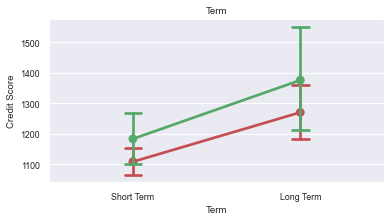

In [622]:
num_feature = 'Credit Score'
for col in ['Home Ownership', 'Years in current job', 'Tax Liens', 'Number of Credit Problems', 'Bankruptcies', 'Purpose', 'Term']:
    plt.figure(figsize=figsize)
    sns.pointplot(x=col, y=num_feature, data=df_train, capsize=.1, label='df_train', color='r')
    sns.pointplot(x=col, y=num_feature, data=df_test, capsize=.1, label='df_test', color='g')
    plt.title(col) 
    plt.show()

**Вывод:** категориальные признаки не похожи, кроме Home Ownership и Term

### $\S1.3$. Обзор обучающего датасета train<a class="anchor" id="par1.3">

In [623]:
# Определяем целевую переменную и датасет с признаками
target = 'Credit Default'

y = df_train[target]
X = df_train.drop(target, axis=1)

print(f'Целевая переменная: {target}')
print(f'Базовые признаки: {X.columns.to_list()}')

Целевая переменная: Credit Default
Базовые признаки: ['Home Ownership', 'Annual Income', 'Years in current job', 'Tax Liens', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', 'Number of Credit Problems', 'Months since last delinquent', 'Bankruptcies', 'Purpose', 'Term', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt', 'Credit Score']


**Обзор целевой переменной**

In [624]:
# Замечаем дисбаланс классов в 2 раза
y.value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

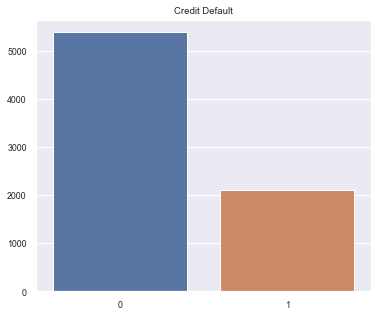

In [625]:
# Визуализируем данные целевой переменной
plt.figure(figsize=(6,5))    
plt.title(target)
sns.barplot(y.value_counts().index, y.value_counts().values)
    
plt.show()

**Корреляция с базовыми признаками**

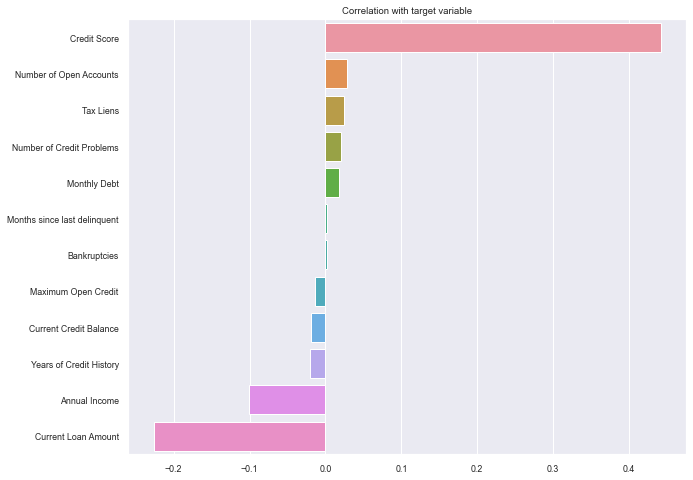

In [626]:
# Строим матрицу корреляции целевой переменной с базовыми признаками датасета df_train
corr_with_target = df_train.corr().iloc[:-1, -1].sort_values(ascending=False)

plt.figure(figsize=(10, 8))

sns.barplot(x=corr_with_target.values, y=corr_with_target.index)

plt.title('Correlation with target variable')
plt.show()

***Вывод:***\
  Признаки с высокой корреляцией: \
    1) Credit Score (похож у train и test),\
    2) Current Loan Amount (похож у train и test), \
    3) Annual Income (максимально похожий признак у train и test)

**Оценка признаков в разрезе целевой переменной**

***Оценка признаков \
'Credit Score', 'Current Loan Amount', 'Annual Income', \
'Number of Open Accounts', 'Monthly Debt',\
'Months since last delinquent', 'Maximum Open Credit', \
'Current Credit Balance', 'Years of Credit History' \
в разрезе целевой переменной***

Оценка признака feature = Credit Score


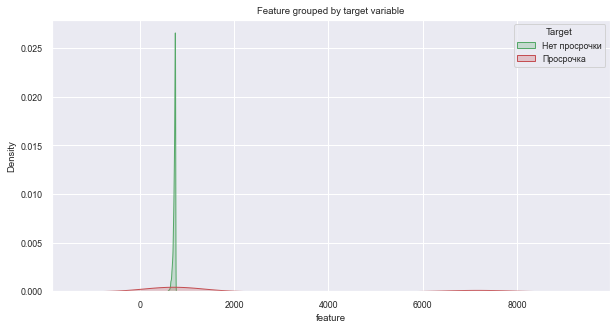

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=nan, pvalue=1.0)


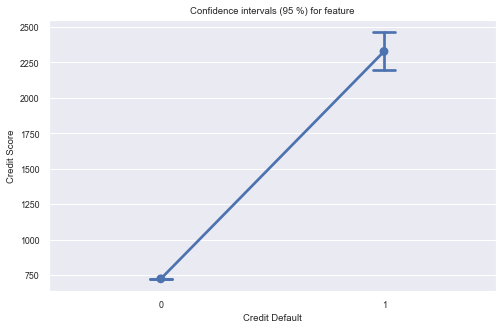

Оценка признака feature = Current Loan Amount


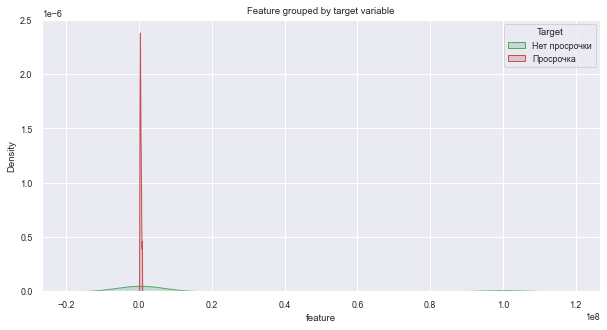

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.37670987844467163, pvalue=0.0)


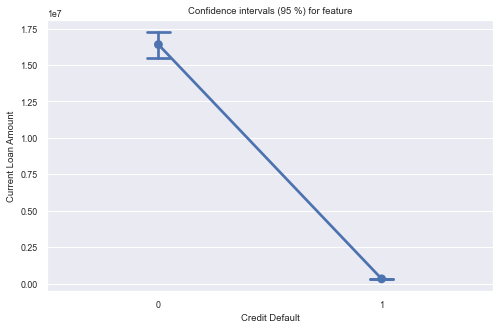

Оценка признака feature = Annual Income


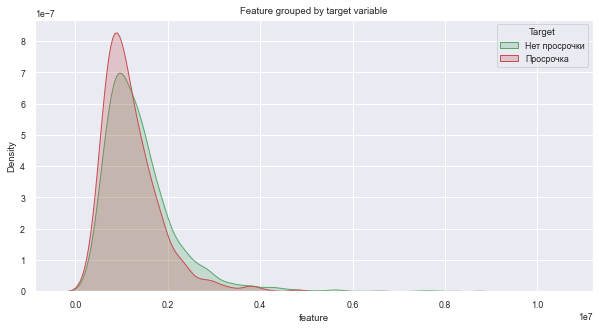

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=nan, pvalue=1.0)


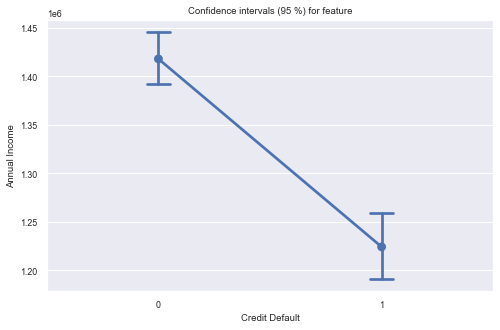

Оценка признака feature = Number of Open Accounts


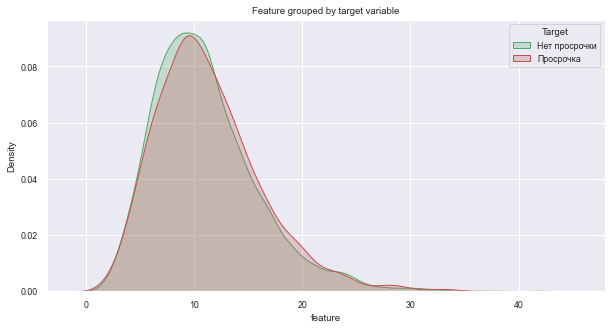

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.9372566342353821, pvalue=0.0)


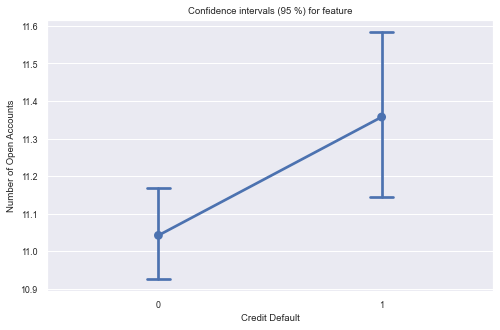

Оценка признака feature = Monthly Debt


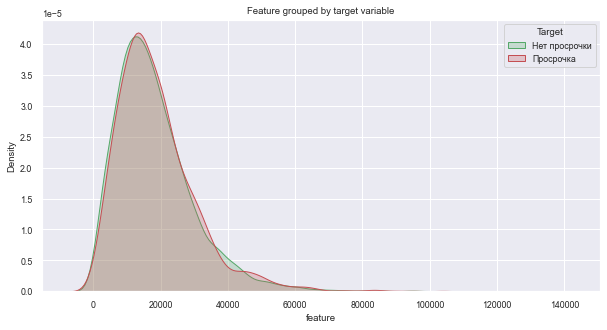

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.8937593698501587, pvalue=0.0)


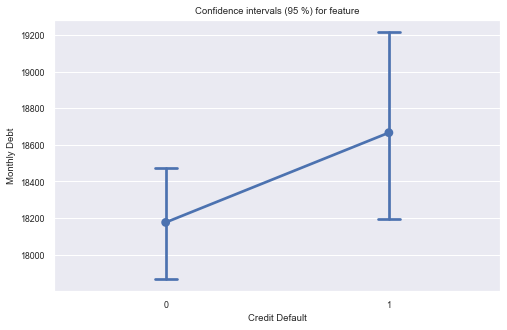

Оценка признака feature = Months since last delinquent


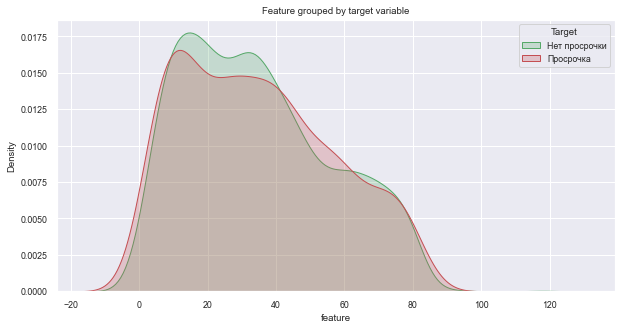

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=nan, pvalue=1.0)


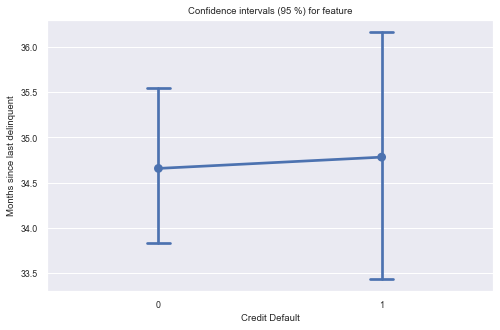

Оценка признака feature = Maximum Open Credit


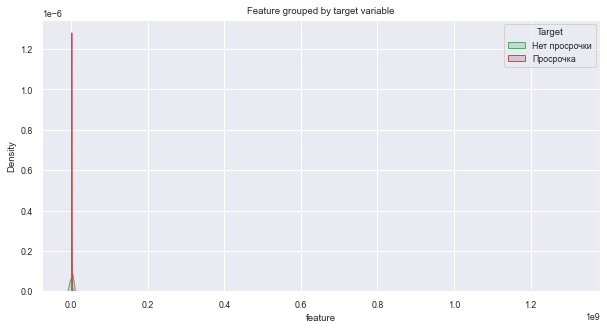

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.010420262813568115, pvalue=0.0)


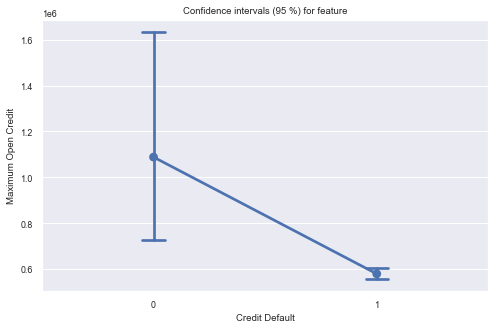

Оценка признака feature = Current Credit Balance


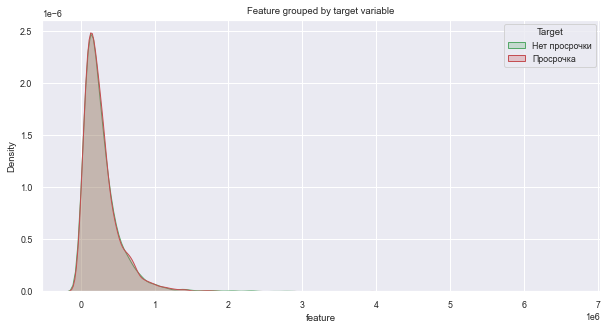

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6394237279891968, pvalue=0.0)


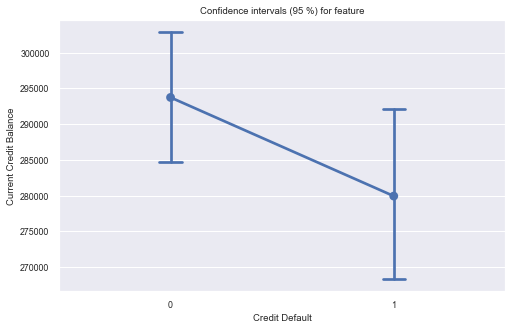

Оценка признака feature = Years of Credit History


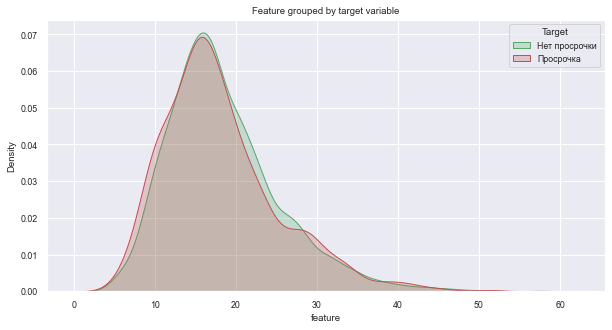

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.9434478282928467, pvalue=0.0)


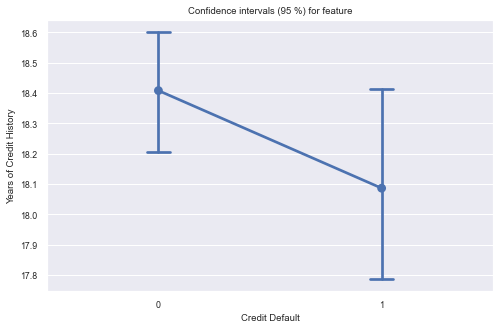

In [627]:
for feature in ['Credit Score', 'Current Loan Amount', 'Annual Income',\
                'Number of Open Accounts', 'Monthly Debt',\
                'Months since last delinquent', 'Maximum Open Credit', \
                'Current Credit Balance', 'Years of Credit History']:
    print(f'Оценка признака feature = {feature}')
    feature_with_target = df_train[[feature, target]]
    feature = feature_with_target[feature]
    feature_target_0 = feature[feature_with_target[target] == 0]
    feature_target_1 = feature[feature_with_target[target] == 1]
    
    plt.figure(figsize=(10, 5))
    
    sns.kdeplot(feature_target_0, shade=True, label='Нет просрочки', color='g')
    sns.kdeplot(feature_target_1, shade=True, label='Просрочка', color='r')
    
    plt.xlabel('feature')
    plt.title('Feature grouped by target variable')
    plt.legend(title='Target', loc='upper right')
 
    plt.show()
    
    # Проверяем распределения на нормальность
    print(f'Критерий Шапиро-Уилка для признака: {shapiro(feature)}')
    
    #Строим доверительные интервалы
    plt.figure(figsize=(8, 5))

    sns.pointplot(x=target, y=feature, data=feature_with_target, capsize=.1)

    plt.title('Confidence intervals (95 %) for feature')
    plt.show()

***Вывод:***\
  Распределения:  
   1) распределение нормальны у признаков: Credit Score, Current Loan Amount, Annual Income, Number of Open Accounts, Monthly Debt, Months since last delinquent, Current Credit Balance, Years of Credit History\
   2) распределения ненормальны у признаков: Maximum Open Credit,  
  
  Средние значения в выборках:
  1) равны: Months since last delinquent \
  2) пересекаются: Number of Open Accounts, Monthly Debt, Current Credit Balance, Years of Credit History \
  3) не равны: Credit Score, Current Loan Amount, Annual Income, Maximum Open Credit
  
**Признаки, полезные для определения значений целевой переменной:** \
  Credit Score, Current Loan Amount, Annual Income, Maximum Open Credit  

***Оценка признаков \
'Tax Liens', 'Number of Credit Problems', 'Bankruptcies' \
в разрезе целевой переменной***

Оценка признака feature = Tax Liens


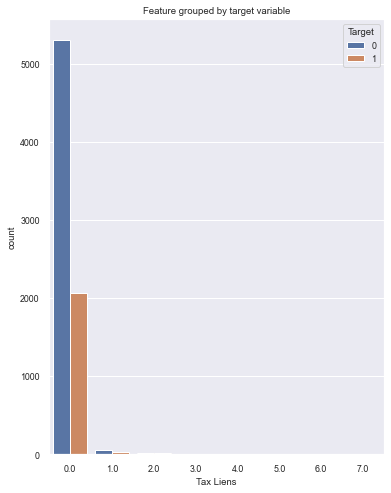

Оценка признака feature = Number of Credit Problems


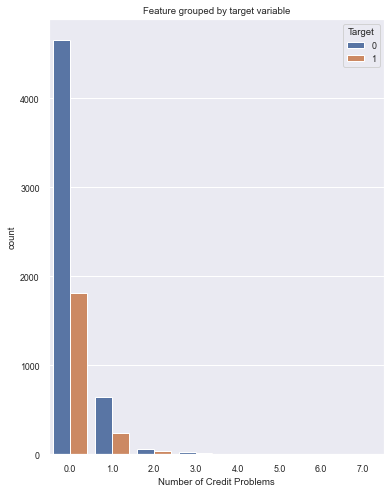

Оценка признака feature = Bankruptcies


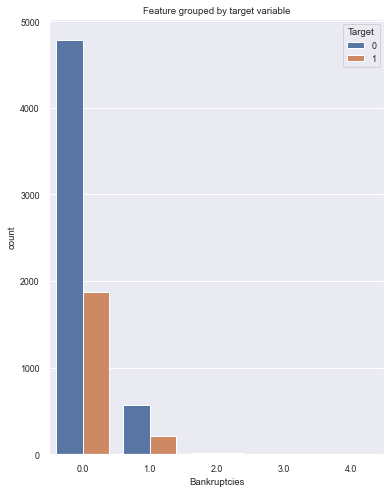

In [628]:
for feature in ['Tax Liens', 'Number of Credit Problems', 'Bankruptcies']:
    print(f'Оценка признака feature = {feature}')
    
    # Строим гистаграмму
    plt.figure(figsize=(6, 8))

    sns.countplot(x=feature, hue=target, data=df_train)
    plt.title('Feature grouped by target variable')
    plt.legend(title='Target', loc='upper right')

    plt.show()

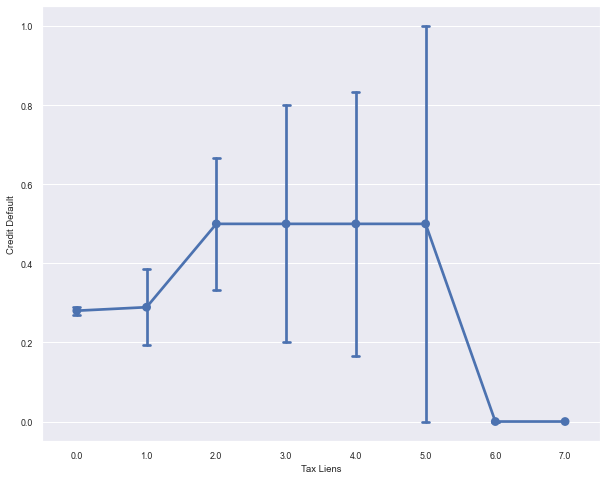

In [629]:
plt.figure(figsize=(10, 8))

sns.pointplot(x='Tax Liens', y=target, data=df_train, capsize=.1,);

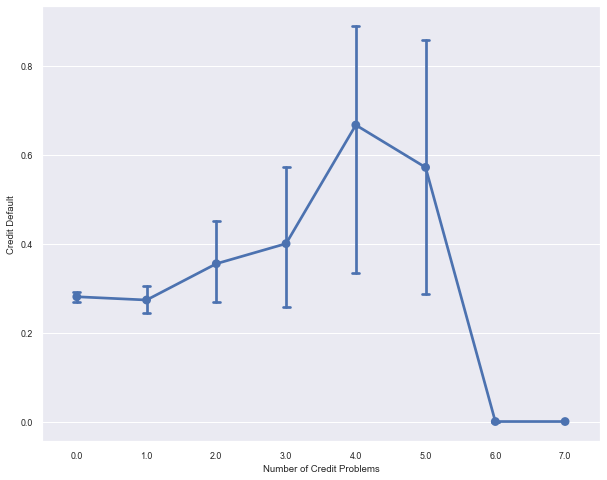

In [630]:
plt.figure(figsize=(10, 8))

sns.pointplot(x='Number of Credit Problems', y=target, data=df_train, capsize=.1,);

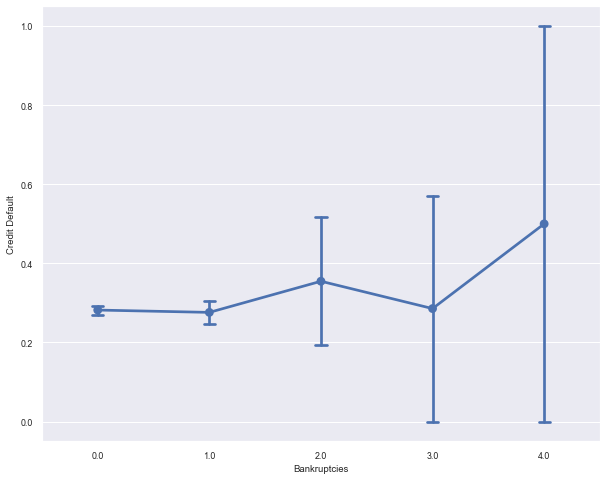

In [631]:
plt.figure(figsize=(10, 8))

sns.pointplot(x='Bankruptcies', y=target, data=df_train, capsize=.1,);

**Вывод:** Можно переопределить категории в train:
 1) у признака 'Tax Liens': 0 (0, 1), 1 (2, 3, 4, 5), 2 (6, 7) \
 2) у признака 'Number of Credit Problems': 0 (0, 1), 1 (2, 3), 2 (4), 3 (5), 4 (6,7) \
 3) у признака 'Bankruptcies': 0 (0, 1), 1 (2, 3, 4) \
 Но, поскольку у признаков разные множества значений, сначала преобразуем датасеты df_train и df_test, а потом проанализируем еще раз.

**Матрица корреляций**

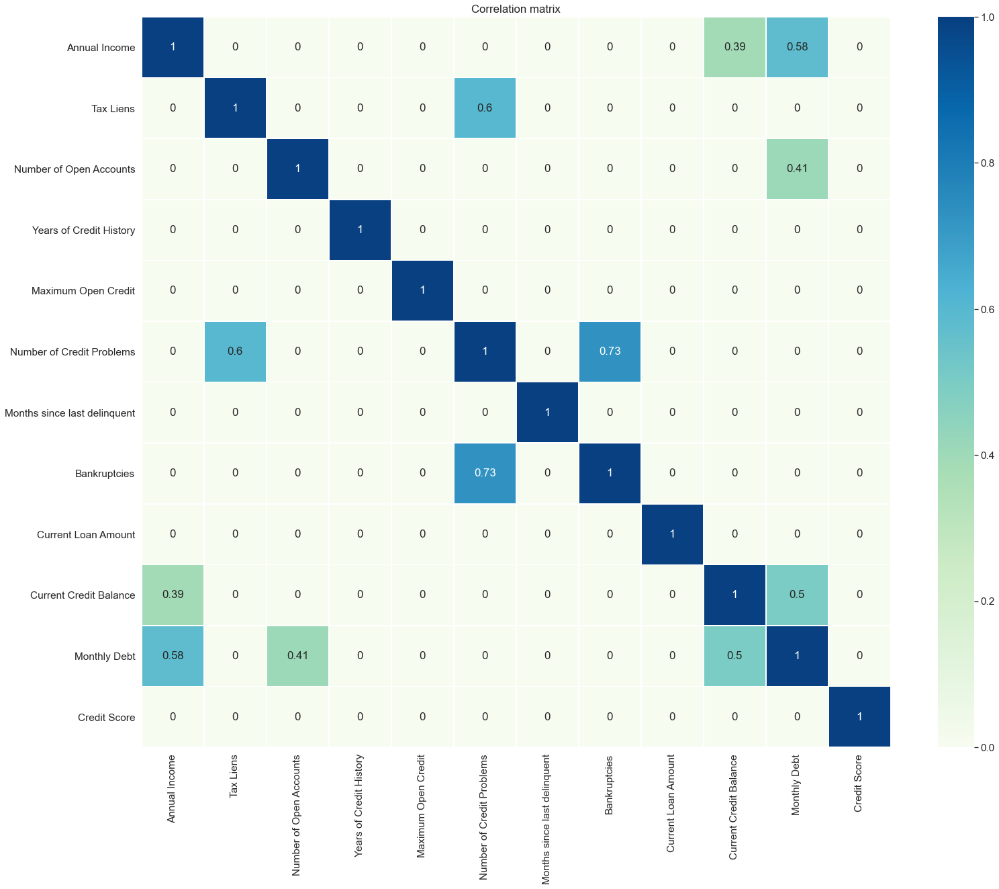

In [632]:
plt.figure(figsize = (25,20))

sns.set(font_scale=1.4)

corr_matrix = df_train[df_train.columns.drop(target).tolist()].corr()
corr_matrix = np.round(corr_matrix, 2)
corr_matrix[np.abs(corr_matrix) < 0.3] = 0

sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='GnBu')

plt.title('Correlation matrix')
plt.show()

**Приведение типов**

In [633]:
# Определяем признаки, в котороых фиксированное количество значений
for colname in ['Tax Liens', 'Number of Credit Problems', 'Bankruptcies']:
    X[colname] = X[colname].astype(str)

In [634]:
X.dtypes

Home Ownership                   object
Annual Income                   float64
Years in current job             object
Tax Liens                        object
Number of Open Accounts         float64
Years of Credit History         float64
Maximum Open Credit             float64
Number of Credit Problems        object
Months since last delinquent    float64
Bankruptcies                     object
Purpose                          object
Term                             object
Current Loan Amount             float64
Current Credit Balance          float64
Monthly Debt                    float64
Credit Score                    float64
dtype: object

**Обзор количественных признаков**

In [635]:
# Собираем количественные признаки
num_features = X.select_dtypes(include=['float64','int64']).columns.tolist()

#Смотрим статистики по количественным признакам
X[num_features].describe()

,Annual Income,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Months since last delinquent,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
count,5.943000e+03,7500.000000,7500.000000,7.500000e+03,3419.000000,7.500000e+03,7.500000e+03,7500.000000,5943.000000
mean,1.366392e+06,11.130933,18.317467,9.451537e+05,34.692600,1.187318e+07,2.898332e+05,18314.454133,1151.087498
std,8.453392e+05,4.908924,7.041946,1.602622e+07,21.688806,3.192612e+07,3.178714e+05,11926.764673,1604.451418
min,1.645970e+05,2.000000,4.000000,0.000000e+00,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000
25%,8.443410e+05,8.000000,13.500000,2.792295e+05,16.000000,1.801690e+05,1.142565e+05,10067.500000,711.000000
50%,1.168386e+06,10.000000,17.000000,4.781590e+05,32.000000,3.095730e+05,2.093230e+05,16076.500000,731.000000
75%,1.640137e+06,14.000000,21.800000,7.935015e+05,50.000000,5.198820e+05,3.604062e+05,23818.000000,743.000000
max,1.014934e+07,43.000000,57.700000,1.304726e+09,118.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000


***Вывод:*** замечаем отличие медианы от среднего у признаков 'Maximum Open Credit', 'Months since last delinquent', 'Current Loan Amount', 'Monthly Debt', 'Credit Score'. Исследуем далее эти признаки на выбросы.

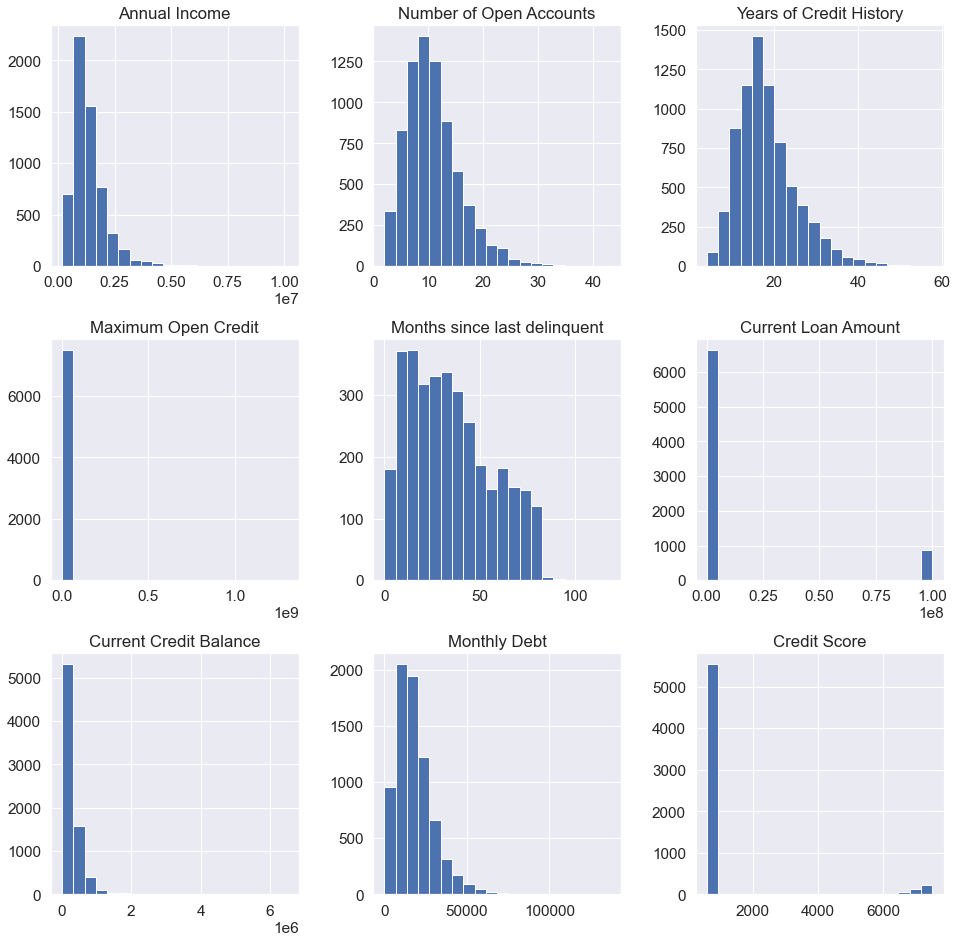

In [636]:
# Строим гистограммы для признаков
X[num_features].hist(figsize=(16,16), bins=20, grid=True);

***Вывод:*** Гистограммы и описание признаков показывают, что дальнейшего изучения требуют признаки 'Maximum Open Credit', 'Months since last delinquent', 'Current Loan Amount', 'Current Credit Balance', 'Credit Score'. Исследуем далее эти признаки на выбросы.

In [637]:
# Замечаем пропуски в признаках 'Annual Income', 'Months since last delinquent','Credit Score'
X[num_features].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Annual Income                 5943 non-null   float64
 1   Number of Open Accounts       7500 non-null   float64
 2   Years of Credit History       7500 non-null   float64
 3   Maximum Open Credit           7500 non-null   float64
 4   Months since last delinquent  3419 non-null   float64
 5   Current Loan Amount           7500 non-null   float64
 6   Current Credit Balance        7500 non-null   float64
 7   Monthly Debt                  7500 non-null   float64
 8   Credit Score                  5943 non-null   float64
dtypes: float64(9)
memory usage: 527.5 KB


**Обзор категориальных признаков**

In [638]:
# Собираем категориальные признаки
cat_features = X.select_dtypes(include='object').columns.tolist()

# Смотрим значения категориальных признаков
for cat_feature in cat_features:
    print(str(cat_feature + '\n\n' + str(X[cat_feature].value_counts()) + '\n' + '*' * 100 + '\n'))

Home Ownership

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: Home Ownership, dtype: int64
****************************************************************************************************

Years in current job

10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64
****************************************************************************************************

Tax Liens

0.0    7366
1.0      83
2.0      30
3.0      10
4.0       6
6.0       2
5.0       2
7.0       1
Name: Tax Liens, dtype: int64
****************************************************************************************************

Number of Credit Problems

0.0    6469
1.0     882
2.0      93
3.0      35
4.0       9
5.0       7
6.0       4
7.0       1
Name: Number of Credit Problems, d

***Вывод:*** в признакe 'Bankruptcies' неопределенное значение. Исследуем этот признак далее на выбросы.

In [639]:
# Замечаем пропуски в признаках 'Years in current job'
X[cat_features].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Home Ownership             7500 non-null   object
 1   Years in current job       7129 non-null   object
 2   Tax Liens                  7500 non-null   object
 3   Number of Credit Problems  7500 non-null   object
 4   Bankruptcies               7500 non-null   object
 5   Purpose                    7500 non-null   object
 6   Term                       7500 non-null   object
dtypes: object(7)
memory usage: 410.3+ KB


### $\S1.4$. Обработка выбросов<a class="anchor" id="par1.4">

Данные по признаку Annual Income и их количество 
 164597.0      1
175845.0      1
177251.0      1
191577.0      1
192223.0      1
             ..
8710740.0     1
8758449.0     1
8923844.0     1
9338880.0     1
10149344.0    1
Name: Annual Income, Length: 5478, dtype: int64
Описание признака Annual Income: count    5.943000e+03
mean     1.366392e+06
std      8.453392e+05
min      1.645970e+05
25%      8.443410e+05
50%      1.168386e+06
75%      1.640137e+06
max      1.014934e+07
Name: Annual Income, dtype: float64


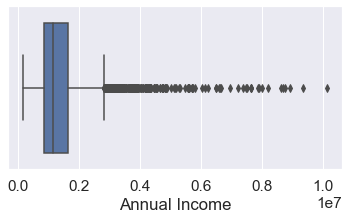

Данные по признаку Number of Open Accounts и их количество 
 2.0      28
3.0      95
4.0     212
5.0     325
6.0     504
7.0     613
8.0     638
9.0     728
10.0    677
11.0    692
12.0    562
13.0    465
14.0    420
15.0    313
16.0    265
17.0    232
18.0    143
19.0    139
20.0     93
21.0     78
22.0     49
23.0     59
24.0     50
25.0     32
26.0     12
27.0     14
28.0     14
29.0     10
30.0     11
31.0      6
32.0      6
33.0      6
34.0      2
35.0      1
37.0      2
38.0      1
41.0      1
42.0      1
43.0      1
Name: Number of Open Accounts, dtype: int64
Описание признака Number of Open Accounts: count    7500.000000
mean       11.130933
std         4.908924
min         2.000000
25%         8.000000
50%        10.000000
75%        14.000000
max        43.000000
Name: Number of Open Accounts, dtype: float64


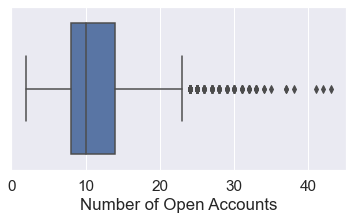

Данные по признаку Years of Credit History и их количество 
 4.0     1
4.3     1
4.5     2
4.7     2
4.8     4
       ..
51.3    1
51.5    1
51.9    1
52.2    1
57.7    1
Name: Years of Credit History, Length: 408, dtype: int64
Описание признака Years of Credit History: count    7500.000000
mean       18.317467
std         7.041946
min         4.000000
25%        13.500000
50%        17.000000
75%        21.800000
max        57.700000
Name: Years of Credit History, dtype: float64


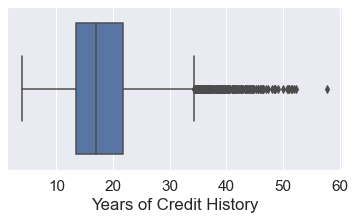

Данные по признаку Maximum Open Credit и их количество 
 0.000000e+00    65
4.334000e+03     1
6.556000e+03     1
6.622000e+03     1
1.089000e+04     1
                ..
4.092389e+07     1
5.756256e+07     1
2.655129e+08     1
3.800523e+08     1
1.304726e+09     1
Name: Maximum Open Credit, Length: 6963, dtype: int64
Описание признака Maximum Open Credit: count    7.500000e+03
mean     9.451537e+05
std      1.602622e+07
min      0.000000e+00
25%      2.792295e+05
50%      4.781590e+05
75%      7.935015e+05
max      1.304726e+09
Name: Maximum Open Credit, dtype: float64


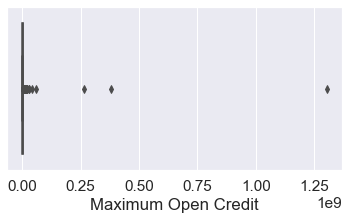

Данные по признаку Months since last delinquent и их количество 
 0.0      18
1.0      26
2.0      25
3.0      30
4.0      31
         ..
84.0      1
86.0      1
91.0      1
92.0      1
118.0     1
Name: Months since last delinquent, Length: 89, dtype: int64
Описание признака Months since last delinquent: count    3419.000000
mean       34.692600
std        21.688806
min         0.000000
25%        16.000000
50%        32.000000
75%        50.000000
max       118.000000
Name: Months since last delinquent, dtype: float64


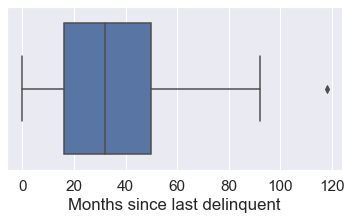

Данные по признаку Current Loan Amount и их количество 
 11242.0         1
21472.0         2
21516.0         1
21560.0         1
21582.0         1
             ... 
788634.0        2
788788.0        1
788942.0        1
789030.0        1
99999999.0    870
Name: Current Loan Amount, Length: 5386, dtype: int64
Описание признака Current Loan Amount: count    7.500000e+03
mean     1.187318e+07
std      3.192612e+07
min      1.124200e+04
25%      1.801690e+05
50%      3.095730e+05
75%      5.198820e+05
max      1.000000e+08
Name: Current Loan Amount, dtype: float64


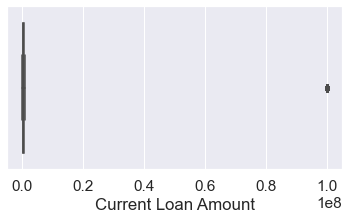

Данные по признаку Current Credit Balance и их количество 
 0.0          53
19.0          3
57.0          2
76.0          2
95.0          1
             ..
4209659.0     1
4249673.0     1
4367245.0     1
4720132.0     1
6506797.0     1
Name: Current Credit Balance, Length: 6592, dtype: int64
Описание признака Current Credit Balance: count    7.500000e+03
mean     2.898332e+05
std      3.178714e+05
min      0.000000e+00
25%      1.142565e+05
50%      2.093230e+05
75%      3.604062e+05
max      6.506797e+06
Name: Current Credit Balance, dtype: float64


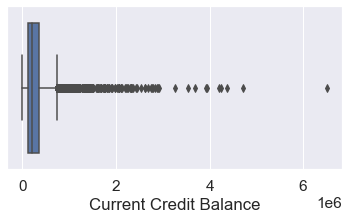

Данные по признаку Monthly Debt и их количество 
 0.0         6
17.0        1
21.0        1
42.0        1
57.0        1
           ..
96177.0     1
100091.0    1
104036.0    1
110311.0    1
136679.0    1
Name: Monthly Debt, Length: 6716, dtype: int64
Описание признака Monthly Debt: count      7500.000000
mean      18314.454133
std       11926.764673
min           0.000000
25%       10067.500000
50%       16076.500000
75%       23818.000000
max      136679.000000
Name: Monthly Debt, dtype: float64


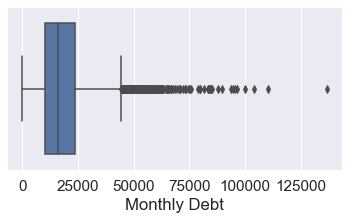

Данные по признаку Credit Score и их количество 
 585.0     1
586.0     1
588.0     1
589.0     1
590.0     1
         ..
7470.0    4
7480.0    6
7490.0    2
7500.0    2
7510.0    2
Name: Credit Score, Length: 268, dtype: int64
Описание признака Credit Score: count    5943.000000
mean     1151.087498
std      1604.451418
min       585.000000
25%       711.000000
50%       731.000000
75%       743.000000
max      7510.000000
Name: Credit Score, dtype: float64


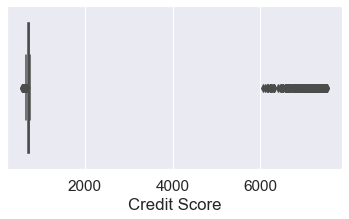

In [640]:
# Ищем выбросы в количественных признаках
for feature in num_features:
    blowout_in_features_train(feature)

***Вывод:*** \
    1) в признаке 'Maximum Open Credit' "подозрительное" значение 0 \
    2) в признаке 'Months since last delinquent' выброс >100 \
    3) в признаке 'Current Loan Amount' сумма 99999999.0 (870 раз) -- выброс \
    4) в признаке 'Monthly Debt' подозрительное значение 0 \
    5) в признаке 'Credit Score' значения > 6000 -- выброс или ошибка в сборе данных

***'Maximum Open Credit'*** наибольший открытый кредит (максимальная сумма, которая когда-либо была доступна клиенту)

In [641]:
# Смотрим где наибольший открытый кредит равен 0
# Замечаем, что есть значения с нулевым и ненулевым балансом, сумма не ноль, ежемесячный долг тоже может быть 0
X.loc[X['Maximum Open Credit'] == 0, ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()
# Видим: клиент никогда не брал кредит, а суммы которую нужно выплатить есть -- ошибка в данных

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
8,0.0,129734.0,19.0,17.0
91,0.0,165924.0,0.0,9021.0
196,0.0,218042.0,0.0,5855.0
294,0.0,108042.0,0.0,30340.0
309,0.0,338096.0,0.0,395.0


***'Current Loan Amount'*** текущая сумма кредита (сумма, которую еще предстоит выплатить клиенту) \
и ***'Current Credit Balance'*** текущий кредитный баланс (сумма, которую может тратить клиент с кредитного счета)

In [642]:
# Заметили странное значение 99999999 в 'Current Loan Amount' повторяется 870 раза
X.loc[(X['Current Loan Amount'] > 90000000) & (X['Current Credit Balance'] > 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
0,685960.0,99999999.0,47386.0,7914.0
2,1182434.0,99999999.0,308389.0,13651.0
6,388124.0,99999999.0,51623.0,2317.0
22,288442.0,99999999.0,157700.0,5063.0
27,328394.0,99999999.0,195966.0,6041.0


In [643]:
# 1. Заменяем выброс в данных на текущий ненулевой кредитный баланс
X.loc[(X['Current Loan Amount'] > 90000000) & (X['Current Credit Balance'] > 0), 'Current Loan Amount'] = X.loc[(X['Current Loan Amount'] > 90000000) & (X['Current Credit Balance'] > 0), 'Current Credit Balance']

In [644]:
# 1 случай
# Смотрим где максимальный открытый кредит, текущий кредитный баланс и ежемесячный долг 0
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] == 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
780,0.0,75350.0,0.0,0.0
1643,0.0,332156.0,0.0,0.0
3219,0.0,79200.0,0.0,0.0
3496,0.0,210166.0,0.0,0.0
4165,0.0,99999999.0,0.0,0.0


In [645]:
# 2. Заменяем "странную" сумму 99999999 медианой 
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] == 0) & (X['Current Loan Amount'] == 99999999.0), 'Current Loan Amount'] =\
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] == 0), 'Current Loan Amount'].median()

In [646]:
# 3. Заменяем нулевой ежемесячный долг на 30% от зарплаты
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] == 0), 'Monthly Debt'] =\
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] == 0), 'Annual Income'].fillna(X['Annual Income'].median()) * 0.03

In [647]:
# 2 случай
# Смотрим где максимальный открытый кредит 0, текущий кредитный баланс 0 и ежемесячный долг не 0
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] != 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
91,0.0,165924.0,0.0,9021.0
196,0.0,218042.0,0.0,5855.0
294,0.0,108042.0,0.0,30340.0
309,0.0,338096.0,0.0,395.0
319,0.0,76670.0,0.0,6432.0


In [648]:
# 4. Заменяем "странную" сумму 99999999 медианой 
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] == 99999999.0), 'Current Loan Amount'] = X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0) & (X['Monthly Debt'] != 0), 'Current Loan Amount'].median()

In [649]:
# 5. В случаях 1 и 2 (Максимальный кредит и баланс 0) заменяем нулевой максимальный открытый кредит на текущую кредитную сумму
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0), 'Maximum Open Credit'] =\
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] == 0), 'Current Loan Amount']

In [650]:
# 3 случай
# Смотрим где максимальный открытый кредит 0, текущий кредитный баланс не 0 и ежемесячный долг 0
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] == 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']]
# таких данных нет

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt


In [651]:
# 4 случай
# Смотрим где максимальный открытый кредит 0, текущий кредитный баланс не 0 и ежемесячный долг не 0
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
8,0.0,129734.0,19.0,17.0
602,0.0,60439.0,60439.0,15485.0
611,0.0,54494.0,7163.0,14948.0
1984,0.0,2759503.0,2759503.0,12919.0
2081,0.0,593406.0,659471.0,24672.0


In [652]:
# 6. Заменяем "странную" сумму 99999999 медианой 
#X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] == 99999999.0), 'Current Loan Amount'] = X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Current Loan Amount'].median()

In [653]:
# Смотрим где текущая сумма кредита меньше текущего кредитного баланса
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] < X['Current Credit Balance']), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']]

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
2081,0.0,593406.0,659471.0,24672.0


In [654]:
# 7. Заменяем текущую сумму кредита на текущий кредитный баланс
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] < X['Current Credit Balance']), 'Current Loan Amount'] =\
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] < X['Current Credit Balance']), 'Current Credit Balance']

In [655]:
# 8. Заменяем максимально открытый кредит на текущий сумму кредита
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Maximum Open Credit'] =\
X.loc[(X['Maximum Open Credit'] == 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Current Credit Balance']

In [656]:
# 5 случай
# Смотрим где максимальный открытый кредит не 0, текущий кредитный баланс не 0 и ежемесячный долг 0
X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] == 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()
# Таких данных нет

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt


In [657]:
# 6 случай
# Смотрим где максимальный открытый кредит не 0, текущий кредитный баланс не 0 и ежемесячный долг не 0
X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
0,685960.0,47386.0,47386.0,7914.0
1,1181730.0,264968.0,394972.0,18373.0
2,1182434.0,308389.0,308389.0,13651.0
3,147400.0,121396.0,95855.0,11338.0
4,385836.0,125840.0,93309.0,7180.0


In [658]:
# 9. Заменяем "странную" сумму 99999999 медианой 
#X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] == 99999999.0), 'Current Loan Amount'] = X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Current Loan Amount'].median()

In [659]:
# Смотрим где текущая сумма кредита меньше текущего кредитного баланса
X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] < X['Current Credit Balance']), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt
1,1181730.0,264968.0,394972.0,18373.0
13,1654026.0,549780.0,1037077.0,21869.0
14,1602546.0,185262.0,1374327.0,58352.0
16,899492.0,313038.0,538346.0,18844.0
17,1042096.0,498872.0,689396.0,52249.0


In [660]:
# 10. Заменяем текущую сумму кредита на текущий кредитный баланс
X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] < X['Current Credit Balance']), 'Current Loan Amount'] =\
X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Current Loan Amount'] < X['Current Credit Balance']), 'Current Credit Balance']

In [661]:
# Смотрим сумма максимального кредита меньше текущего кредитного баланса
X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0) & (X['Maximum Open Credit'] < X['Current Credit Balance']), ['Maximum Open Credit','Current Loan Amount', 'Current Credit Balance', 'Monthly Debt']].head()
# таких данных нет

,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt


In [662]:
# 11. Заменяем максимально открытый кредит на текущую кредитную сумму
#X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Maximum Open Credit'] = X.loc[(X['Maximum Open Credit'] != 0) & (X['Current Credit Balance'] != 0) & (X['Monthly Debt'] != 0), 'Current Loan Amount']

***'Months since last delinquent'*** количество месяцев с последней просрочки платежа

In [663]:
# 12. Величину почти в 10 раз большую медианы заменяем на медиану
X.loc[X['Months since last delinquent'] > 100, 'Months since last delinquent'] =\
X['Months since last delinquent'].median()

***'Credit Score'*** баллы кредитного рейтинга

In [664]:
# 13. Заменяем, что есть 110 величин больше 6000 - величины почти в 10 раз больше остальных.
#Скорее всего, это ошибка в сборе данных, разделим эти значения на 10.
X.loc[X['Credit Score'] > 6000, 'Credit Score'] =\
X.loc[X['Credit Score'] > 6000, 'Credit Score'] / 10

***'Bankruptcies'*** банкротства

In [665]:
# 14. Заменяем неопознанные значения на моду
X.loc[X['Bankruptcies'] == 'nan', 'Bankruptcies'] =\
X['Bankruptcies'].mode()[0]

### $\S1.5$. Обработка пропусков<a class="anchor" id="par1.5">

In [666]:
# Отмечаем признаки с пропусками
X.isna().sum()

Home Ownership                     0
Annual Income                   1557
Years in current job             371
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    4081
Bankruptcies                       0
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                    1557
dtype: int64

***'Annual Income'*** годовой доход

In [667]:
X['Annual Income'].fillna(X['Annual Income'].median(), inplace=True)

***'Years in current job'*** количество лет на текущем месте работы

In [668]:
X['Years in current job'].fillna(X['Years in current job'].mode()[0], inplace=True)

***'Months since last delinquent'*** количество месяцев с последней просрочки платежа

In [669]:
X['Months since last delinquent'].fillna(X['Months since last delinquent'].median(), inplace=True)

***'Credit Score'*** баллы кредитного рейтинга

In [670]:
X['Credit Score'].fillna(X['Credit Score'].median(), inplace=True)

In [671]:
# Отмечаем, что пропусков нет
#X.isna().sum()

### $\S1.6$. Построение новых признаков<a class="anchor" id="par1.6">

**Dummies**

In [672]:
# Из признака Term делаем бинарный
X['Is_Long_Term'] = X['Term'].map({'Short Term':'0', 'Long Term':'1'}).astype(int)

In [673]:
# Для всех категориальных признаков (кроме Term) делаем dummies
for cat_feature in cat_features[:-1]:
    X = pd.concat([X, pd.get_dummies(X[cat_feature], prefix=cat_feature)], axis=1)

In [674]:
# 1. Добавляем признак 'Tax Liens_15.0' (потому что он есть в test)
X['Tax Liens_15.0'] = 0

In [675]:
# 2. Добавляем признак 'Number of Credit Problems_15.0' (потому что он есть в test)
X['Number of Credit Problems_15.0'] = 0

In [676]:
# 3. Добавляем признак 'Bankruptcies_5.0' (потому что он есть в test)
X['Bankruptcies_5.0' ] = 0

**Feature  binarization and encoding**

In [677]:
#1. Определяем, был ли скрыт годовой доход
X['Is Hidden Income'] =(df_train['Annual Income'].isnull()).astype('int64')

In [678]:
#2. Определяем было ли скрыто количество лет на последнем месте работы
X['Is Hidden Years in current job'] =(df_train['Years in current job'].isnull()).astype('int64')

In [679]:
#3. Проверяем разницу между зарплатой и ежемесячным платежом
X['Salary and Mount Debt Difference'] = X['Annual Income']/12 - X['Monthly Debt']

In [680]:
#4. Проверяем разницу текущей кредитной суммой и текущим кредитным балансом
X['Current Loan Amount and Current Credit Balance Difference'] = X['Current Loan Amount'] - X['Current Credit Balance']

In [681]:
#5. Количество банкронств равно количеству проблем с кредитом
X['Bankruptcies equal Number of Credit Problems'] =(X['Bankruptcies'] == X['Number of Credit Problems']).astype('int64')
#df_test['Bankruptcies equal Number of Credit Problems'] =(df_test['Bankruptcies'] == df_test['Number of Credit Problems']).astype('int64')

In [682]:
#6. Доля проблемных кредитов
X['Share of Problem Loans'] = X['Number of Credit Problems'].astype('float64')/X['Number of Open Accounts']

In [683]:
# 7. Вычислим медианное значение лет кредитной истории по каждому числу открытых счетов
d = X.groupby('Number of Open Accounts', as_index=False).median()[['Number of Open Accounts', 'Years of Credit History']].rename(columns={
    'Years of Credit History': 'Years of Credit History encode Number of Open Accounts'})
X = X.merge(d, on='Number of Open Accounts', how='left')

In [684]:
# 8. Определяем является ли доход больше среднего
X['Small Annual Income'] = (X['Annual Income'] < X['Annual Income'].median()).astype('int64')

In [685]:
# 9. Вычисляем медианное значение в количестве месяцев просрочки платежа по числу кредитных проблем
e = X.groupby('Number of Credit Problems', as_index=False).median()[['Number of Credit Problems', 'Months since last delinquent']].rename(columns={
    'Months since last delinquent': 'Months since last delinquent encode Number of Credit Problems'})
e
X = X.merge(e, on='Number of Credit Problems', how='left')

**Target encoding** \
для категориальных признаков, кроме 'Tax Liens', 'Number of Credit Problems', 'Bankruptcies' (по этим признакам train и test имеют разное множество значений)

In [686]:
#1.target encording для Home Ownership
ho= pd.concat([X,df_train[target]], axis=1).\
         groupby('Home Ownership', as_index=False).mean()[['Home Ownership', target]].\
         rename(columns={target: 'Target_encode_Home Ownership'})
ho = pd.DataFrame(ho)

X = X.merge(ho, on='Home Ownership', how='left')

In [687]:
#2.target encording для Years in current job
yj= pd.concat([X,df_train[target]], axis=1).\
         groupby('Years in current job', as_index=False).mean()[['Years in current job', target]].\
         rename(columns={target: 'Target_encode_Years in current job'})
yj = pd.DataFrame(yj)

X = X.merge(yj, on='Years in current job', how='left')

In [688]:
#3.target encording для Term
trm= pd.concat([X,df_train[target]], axis=1).\
         groupby('Term', as_index=False).mean()[['Term', target]].\
         rename(columns={target: 'Target_encode_Term'})
trm = pd.DataFrame(trm)

X = X.merge(trm, on='Term', how='left')

In [689]:
#4.target encording для Purpose
purp= pd.concat([X,df_train[target]], axis=1).\
         groupby('Purpose', as_index=False).mean()[['Purpose', target]].\
         rename(columns={target: 'Purpose_encode_Term'})
purp = pd.DataFrame(purp)

X = X.merge(purp, on='Purpose', how='left')

In [690]:
print(f'Форма датасета X: {X.shape}')
#X.columns.to_list()
#X.info()

Форма датасета X: (7500, 84)


**Сохранение тренировочного датасета**

In [691]:
X.to_csv('train_prep.csv', index=None)

### $\S1.7$. Обработка датасета test<a class="anchor" id="par1.7">

In [692]:
# Преобразуем датасет df_test (выбросы, пропуски, dummies, Feature  binarization and encoding)
df_test_prep = prep_test_dataset(df_test)
df_test_prep.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,...,Purpose_renewable energy,Is Hidden Income,Is Hidden Years in current job,Salary and Mount Debt Difference,Current Loan Amount and Current Credit Balance Difference,Bankruptcies equal Number of Credit Problems,Share of Problem Loans,Years of Credit History encode Number of Open Accounts,Small Annual Income,Months since last delinquent encode Number of Credit Problems
0,Rent,1178475.0,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,...,0,0,0,91393.250000,56564.0,1,0.0,17.4,0,30.0
1,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,...,0,0,0,17001.833333,32261.0,1,0.0,15.2,1,30.0
2,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,30.0,0.0,...,0,0,0,77316.000000,53688.0,1,0.0,16.9,1,30.0
3,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,...,0,0,0,74133.750000,4183.0,1,0.0,17.8,0,30.0
4,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,30.0,0.0,...,0,0,0,152474.333333,352243.0,1,0.0,17.6,0,30.0


In [693]:
# Присоединяем target encording
df_test_prep = df_test_prep.merge(ho, on='Home Ownership', how='left')

df_test_prep = df_test_prep.merge(yj, on='Years in current job', how='left')

df_test_prep = df_test_prep.merge(trm, on='Term', how='left')

df_test_prep = df_test_prep.merge(purp, on='Purpose', how='left')

In [694]:
# Проверяем, что признаки у test и train после преобразований совпадают
set(X.columns.to_list()) == set(df_test_prep.columns.to_list())

# Пропусков нет

True

**Сохранение тестового датасета**

In [695]:
df_test_prep.to_csv('test_prep.csv', index=None)

## <center>Глава 2. Построение модели классификации<a class="anchor" id="part2"></a><center>

### $\S2.1$. Отбор признаков<a class="anchor" id="par2.1">

In [696]:
# Загружаем тренировочный датасет
X = pd.read_csv('train_prep.csv')
X.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,...,Current Loan Amount and Current Credit Balance Difference,Bankruptcies equal Number of Credit Problems,Share of Problem Loans,Years of Credit History encode Number of Open Accounts,Small Annual Income,Months since last delinquent encode Number of Credit Problems,Target_encode_Home Ownership,Target_encode_Years in current job,Target_encode_Term,Purpose_encode_Term
0,Own Home,482087.0,10+ years,0.0,11.0,26.3,685960.0,1.0,32.0,1.0,...,0.0,1,0.090909,17.5,1,32.0,0.296754,0.288938,0.233441,0.278264
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,32.0,0.0,...,0.0,1,0.000000,17.2,1,32.0,0.296754,0.288938,0.419753,0.278264
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,32.0,0.0,...,0.0,1,0.000000,17.5,1,32.0,0.251856,0.271386,0.233441,0.278264
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,32.0,1.0,...,25541.0,1,0.125000,16.5,1,32.0,0.296754,0.291080,0.233441,0.278264
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,32.0,0.0,...,32531.0,0,0.076923,17.3,1,32.0,0.313046,0.271386,0.233441,0.278264


In [697]:
# собираем числовые и категориальные признаки
cat_features = ['Home Ownership', 'Years in current job', 
                'Tax Liens', 'Number of Credit Problems', 
                'Bankruptcies', 'Purpose', 'Term']
print(f'Количество категориальных признаков: {len(cat_features)}')

num_features = [x for x in X.columns.to_list() if x not in cat_features]
print(f'Количество вещественных признаков (в том числе бинарных): {len(num_features)}')

Количество категориальных признаков: 7
Количество вещественных признаков (в том числе бинарных): 77


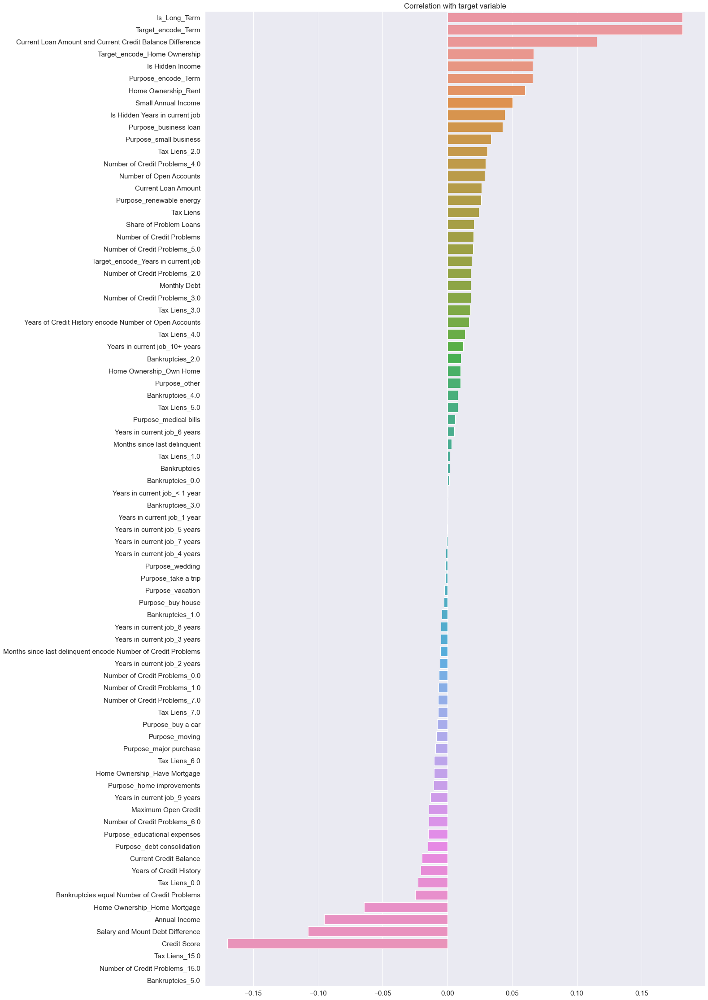

In [698]:
# Строим матрицу корреляции целевой переменной с признаками тренировочного датасета
corr_with_target = pd.concat([X, df_train[target]], axis=1).corr().iloc[:-1, -1].sort_values(ascending=False)

plt.figure(figsize=(20, 40))

sns.barplot(x=corr_with_target.values, y=corr_with_target.index)

plt.title('Correlation with target variable')
plt.show()

***Вывод:*** \
Признаки с высокой корреляцией:  'Credit Score',  'Salary and Mount Debt Difference',  'Annual Income',  'Home Ownership_Home Mortgage', 'Is_Long_Term', 'Target_encode_Term',  'Current Loan Amount and Current Credit Balance Difference', 'Target_encode_Home Ownership',  'Is Hidden Income', 'Home Ownership_Rent', 'Small Annual Income',  'Is Hidden Years in current job', 'Purpose_business loan'

**Оценка признаков датасета в разрезе целевой переменной**

Оценка признака feature = Annual Income


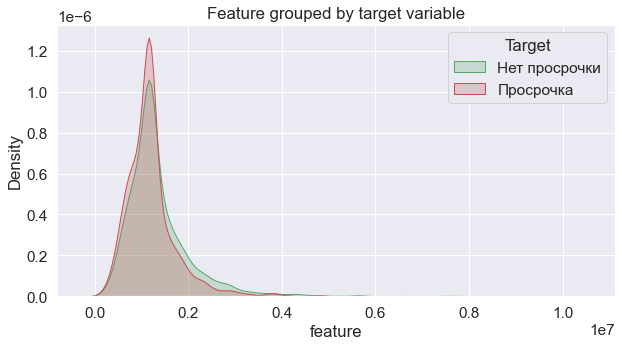

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.7313876152038574, pvalue=0.0)


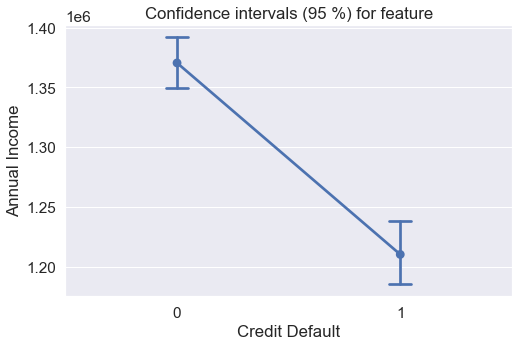

Оценка признака feature = Number of Open Accounts


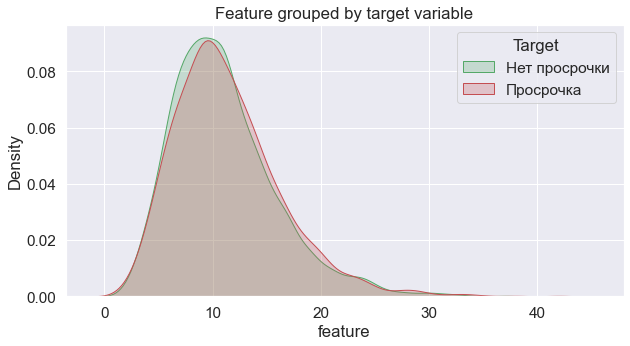

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.9372566342353821, pvalue=0.0)


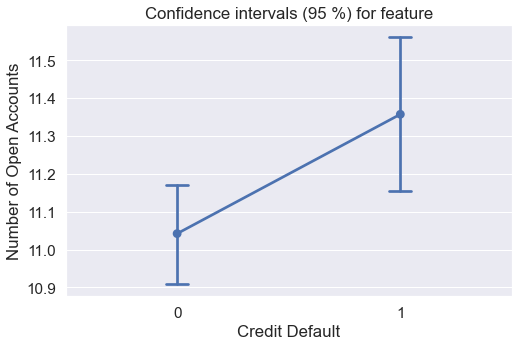

Оценка признака feature = Years of Credit History


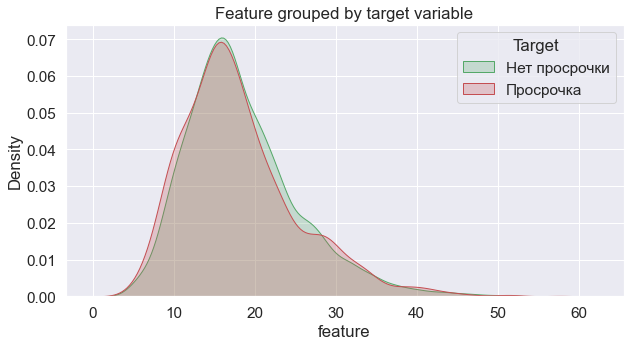

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.9434478282928467, pvalue=0.0)


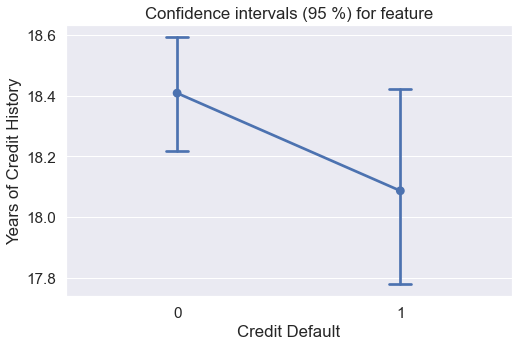

Оценка признака feature = Maximum Open Credit


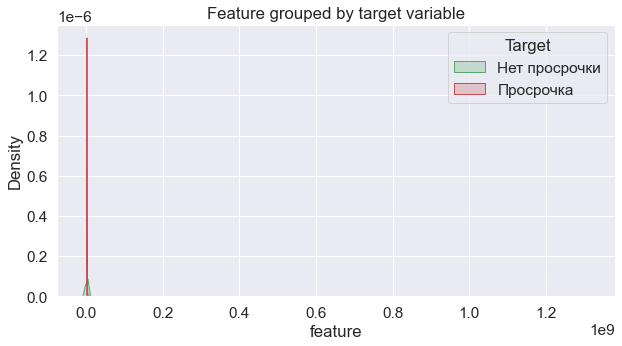

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.010393321514129639, pvalue=0.0)


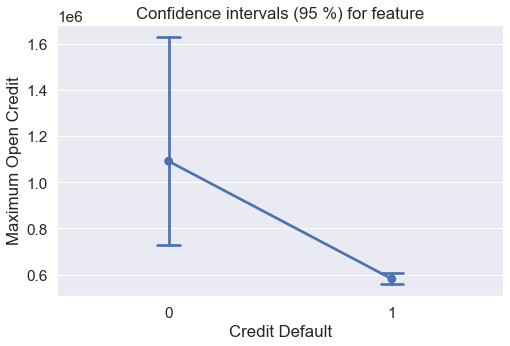

Оценка признака feature = Months since last delinquent


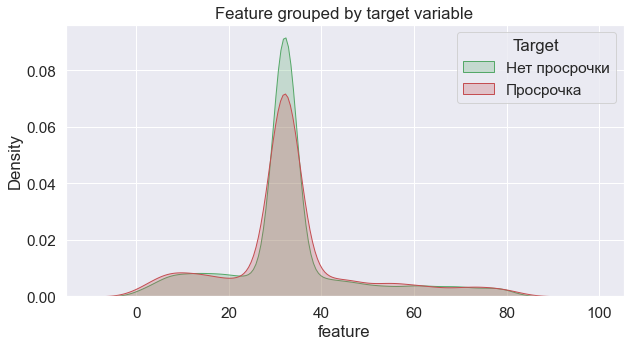

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.8236293792724609, pvalue=0.0)


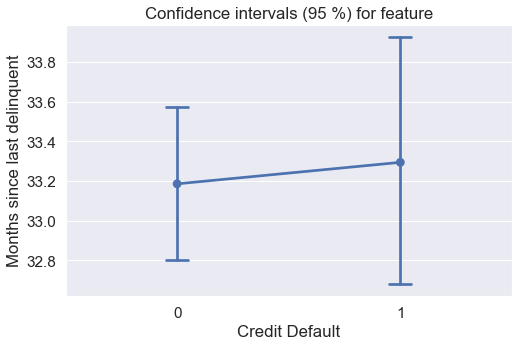

Оценка признака feature = Current Loan Amount


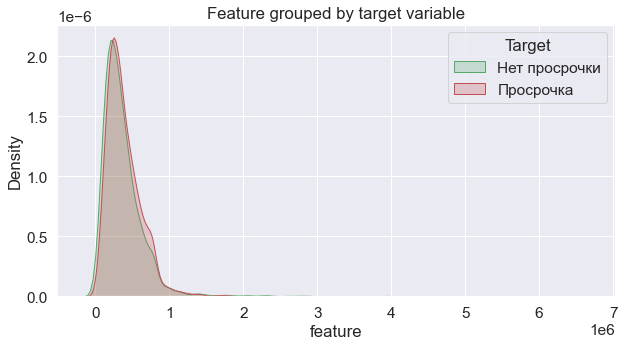

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6894267797470093, pvalue=0.0)


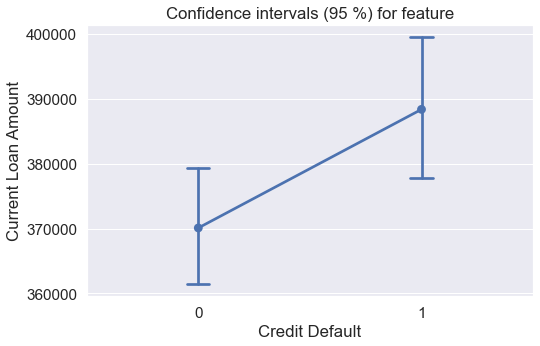

Оценка признака feature = Current Credit Balance


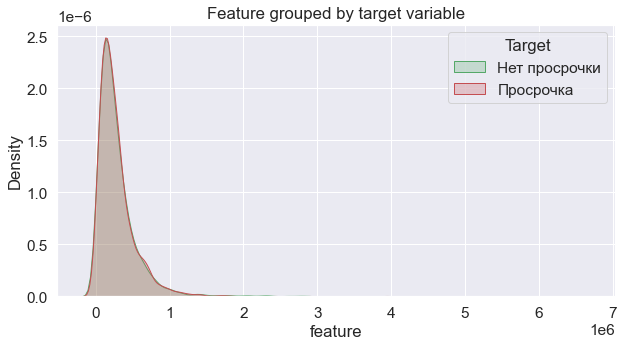

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6394237279891968, pvalue=0.0)


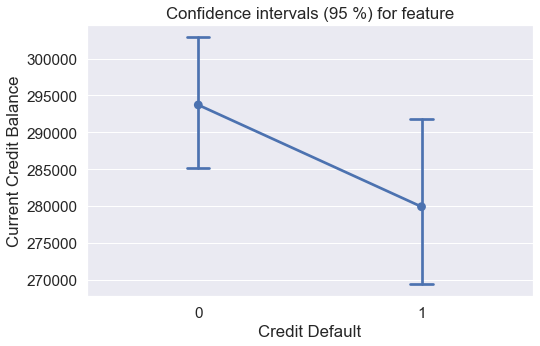

Оценка признака feature = Monthly Debt


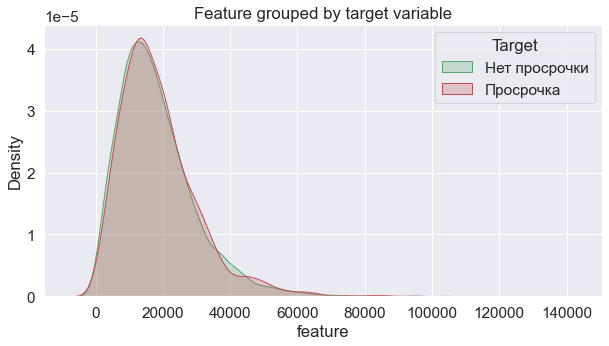

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.8935694694519043, pvalue=0.0)


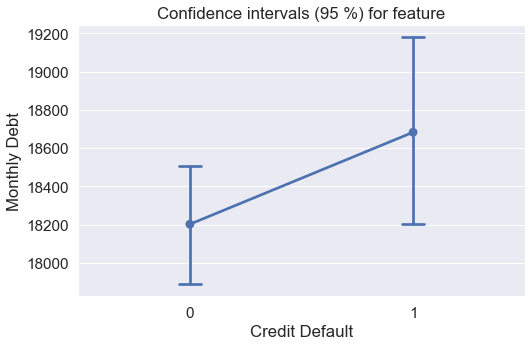

Оценка признака feature = Credit Score


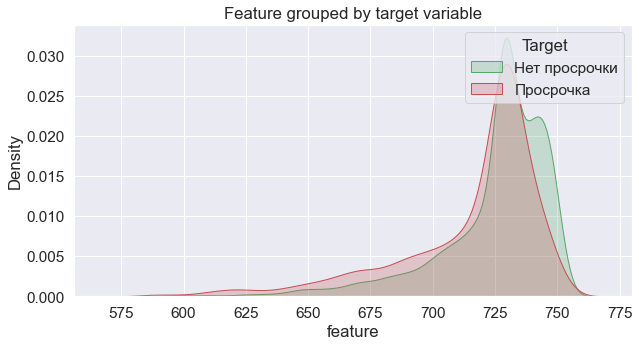

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.8110946416854858, pvalue=0.0)


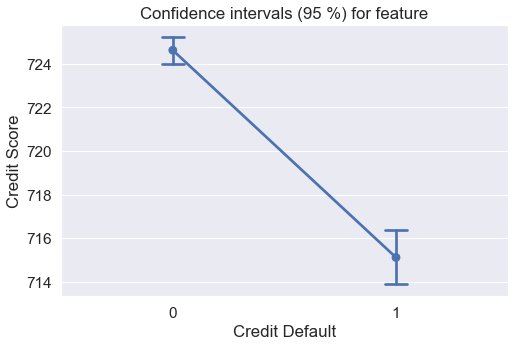

Оценка признака feature = Is_Long_Term


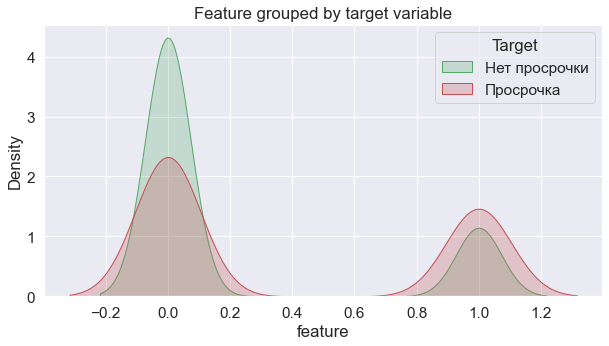

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.5461751222610474, pvalue=0.0)


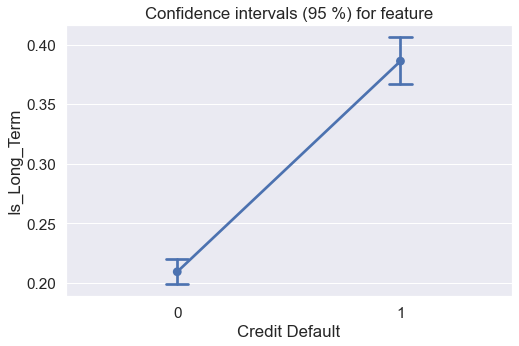

Оценка признака feature = Home Ownership_Have Mortgage


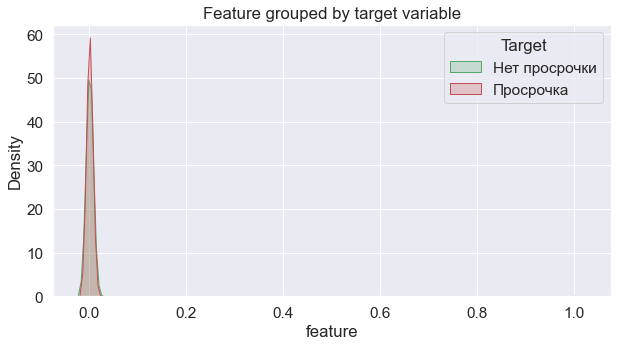

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.016807258129119873, pvalue=0.0)


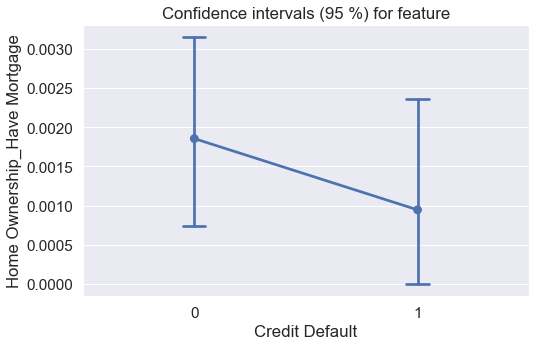

Оценка признака feature = Home Ownership_Home Mortgage


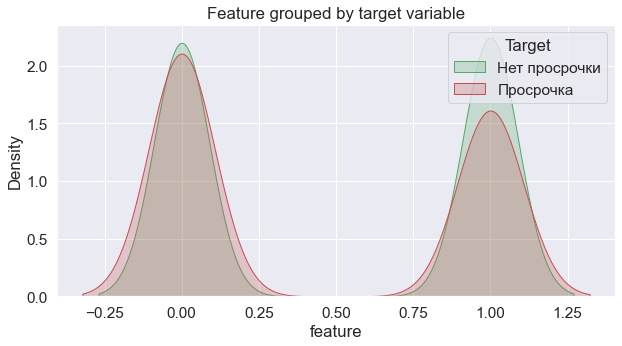

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6363198757171631, pvalue=0.0)


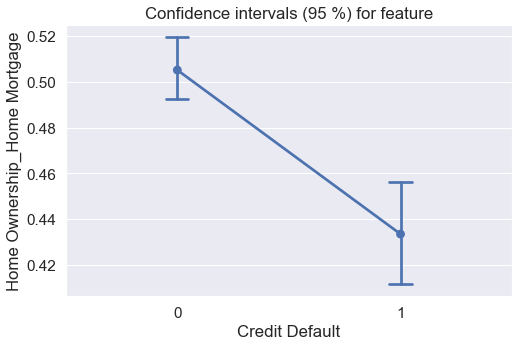

Оценка признака feature = Home Ownership_Own Home


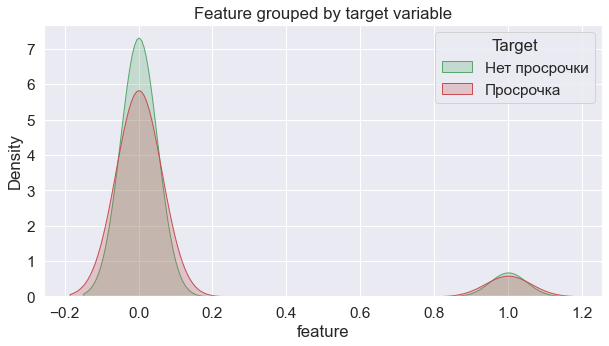

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.31404173374176025, pvalue=0.0)


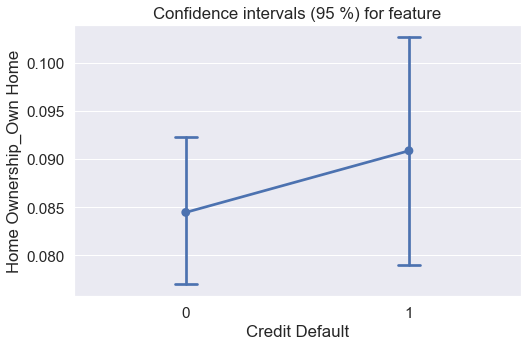

Оценка признака feature = Home Ownership_Rent


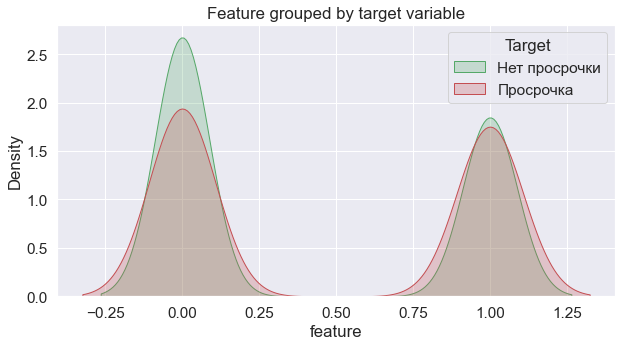

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6288520693778992, pvalue=0.0)


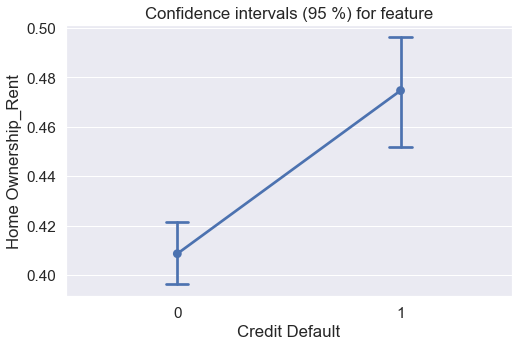

Оценка признака feature = Years in current job_1 year


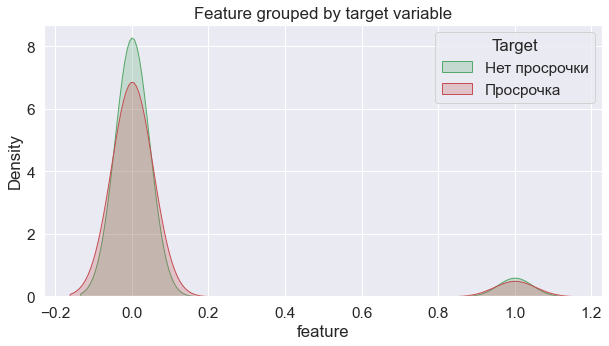

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.27001506090164185, pvalue=0.0)


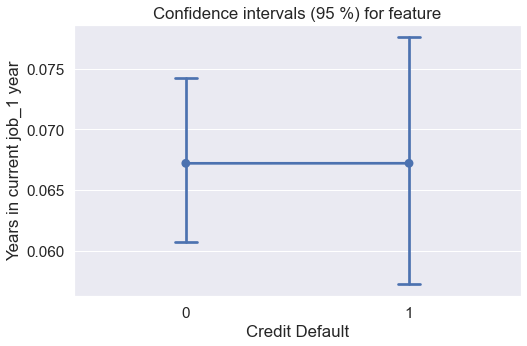

Оценка признака feature = Years in current job_10+ years


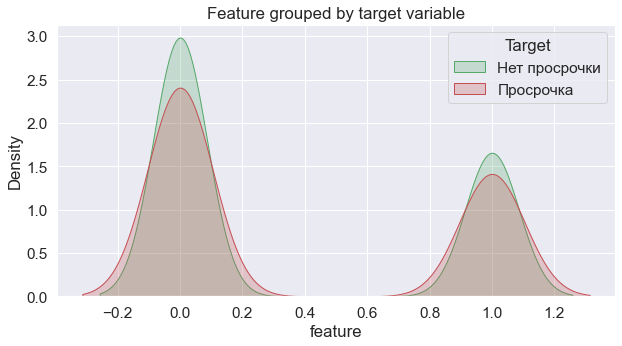

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6076691150665283, pvalue=0.0)


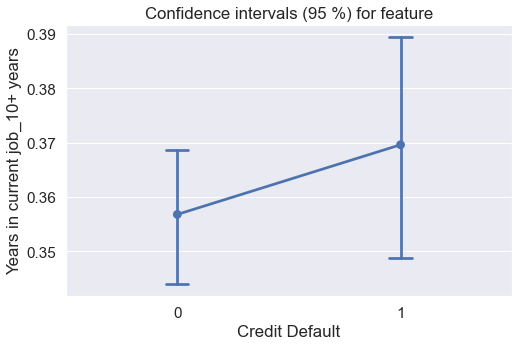

Оценка признака feature = Years in current job_2 years


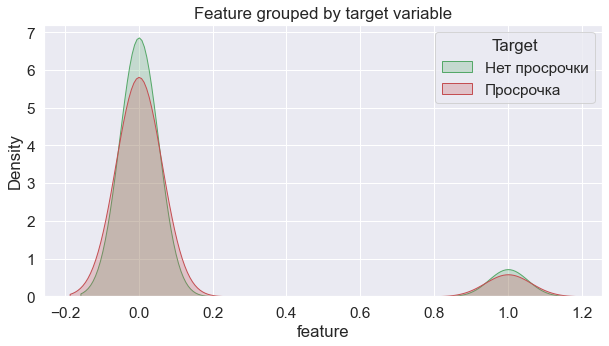

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.3302181363105774, pvalue=0.0)


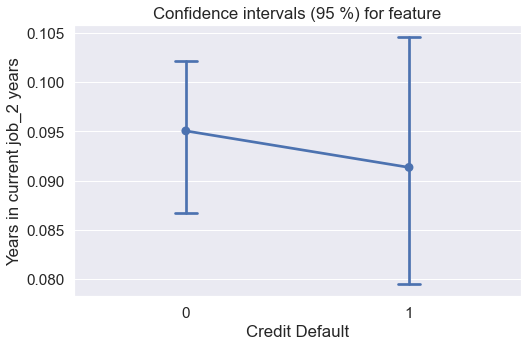

Оценка признака feature = Years in current job_3 years


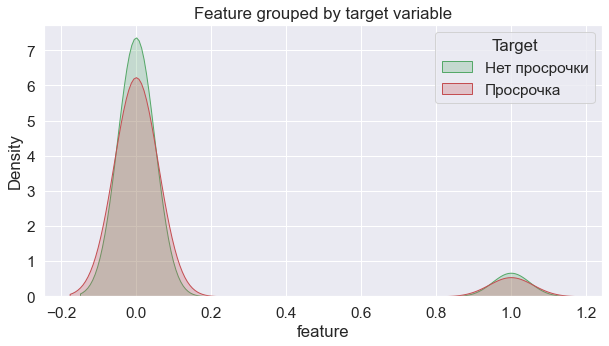

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.30620747804641724, pvalue=0.0)


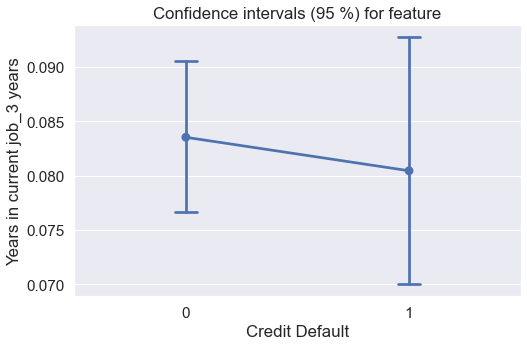

Оценка признака feature = Years in current job_4 years


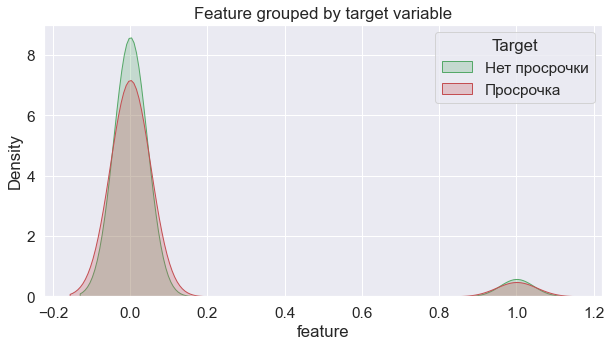

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.2581908702850342, pvalue=0.0)


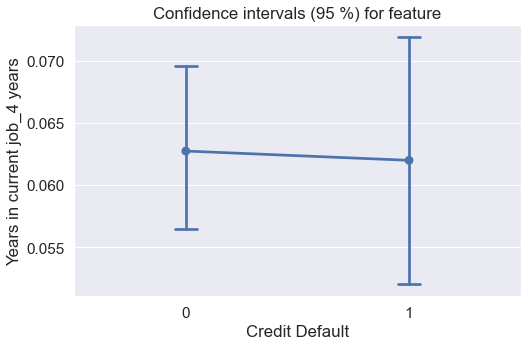

Оценка признака feature = Years in current job_5 years


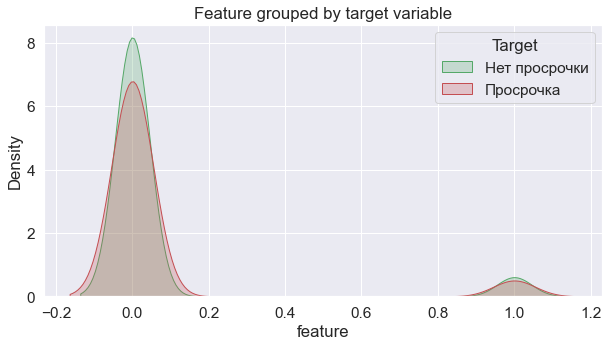

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.273967981338501, pvalue=0.0)


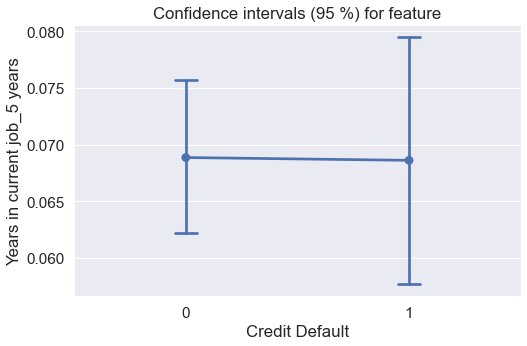

Оценка признака feature = Years in current job_6 years


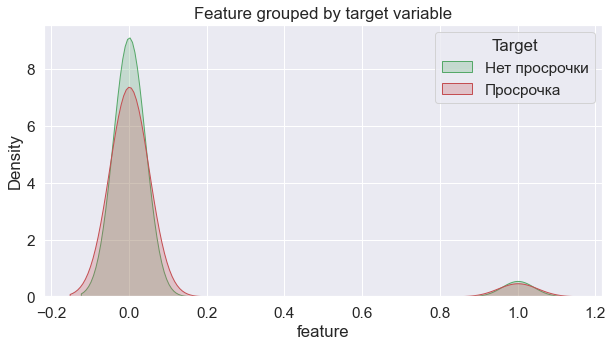

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.24299532175064087, pvalue=0.0)


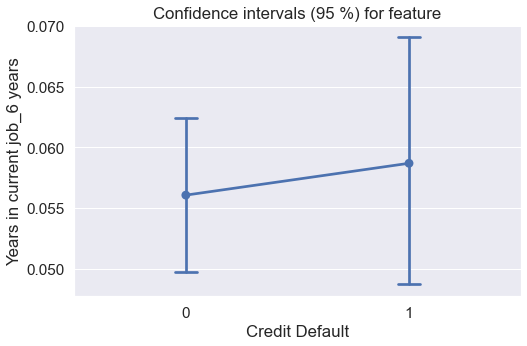

Оценка признака feature = Years in current job_7 years


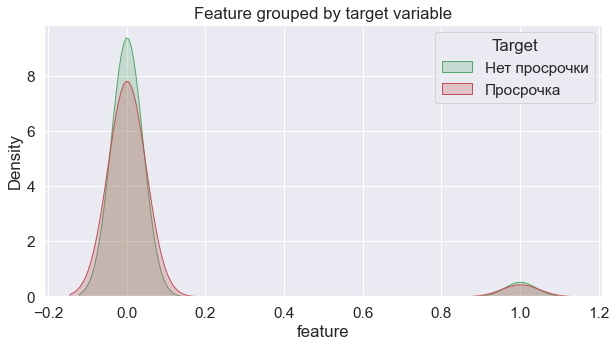

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.23191475868225098, pvalue=0.0)


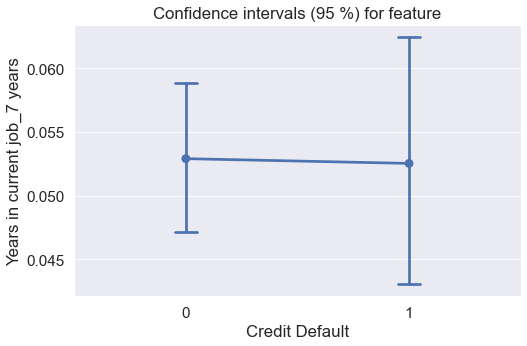

Оценка признака feature = Years in current job_8 years


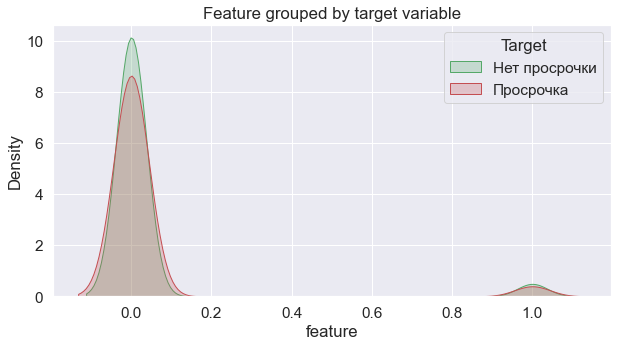

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.20964324474334717, pvalue=0.0)


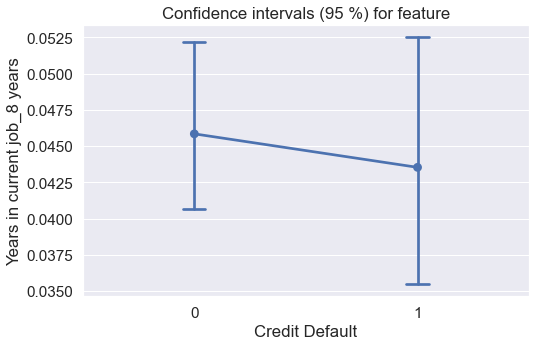

Оценка признака feature = Years in current job_9 years


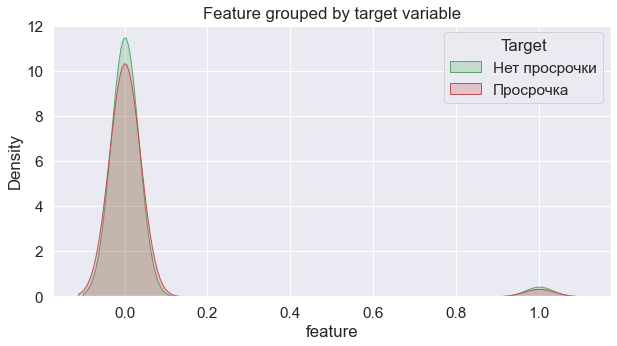

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.1751447319984436, pvalue=0.0)


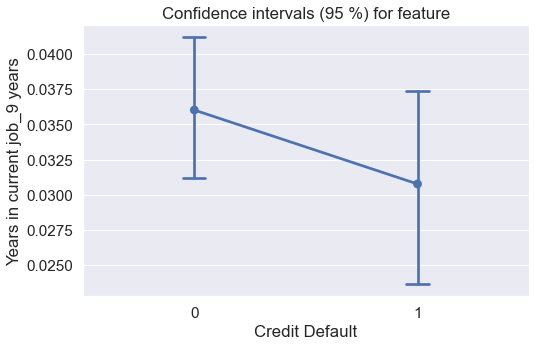

Оценка признака feature = Years in current job_< 1 year


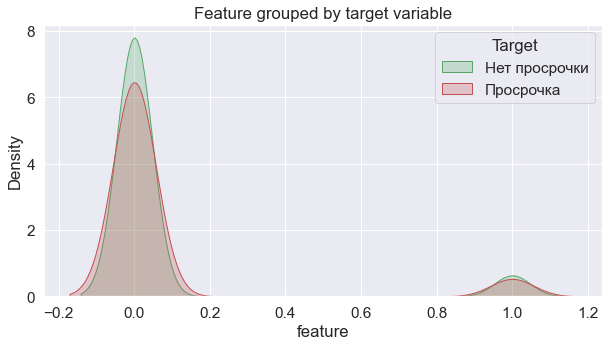

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.28896385431289673, pvalue=0.0)


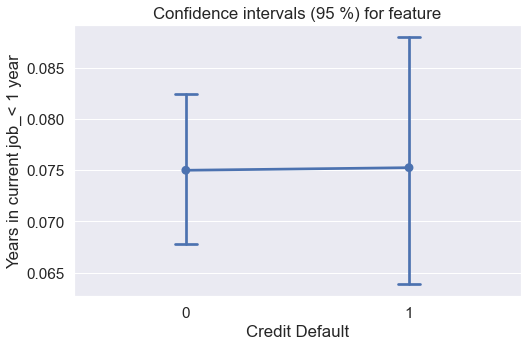

Оценка признака feature = Tax Liens_0.0


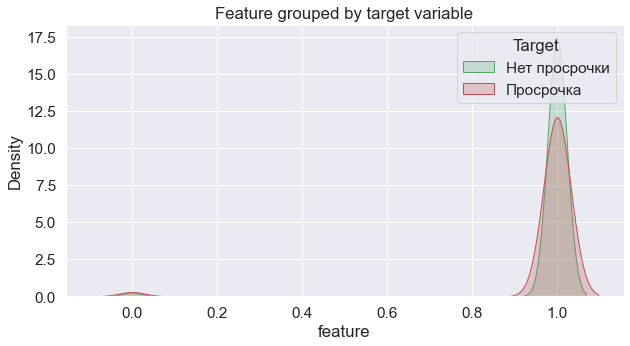

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.11023956537246704, pvalue=0.0)


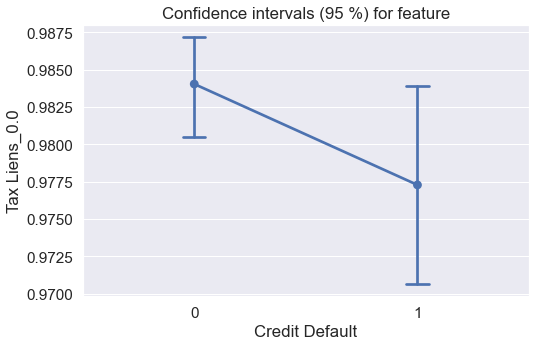

Оценка признака feature = Tax Liens_1.0


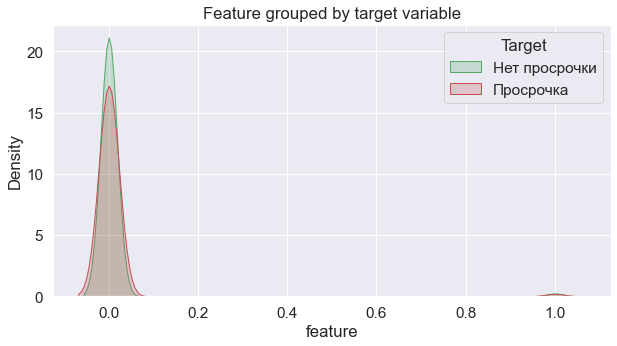

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.07742786407470703, pvalue=0.0)


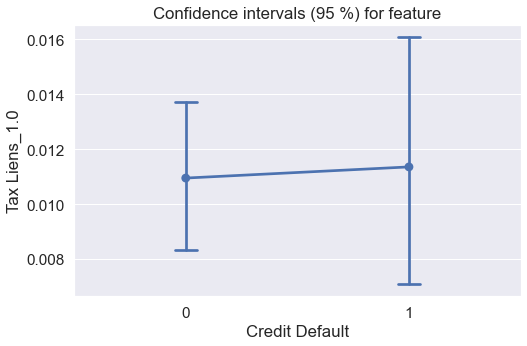

Оценка признака feature = Tax Liens_2.0


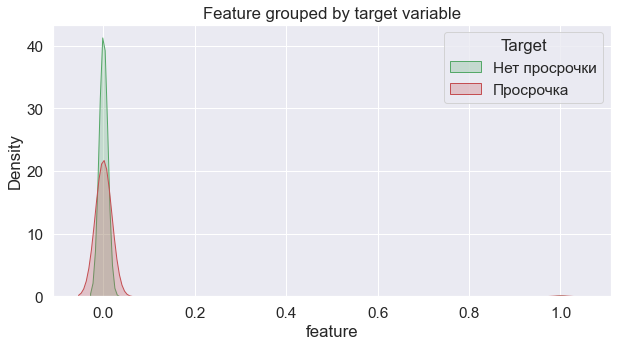

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.03523904085159302, pvalue=0.0)


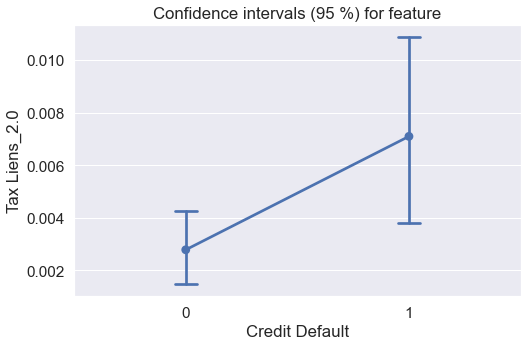

Оценка признака feature = Tax Liens_3.0


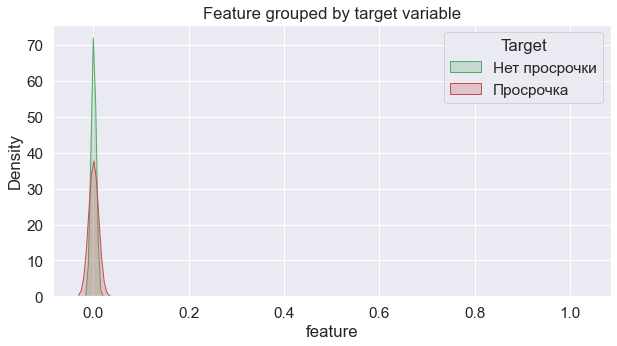

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.01446753740310669, pvalue=0.0)


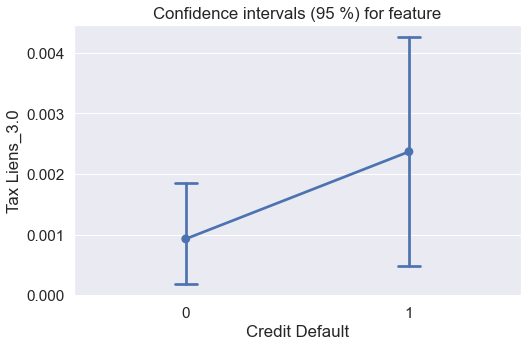

Оценка признака feature = Tax Liens_4.0


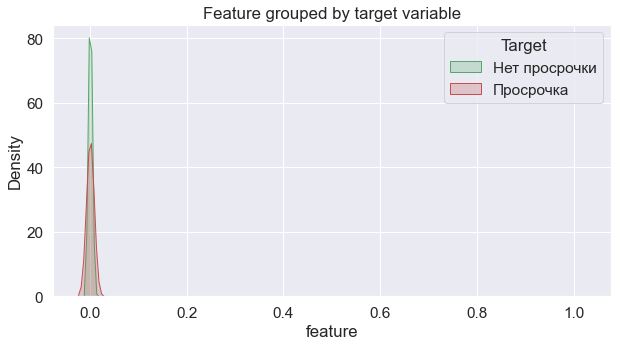

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.009475648403167725, pvalue=0.0)


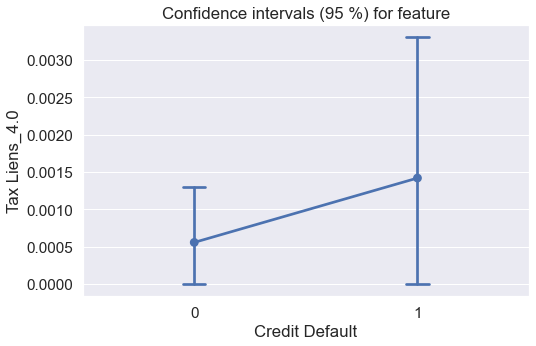

Оценка признака feature = Tax Liens_5.0


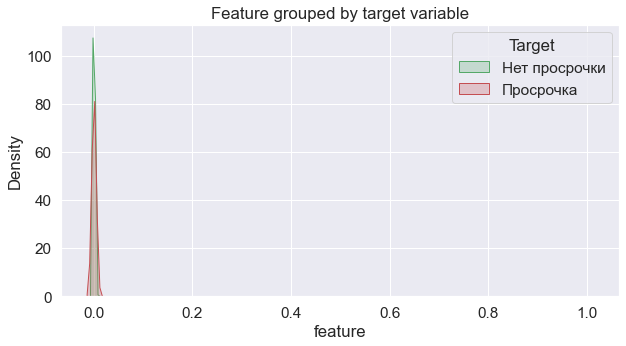

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.003795921802520752, pvalue=0.0)


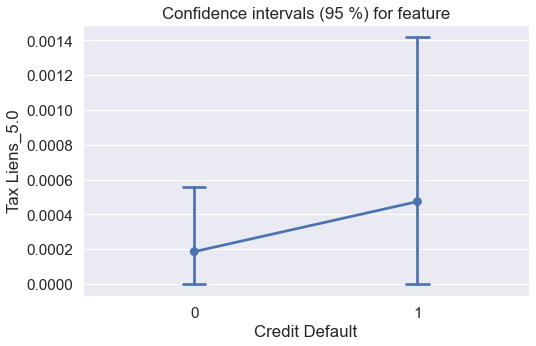

Оценка признака feature = Tax Liens_6.0


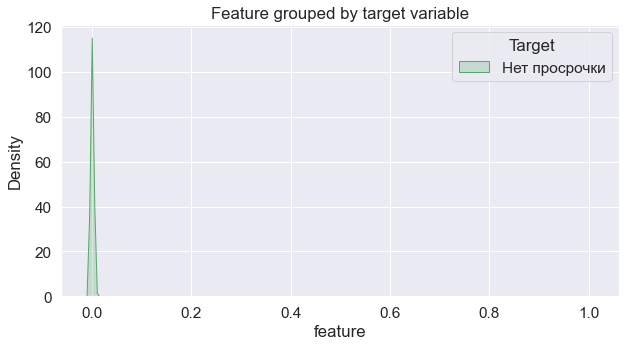

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.003795921802520752, pvalue=0.0)


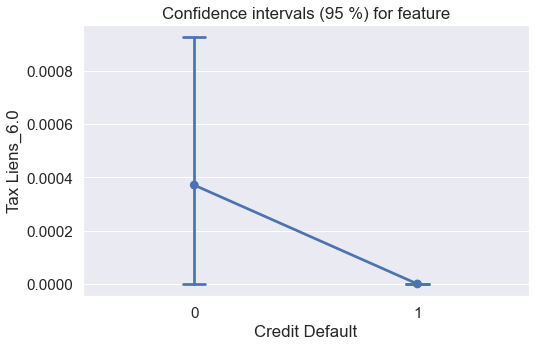

Оценка признака feature = Tax Liens_7.0


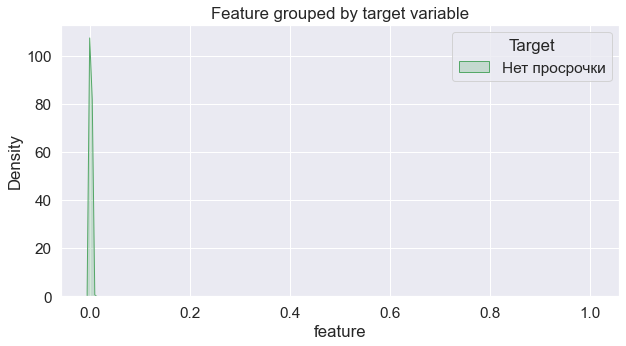

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.002118051052093506, pvalue=0.0)


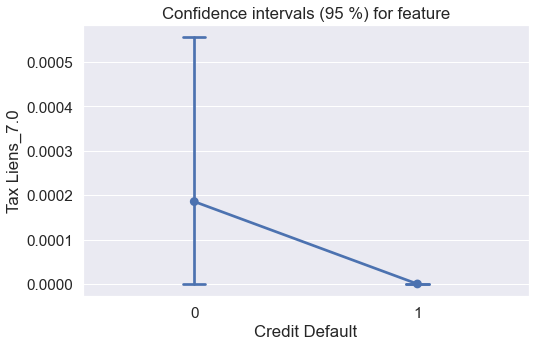

Оценка признака feature = Number of Credit Problems_0.0


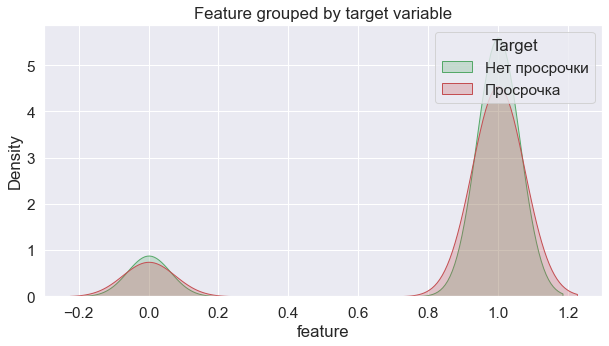

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.407463014125824, pvalue=0.0)


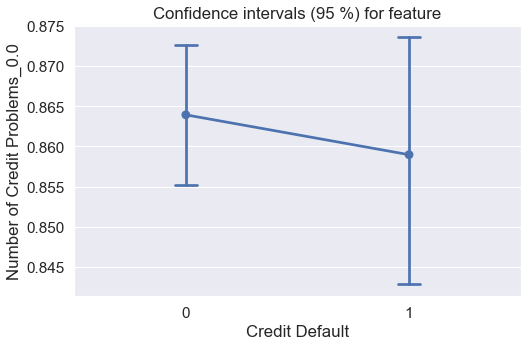

Оценка признака feature = Number of Credit Problems_1.0


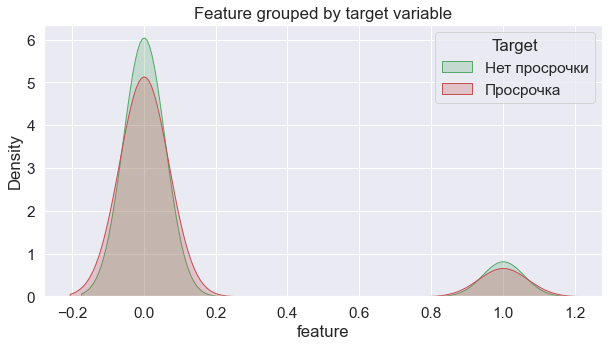

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.37475067377090454, pvalue=0.0)


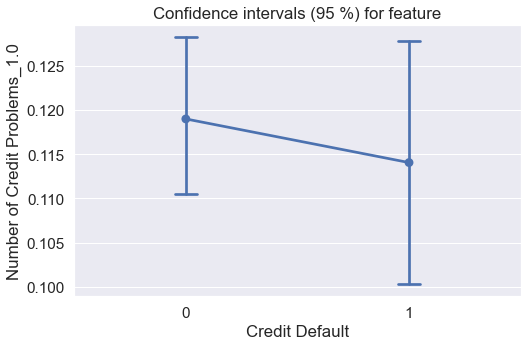

Оценка признака feature = Number of Credit Problems_2.0


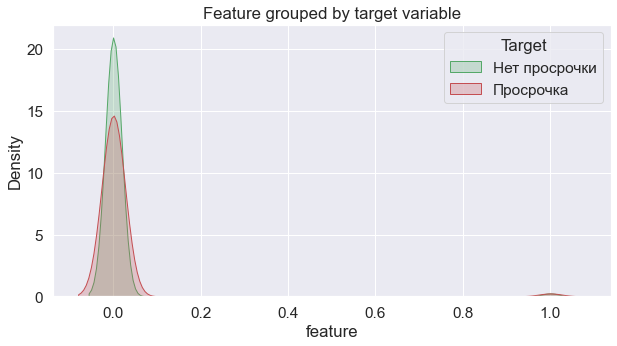

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.08430176973342896, pvalue=0.0)


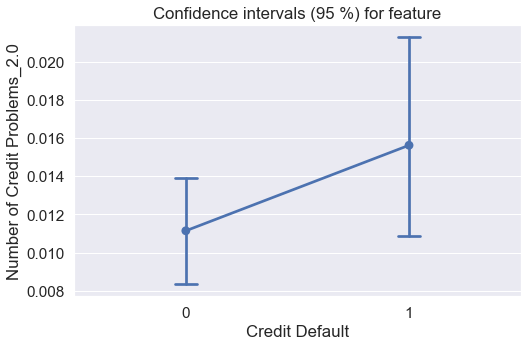

Оценка признака feature = Number of Credit Problems_3.0


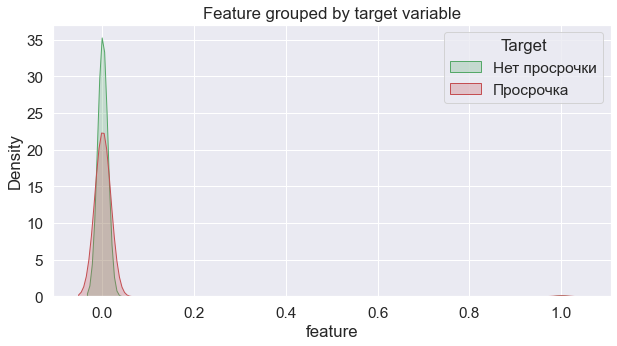

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.039809346199035645, pvalue=0.0)


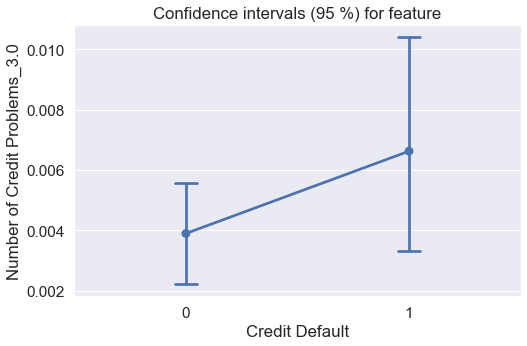

Оценка признака feature = Number of Credit Problems_4.0


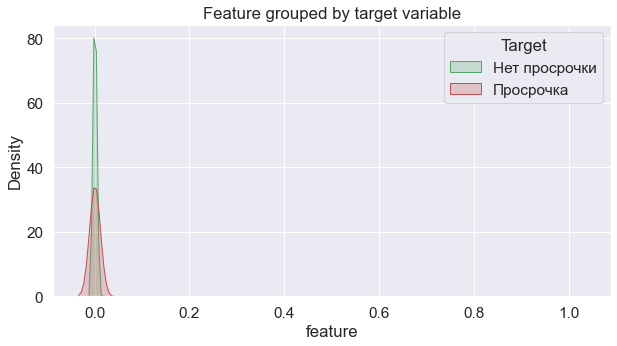

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.01326286792755127, pvalue=0.0)


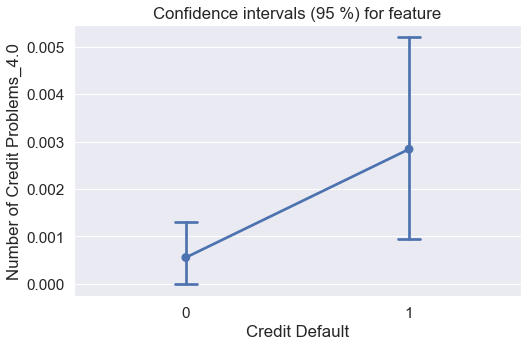

Оценка признака feature = Number of Credit Problems_5.0


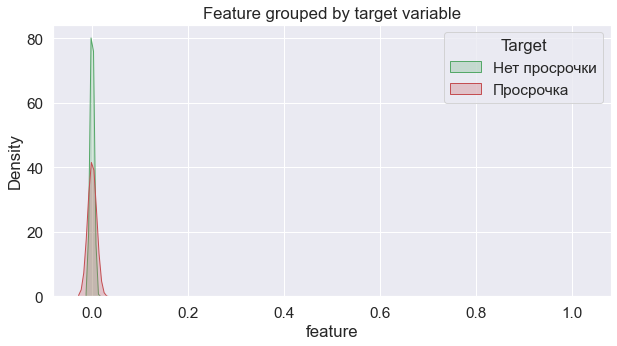

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.010770738124847412, pvalue=0.0)


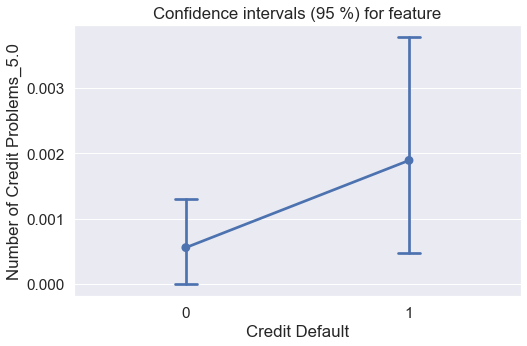

Оценка признака feature = Number of Credit Problems_6.0


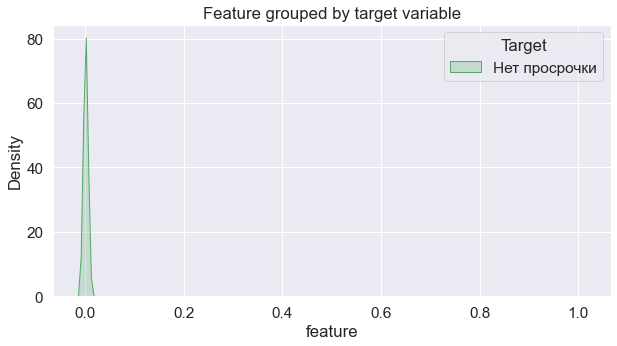

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.00675809383392334, pvalue=0.0)


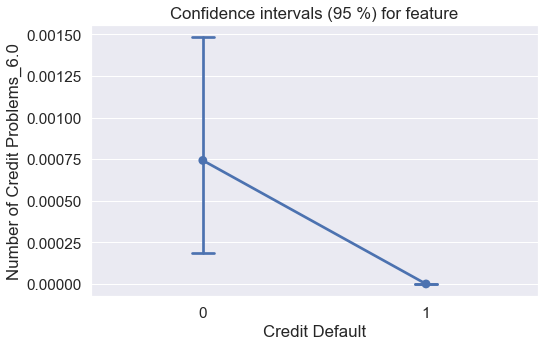

Оценка признака feature = Number of Credit Problems_7.0


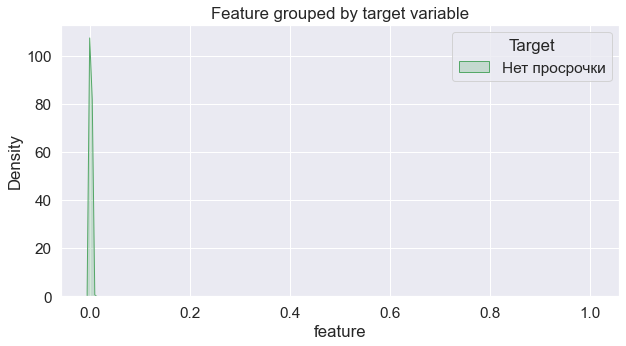

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.002118051052093506, pvalue=0.0)


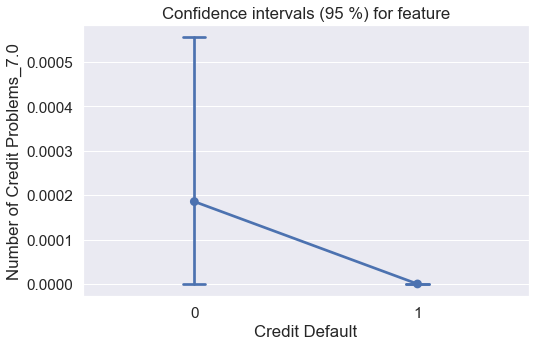

Оценка признака feature = Bankruptcies_0.0


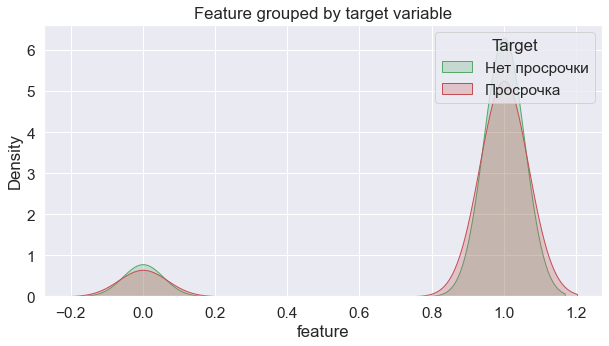

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.3613213300704956, pvalue=0.0)


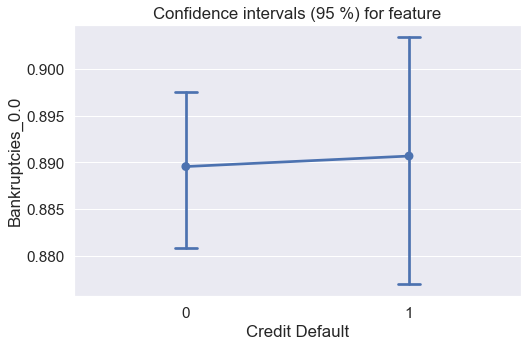

Оценка признака feature = Bankruptcies_1.0


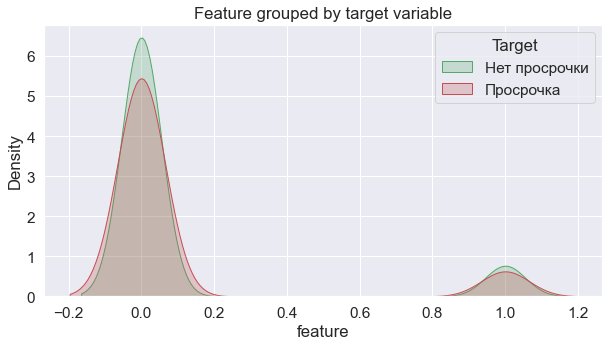

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.35143452882766724, pvalue=0.0)


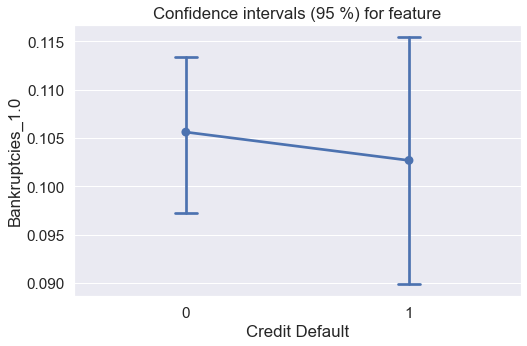

Оценка признака feature = Bankruptcies_2.0


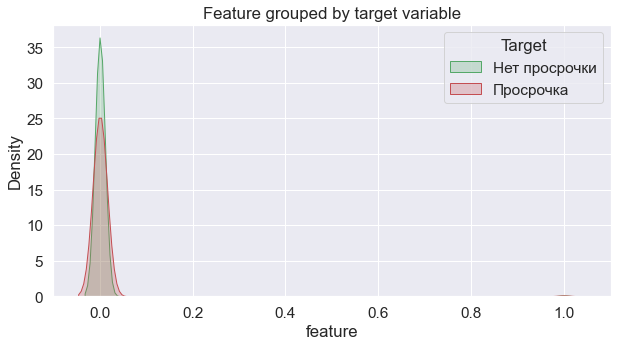

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.036167800426483154, pvalue=0.0)


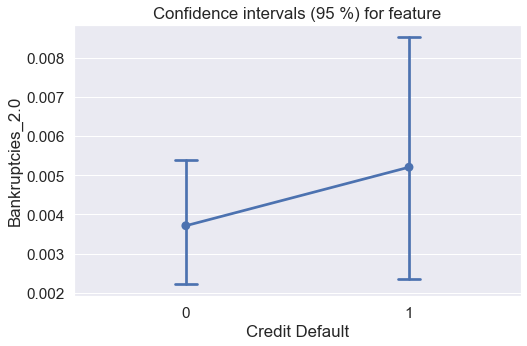

Оценка признака feature = Bankruptcies_3.0


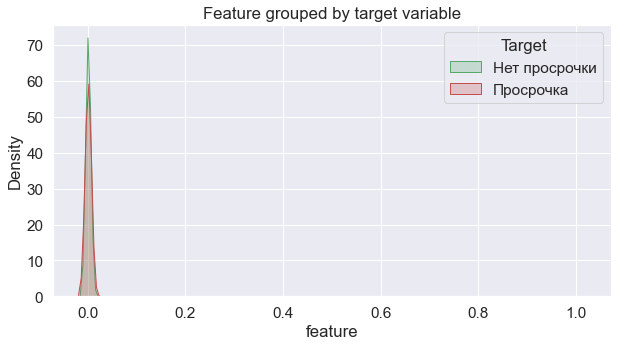

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.010770738124847412, pvalue=0.0)


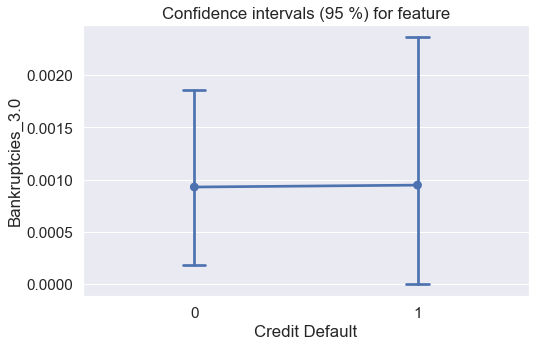

Оценка признака feature = Bankruptcies_4.0


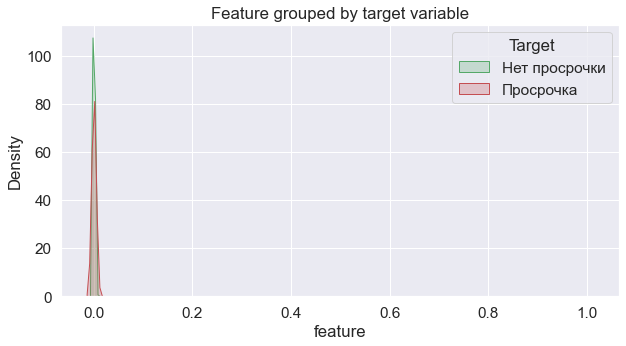

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.003795921802520752, pvalue=0.0)


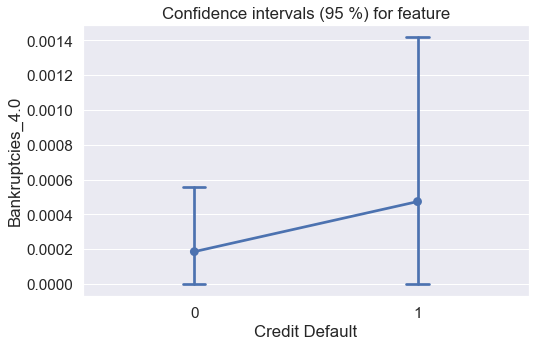

Оценка признака feature = Purpose_business loan


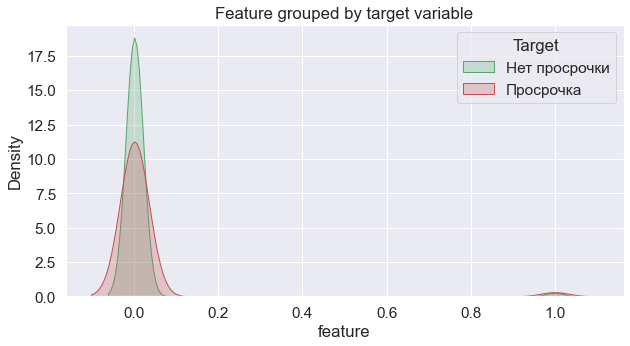

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.10724771022796631, pvalue=0.0)


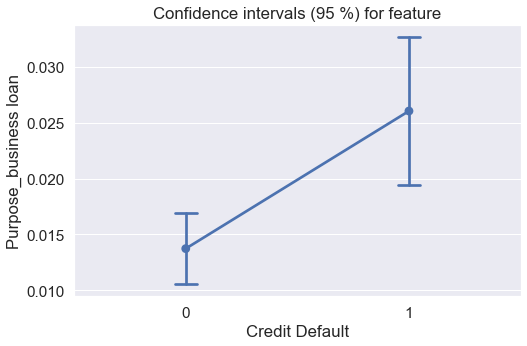

Оценка признака feature = Purpose_buy a car


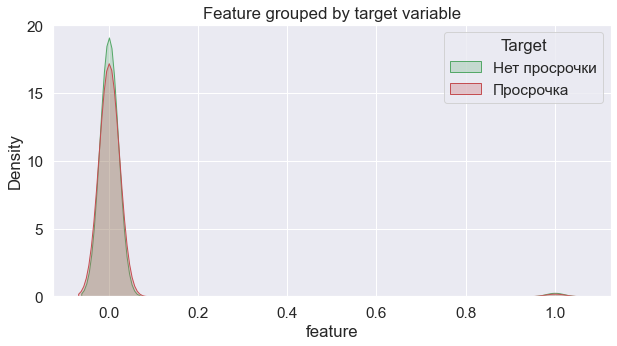

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.08631652593612671, pvalue=0.0)


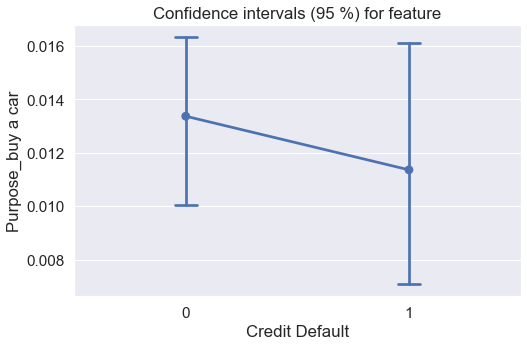

Оценка признака feature = Purpose_buy house


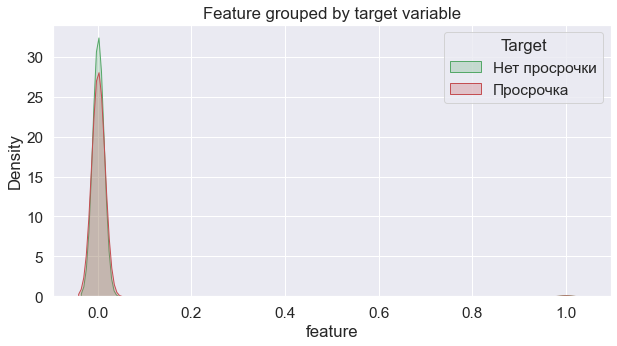

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.03890949487686157, pvalue=0.0)


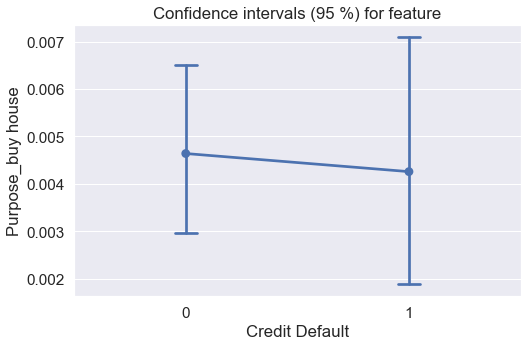

Оценка признака feature = Purpose_debt consolidation


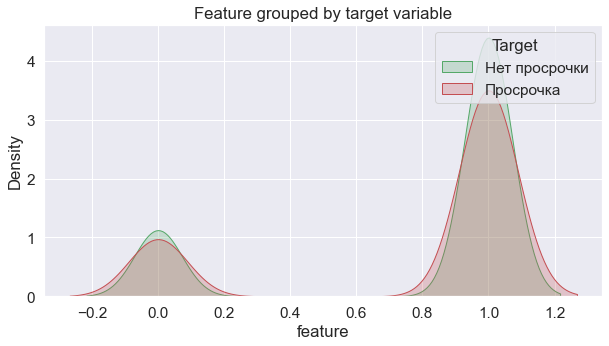

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.4978790879249573, pvalue=0.0)


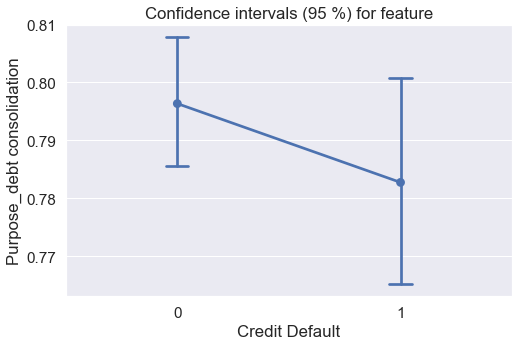

Оценка признака feature = Purpose_educational expenses


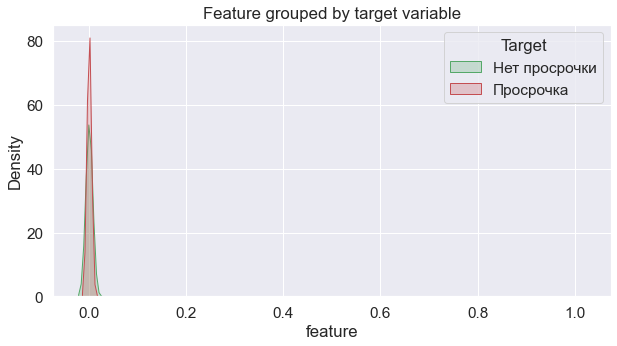

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.01446753740310669, pvalue=0.0)


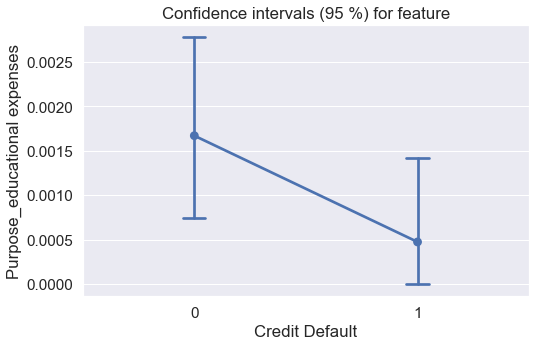

Оценка признака feature = Purpose_home improvements


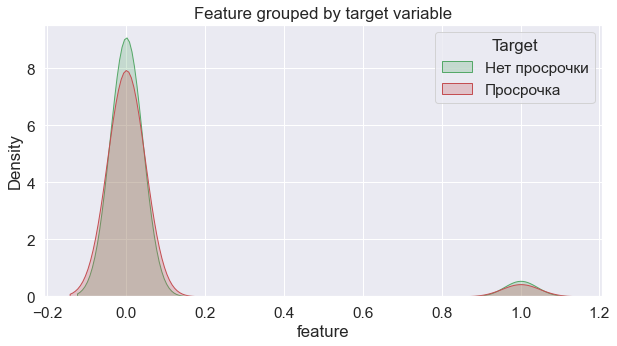

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.23787438869476318, pvalue=0.0)


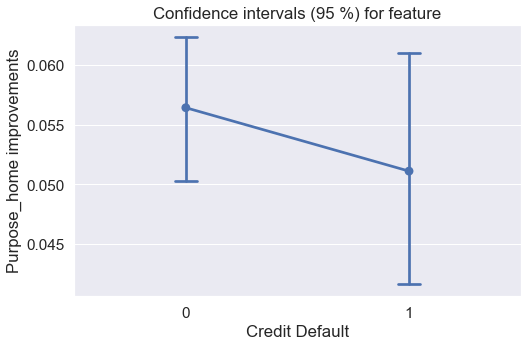

Оценка признака feature = Purpose_major purchase


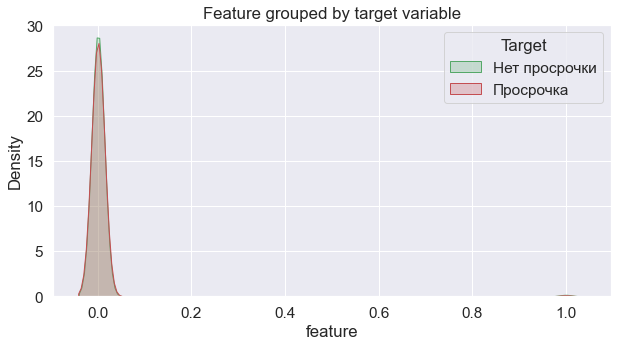

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.044213294982910156, pvalue=0.0)


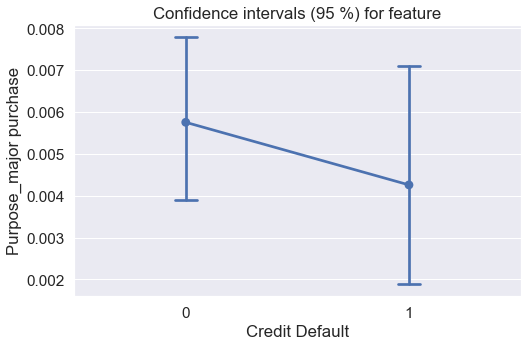

Оценка признака feature = Purpose_medical bills


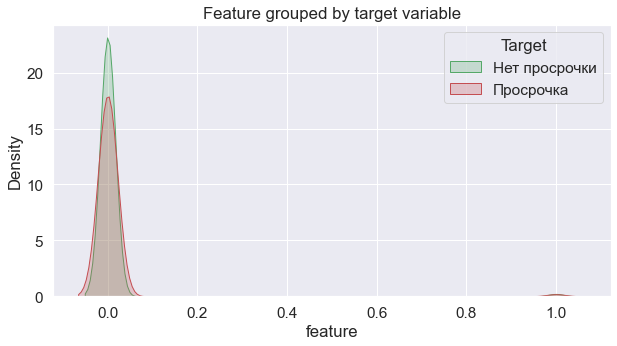

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.06882214546203613, pvalue=0.0)


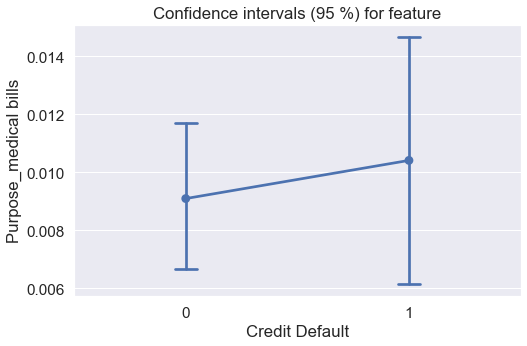

Оценка признака feature = Purpose_moving


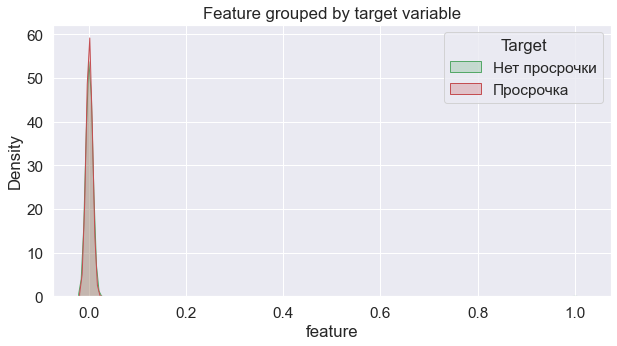

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.015648186206817627, pvalue=0.0)


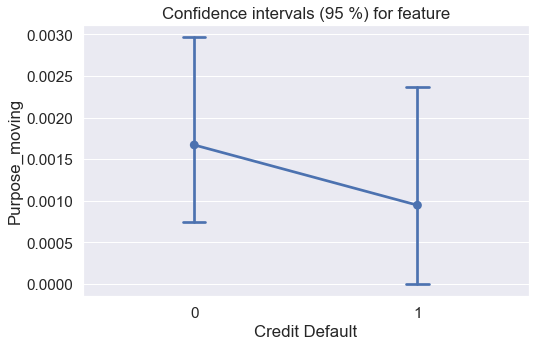

Оценка признака feature = Purpose_other


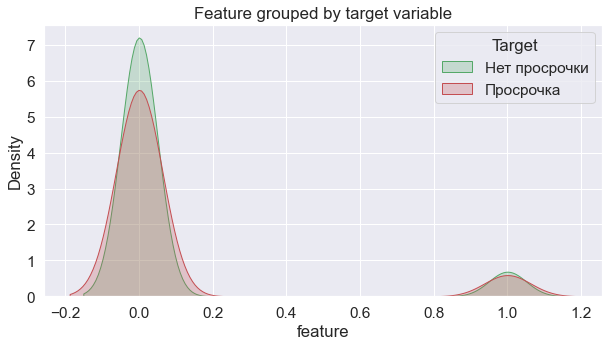

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.31915485858917236, pvalue=0.0)


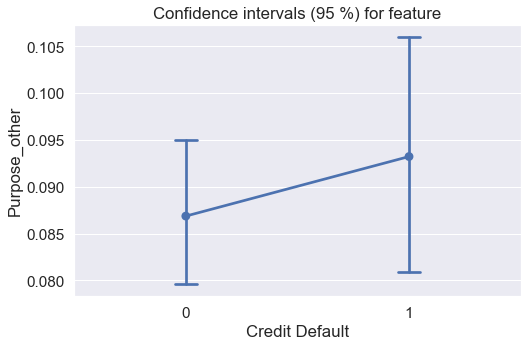

Оценка признака feature = Purpose_renewable energy


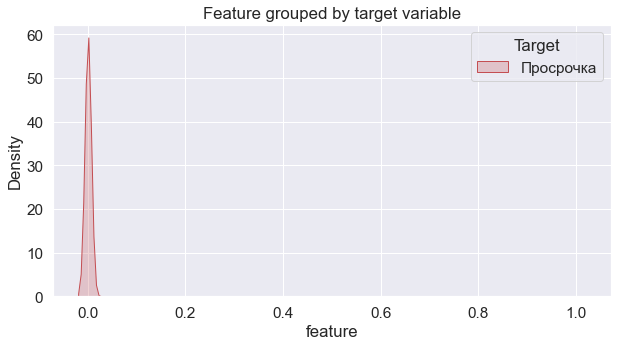

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.003795921802520752, pvalue=0.0)


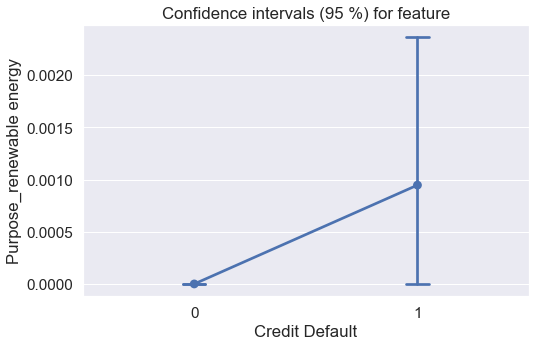

Оценка признака feature = Purpose_small business


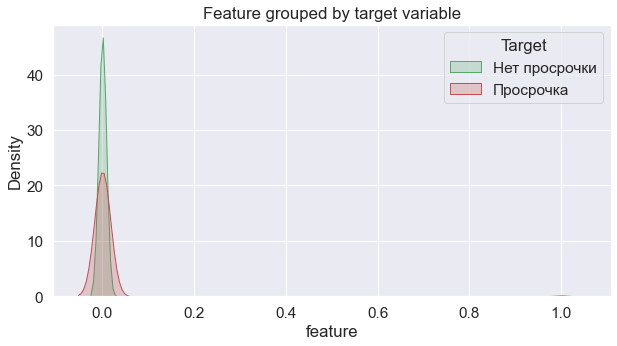

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.03144395351409912, pvalue=0.0)


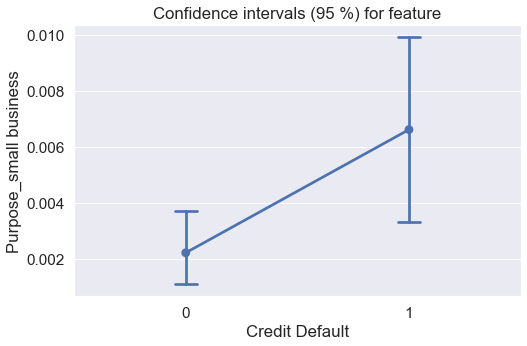

Оценка признака feature = Purpose_take a trip


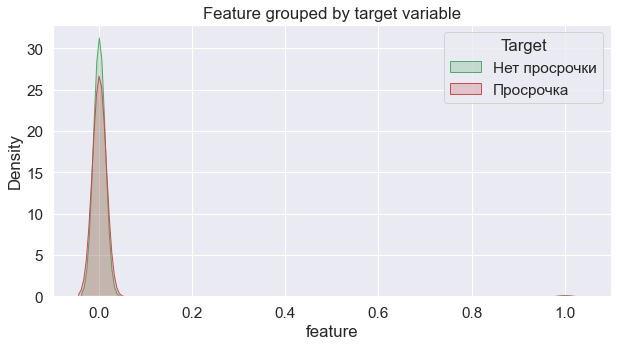

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.041589438915252686, pvalue=0.0)


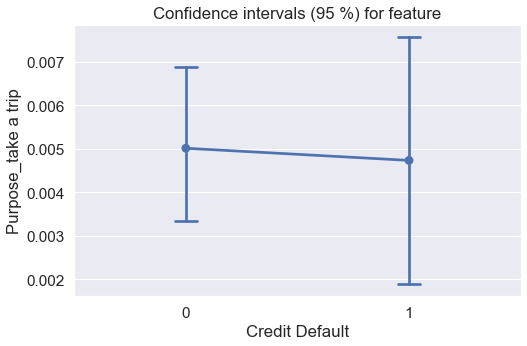

Оценка признака feature = Purpose_vacation


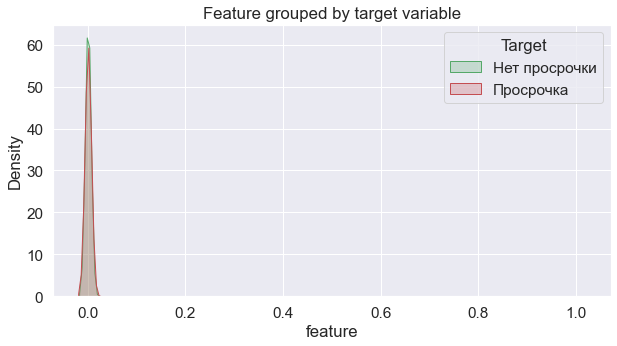

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.012031793594360352, pvalue=0.0)


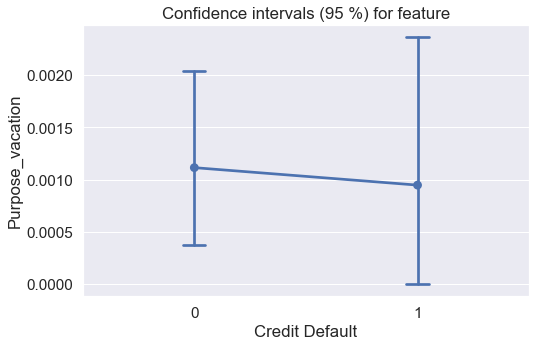

Оценка признака feature = Purpose_wedding


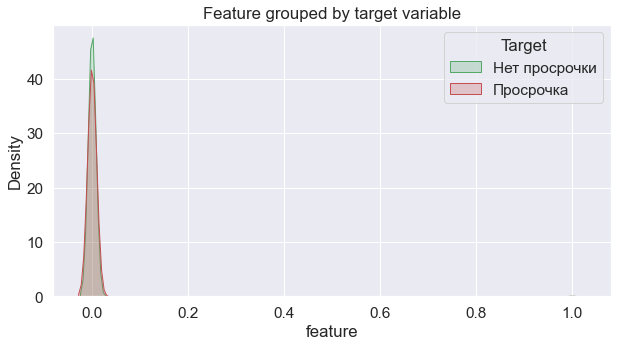

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.02017122507095337, pvalue=0.0)


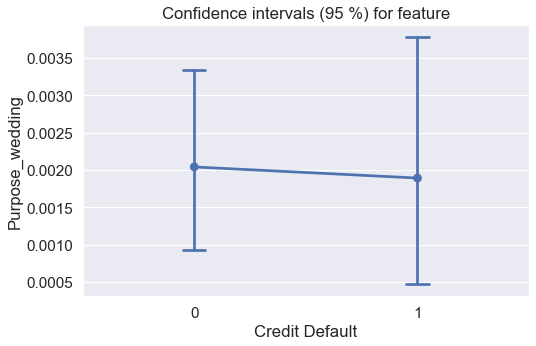

No handles with labels found to put in legend.


Оценка признака feature = Tax Liens_15.0


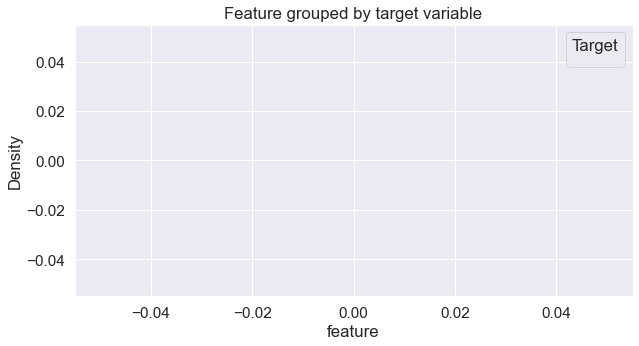

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=1.0, pvalue=1.0)


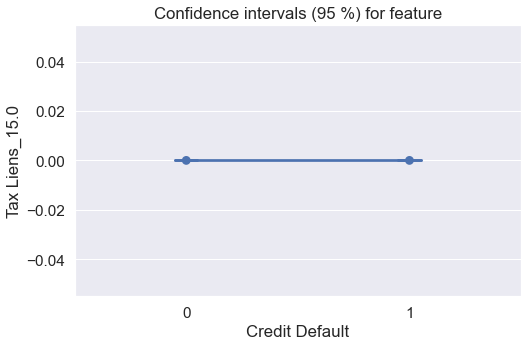

No handles with labels found to put in legend.


Оценка признака feature = Number of Credit Problems_15.0


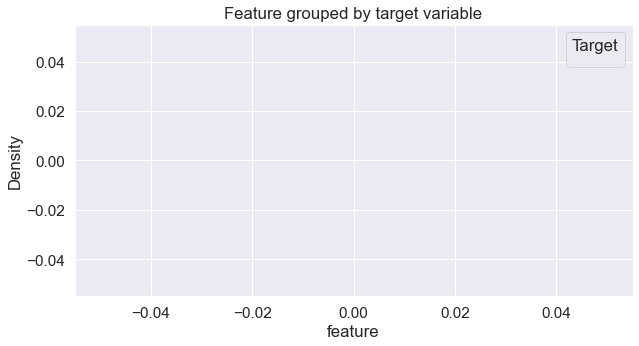

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=1.0, pvalue=1.0)


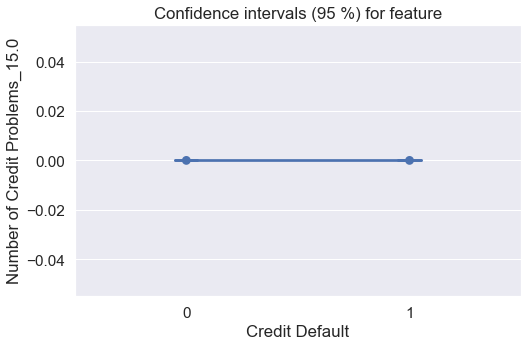

No handles with labels found to put in legend.


Оценка признака feature = Bankruptcies_5.0


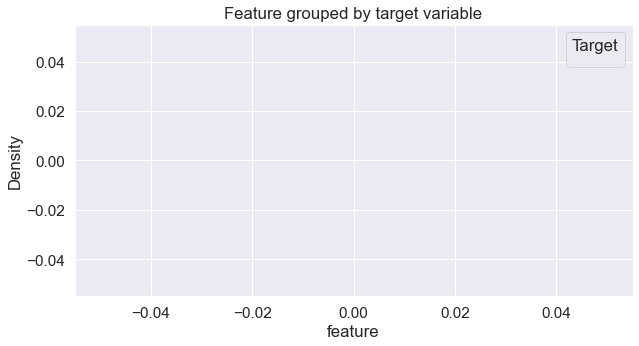

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=1.0, pvalue=1.0)


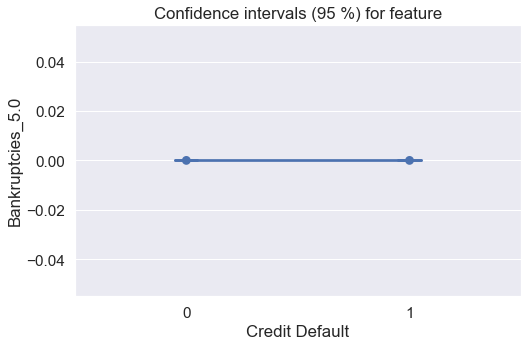

Оценка признака feature = Is Hidden Income


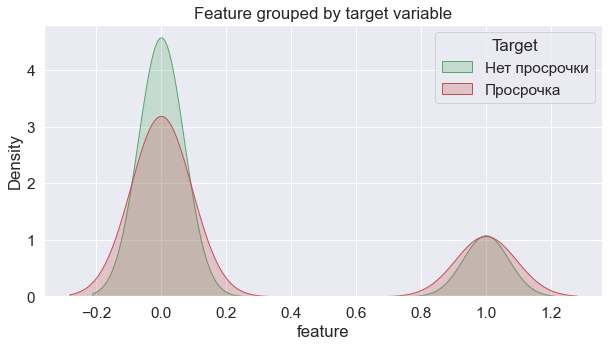

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.49812495708465576, pvalue=0.0)


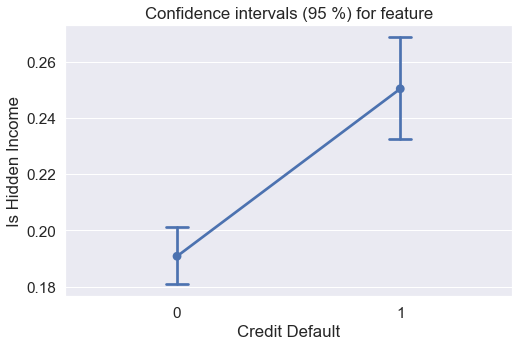

Оценка признака feature = Is Hidden Years in current job


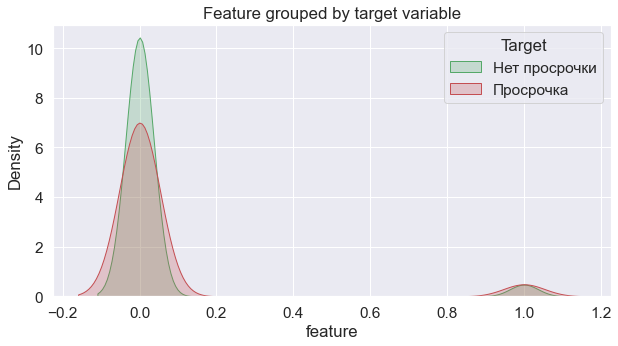

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.2223537564277649, pvalue=0.0)


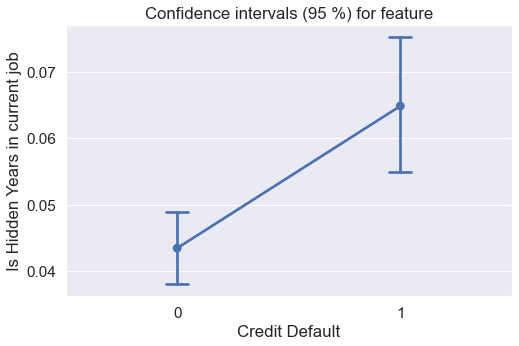

Оценка признака feature = Salary and Mount Debt Difference


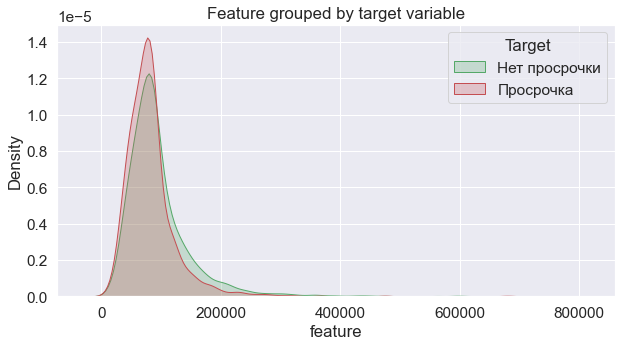

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.7150565385818481, pvalue=0.0)


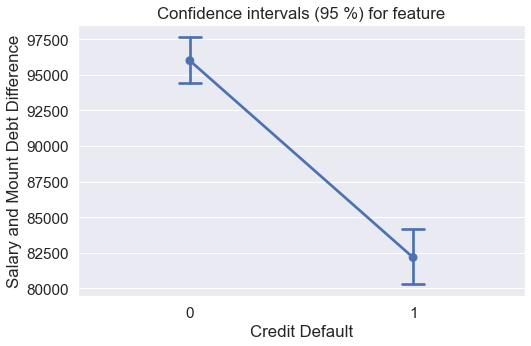

Оценка признака feature = Current Loan Amount and Current Credit Balance Difference


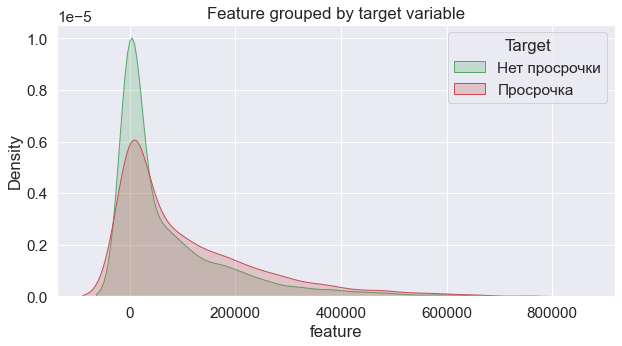

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.7248860001564026, pvalue=0.0)


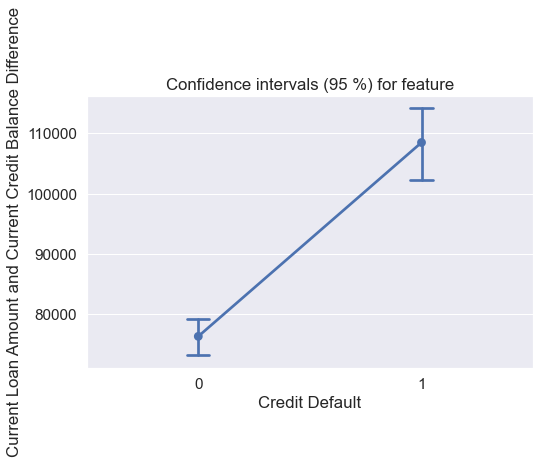

Оценка признака feature = Bankruptcies equal Number of Credit Problems


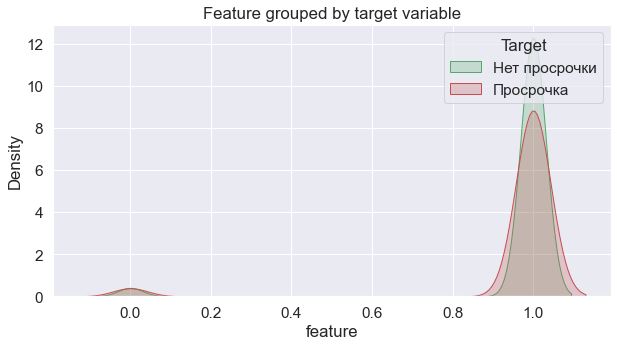

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.17465049028396606, pvalue=0.0)


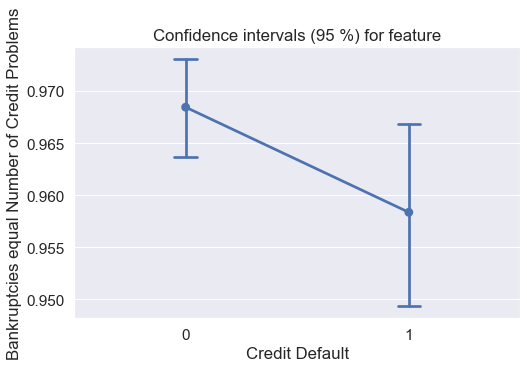

Оценка признака feature = Share of Problem Loans


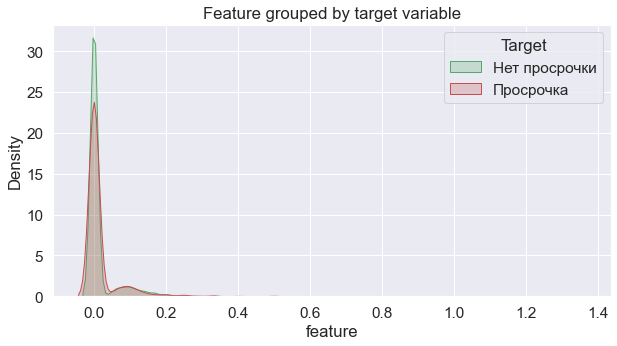

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.3418285846710205, pvalue=0.0)


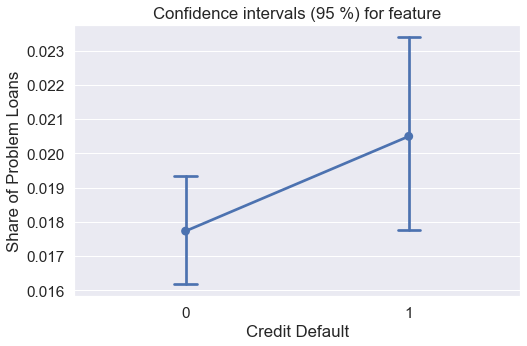

Оценка признака feature = Years of Credit History encode Number of Open Accounts


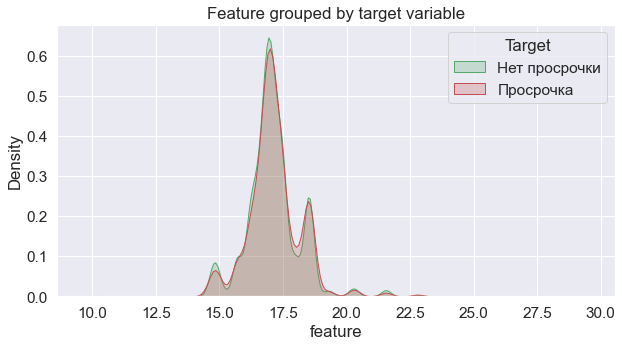

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.9062011241912842, pvalue=0.0)


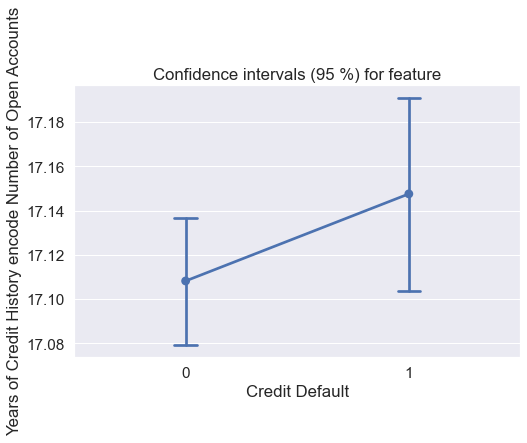

Оценка признака feature = Small Annual Income


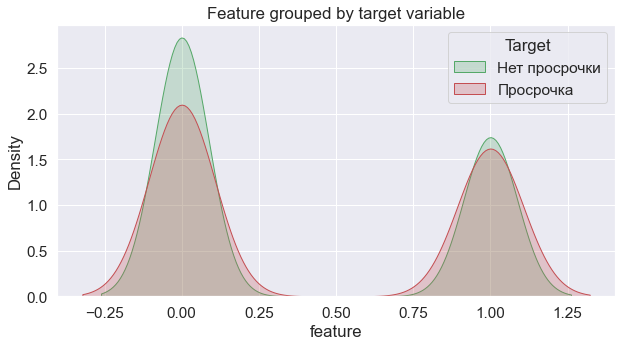

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6207633018493652, pvalue=0.0)


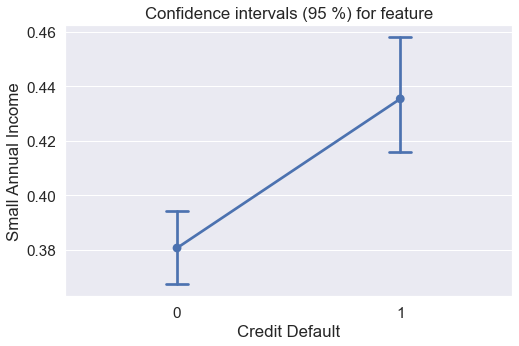

Оценка признака feature = Months since last delinquent encode Number of Credit Problems


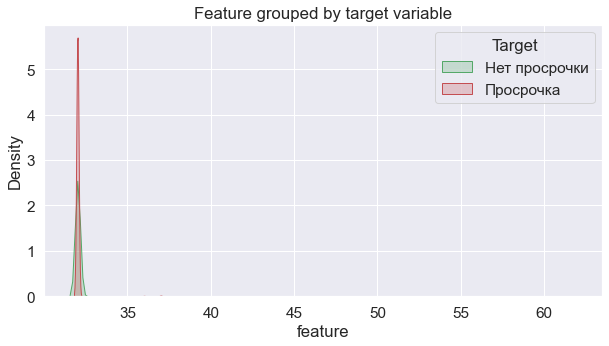

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.015488028526306152, pvalue=0.0)


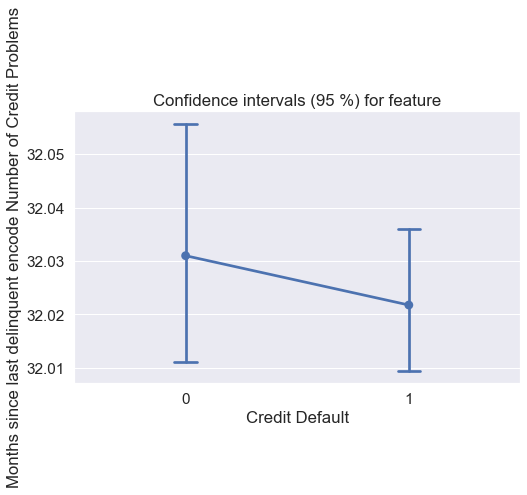

Оценка признака feature = Target_encode_Home Ownership


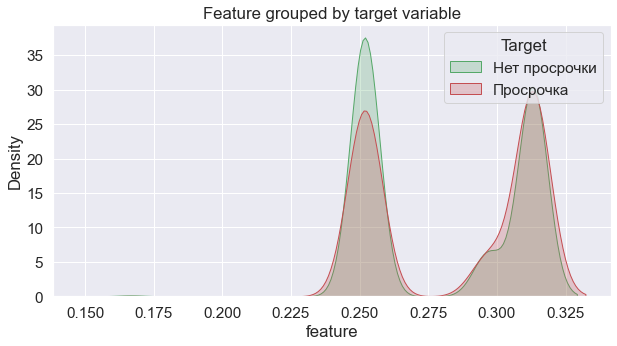

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.6855303049087524, pvalue=0.0)


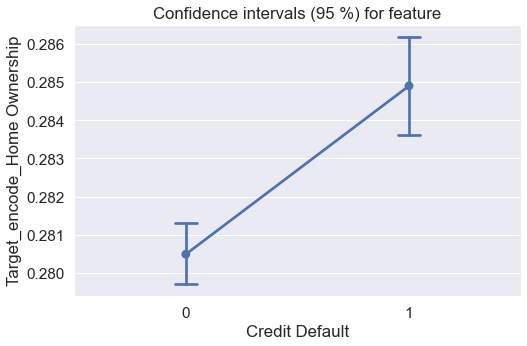

Оценка признака feature = Target_encode_Years in current job


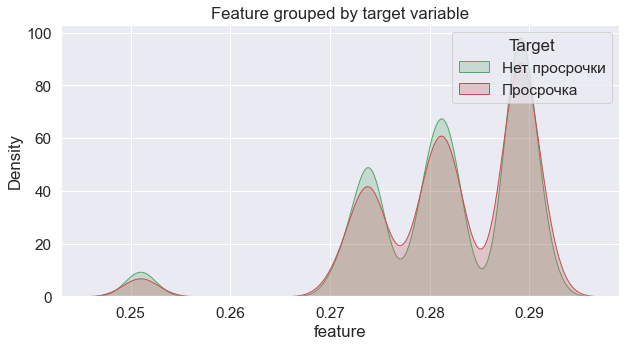

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.8061202168464661, pvalue=0.0)


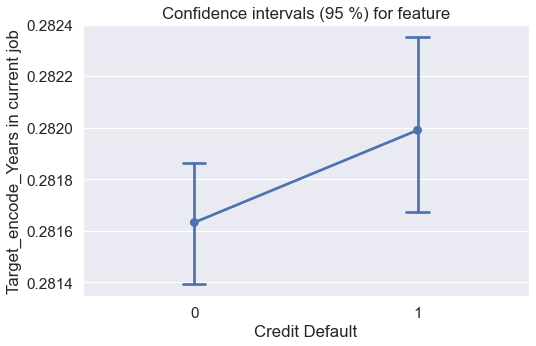

Оценка признака feature = Target_encode_Term


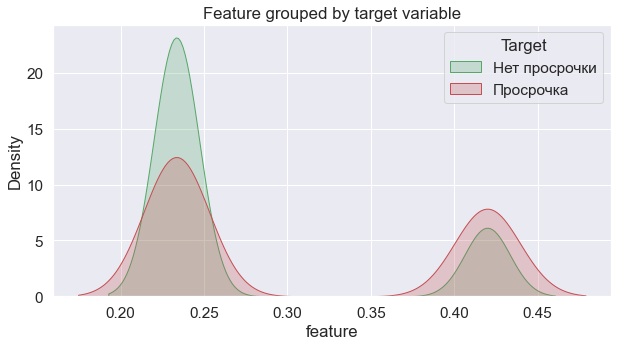

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.5461937785148621, pvalue=0.0)


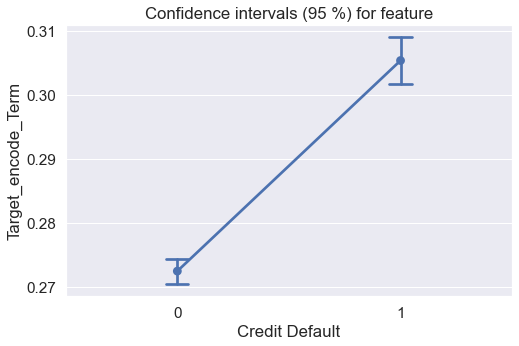

Оценка признака feature = Purpose_encode_Term


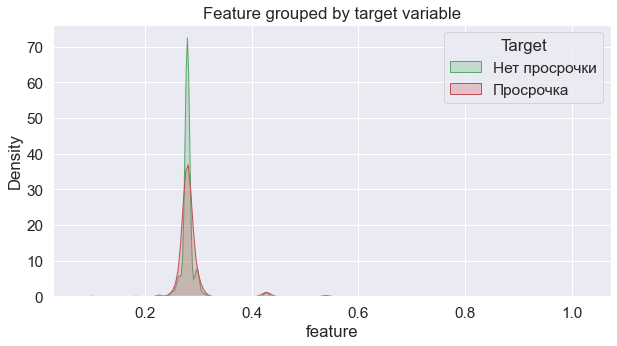

Критерий Шапиро-Уилка для признака: ShapiroResult(statistic=0.31165802478790283, pvalue=0.0)


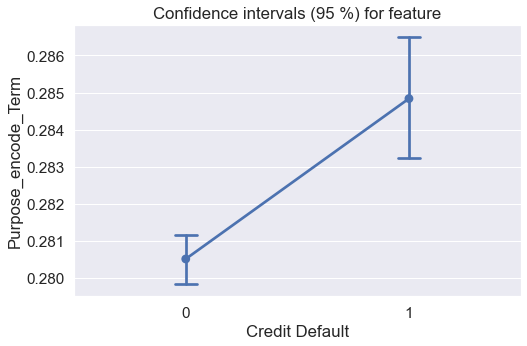

In [699]:
for feature in num_features:
    print(f'Оценка признака feature = {feature}')
    feature_with_target = pd.concat([X[feature], df_train[target]], axis=1)
    feature = feature_with_target[feature]
    feature_target_0 = feature[feature_with_target[target] == 0]
    feature_target_1 = feature[feature_with_target[target] == 1]
    
    plt.figure(figsize=(10, 5))
    
    sns.kdeplot(feature_target_0, shade=True, label='Нет просрочки', color='g')
    sns.kdeplot(feature_target_1, shade=True, label='Просрочка', color='r')
    
    plt.xlabel('feature')
    plt.title('Feature grouped by target variable')
    plt.legend(title='Target', loc='upper right')
 
    plt.show()
    
    # Проверяем распределения на нормальность
    print(f'Критерий Шапиро-Уилка для признака: {shapiro(feature)}')
    
    #Строим доверительные интервалы
    plt.figure(figsize=(8, 5))

    sns.pointplot(x=target, y=feature, data=feature_with_target, capsize=.1)

    plt.title('Confidence intervals (95 %) for feature')
    plt.show()

***Вывод:*** \
***Признаки, полезные для определения значений целевой переменной*** (Средние значения в выборках не равны): \
Annual Income, Maximum Open Credit, Credit Score, \
Is_Long_Term, Home Ownership_Home Mortgage, \
Home Ownership_Rent, Number of Credit Problems_6.0,\
Purpose_business loan, Purpose_small business,\
Is Hidden Income, Is Hidden Years in current job \
Salary and Mount Debt Difference, Current Loan Amount and Current Credit Balance Difference, \
Small Annual Income, Target_encode_Home Ownership, 
Target_encode_Term, Purpose_encode_Term \


***Не брать в обучение:*** \
Months since last delinquent,\
Home Ownership_Own Home\
Years in current job_1 year, Years in current job_10+ years \
Years in current job_2 years, Years in current job_3 years, \
Years in current job_4 years, Years in current job_5 years, \
Years in current job_6 years, Years in current job_7 years, \
Years in current job_8 years, Years in current job_9 years, \
Years in current job_< 1 year, \
Tax Liens_0.0, Tax Liens_1.0, \
Tax Liens_3.0, Tax Liens_4.0, \
Tax Liens_5.0, Tax Liens_6.0, \
Tax Liens_7.0, Tax Liens_15.0,\
Number of Credit Problems_0.0, Number of Credit Problems_1.0, \
Number of Credit Problems_7.0, Number of Credit Problems_15.0,  \
Bankruptcies_0.0, Bankruptcies_1.0, Bankruptcies_2.0, \
Bankruptcies_3.0, Bankruptcies_4.0, Bankruptcies_5.0, \
Purpose_buy a car, Purpose_buy house, Purpose_home improvements, \
Purpose_major purchase, Purpose_medical bills, Purpose_moving, \
Purpose_other, Purpose_renewable energy,\
Purpose_take a trip, Purpose_vacation, Purpose_wedding, \
Years of Credit History encode Number of Open Accounts,\
Months since last delinquent encode Number of Credit Problems

In [700]:
# Собираем признаки, которые не надо использовать
do_not_use = [
    # убираем категориальные признаки
    # убираем признаки, не полезные для обучения (средние значения совпадают)
 'Months since last delinquent', 
    
 'Home Ownership',
                   'Home Ownership_Own Home',

#не брать целиком Years in current job!
 'Years in current job', 
                         'Years in current job_< 1 year',
                         'Years in current job_1 year',
                         'Years in current job_2 years',
                         'Years in current job_3 years',
                         'Years in current job_4 years',
                         'Years in current job_5 years',
                         'Years in current job_6 years',
                        'Years in current job_7 years',
                         'Years in current job_8 years',
                        'Years in current job_9 years',
                         'Years in current job_10+ years',
                            
# не брать целиком Tax Liens
'Tax Liens', 
               'Tax Liens_0.0', 'Tax Liens_1.0', 'Tax Liens_3.0',
               'Tax Liens_4.0', 'Tax Liens_5.0', 'Tax Liens_6.0', 
              'Tax Liens_7.0', 'Tax Liens_15.0',
        
# не брать целиком Number of Credit Problems
'Number of Credit Problems', 
                              'Number of Credit Problems_0.0',
                              'Number of Credit Problems_1.0', 
                              'Number of Credit Problems_7.0',
                              'Number of Credit Problems_15.0',
            
# не брать целиком Bankruptcies
'Bankruptcies', 
                 'Bankruptcies_0.0', 'Bankruptcies_1.0', 
                 'Bankruptcies_2.0', 'Bankruptcies_3.0', 
                 'Bankruptcies_4.0', 'Bankruptcies_5.0',

# не брать целиком Purpose
'Purpose', 
           'Purpose_buy a car', 'Purpose_buy house', 
           'Purpose_home improvements', 'Purpose_major purchase',
           'Purpose_medical bills', 'Purpose_moving', 'Purpose_other', 
           'Purpose_renewable energy', 'Purpose_take a trip', 
           'Purpose_vacation', 'Purpose_wedding',
  
 'Term',

 # убираем признаки, где средние значения совпадают
    'Bankruptcies equal Number of Credit Problems',
    'Share of Problem Loans',
    'Years of Credit History encode Number of Open Accounts', 
    'Months since last delinquent encode Number of Credit Problems',
    'Target_encode_Years in current job'
]

In [701]:
selected_features=[x for x in X.columns.to_list() if x not in do_not_use]
print(f'Признаки датасета: {selected_features}')
print(f'Количество признаков: {len(selected_features)}')

Признаки датасета: ['Annual Income', 'Number of Open Accounts', 'Years of Credit History', 'Maximum Open Credit', 'Current Loan Amount', 'Current Credit Balance', 'Monthly Debt', 'Credit Score', 'Is_Long_Term', 'Home Ownership_Have Mortgage', 'Home Ownership_Home Mortgage', 'Home Ownership_Rent', 'Tax Liens_2.0', 'Number of Credit Problems_2.0', 'Number of Credit Problems_3.0', 'Number of Credit Problems_4.0', 'Number of Credit Problems_5.0', 'Number of Credit Problems_6.0', 'Purpose_business loan', 'Purpose_debt consolidation', 'Purpose_educational expenses', 'Purpose_small business', 'Is Hidden Income', 'Is Hidden Years in current job', 'Salary and Mount Debt Difference', 'Current Loan Amount and Current Credit Balance Difference', 'Small Annual Income', 'Target_encode_Home Ownership', 'Target_encode_Term', 'Purpose_encode_Term']
Количество признаков: 30


### $\S2.2$. Подбор моделей, получение бейзлана<a class="anchor" id="par2.2">

In [702]:
# Создаем датасет для проверки и обучения модели
X = pd.read_csv('train_prep.csv')
df = X[selected_features]
df.head()

,Annual Income,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Is_Long_Term,Home Ownership_Have Mortgage,...,Purpose_educational expenses,Purpose_small business,Is Hidden Income,Is Hidden Years in current job,Salary and Mount Debt Difference,Current Loan Amount and Current Credit Balance Difference,Small Annual Income,Target_encode_Home Ownership,Target_encode_Term,Purpose_encode_Term
0,482087.0,11.0,26.3,685960.0,47386.0,47386.0,7914.0,749.0,0,0,...,0,0,0,1,32259.916667,0.0,1,0.296754,0.233441,0.278264
1,1025487.0,15.0,15.3,1181730.0,394972.0,394972.0,18373.0,737.0,1,0,...,0,0,0,0,67084.250000,0.0,1,0.296754,0.419753,0.278264
2,751412.0,11.0,35.0,1182434.0,308389.0,308389.0,13651.0,742.0,0,0,...,0,0,0,0,48966.666667,0.0,1,0.251856,0.233441,0.278264
3,805068.0,8.0,22.5,147400.0,121396.0,95855.0,11338.0,694.0,0,0,...,0,0,0,0,55751.000000,25541.0,1,0.296754,0.233441,0.278264
4,776264.0,13.0,13.6,385836.0,125840.0,93309.0,7180.0,719.0,0,0,...,0,0,0,0,57508.666667,32531.0,1,0.313046,0.233441,0.278264


In [703]:
# Разбиваем датасет на тренировочный и теcтовый
X_train, X_test, y_train, y_test = train_test_split(df, y,
                                                    shuffle=True,
                                                    test_size=0.3,
                                                    random_state=21,
                                                    stratify=y)
print(X_train.shape, X_test.shape)
display(y_train.value_counts(normalize=True), y_test.value_counts(normalize=True))

(5250, 30) (2250, 30)


0    0.718286
1    0.281714
Name: Credit Default, dtype: float64

0    0.718222
1    0.281778
Name: Credit Default, dtype: float64

In [704]:
#считаем дисбаланс
disbalance = y_train.value_counts()[0] / y_train.value_counts()[1]
disbalance

2.5496957403651117

**CatBoostClassifier**

In [705]:
model_catb = catb.CatBoostClassifier(silent=True, 
                                     random_state=21,
                                     class_weights=[1, disbalance],
                                     eval_metric='F1',
                                     early_stopping_rounds=20
                                     )
model_catb.fit(X_train, y_train, plot=True, eval_set=(X_test, y_test))

evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.67      0.74      3771
           1       0.44      0.67      0.53      1479

    accuracy                           0.67      5250
   macro avg       0.64      0.67      0.64      5250
weighted avg       0.73      0.67      0.69      5250

TEST

              precision    recall  f1-score   support

           0       0.81      0.65      0.72      1616
           1       0.41      0.60      0.49       634

    accuracy                           0.64      2250
   macro avg       0.61      0.63      0.60      2250
weighted avg       0.69      0.64      0.66      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1058  558
1                252  382


**XGBClassifier**

In [706]:
#выполняем балансировку Oversampling (SMOTE)
smote = SMOTE()
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

y_train_balanced.value_counts()

1    3771
0    3771
Name: Credit Default, dtype: int64

In [742]:
# Оценка меньше, чем у CatBoostClassifier
model_xgb = XGBClassifier(random_state=10,
                      learning_rate = 0.1,
                       max_depth=5,
                       min_child_weight = 4,
                        gamma = 0,
                      subsample=0.6,
                      colsample_bytree = 0.9,
                       scale_pos_weight = 1,
                          n_estimators=140,
                       objective = 'binary:logistic', 
                      nthread = 4, 
                      seed = 27
                         )
model_xgb.fit(X_train_balanced, y_train_balanced)

evaluate_preds(model_xgb, X_train_balanced, X_test, y_train_balanced, y_test)

[20:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
TRAIN

              precision    recall  f1-score   support

           0       0.83      0.93      0.88      3771
           1       0.92      0.81      0.86      3771

    accuracy                           0.87      7542
   macro avg       0.88      0.87      0.87      7542
weighted avg       0.88      0.87      0.87      7542

TEST

              precision    recall  f1-score   support

           0       0.76      0.86      0.81      1616
           1       0.47      0.32      0.38       634

    accuracy                           0.71      2250
   macro avg       0.62      0.59      0.59      2250
weighted avg       0.68      0.71      0.69      2250

CONFUSION MATRIX

col_0

**LGBMClassifier**

In [735]:
# Оценка меньше, чем у CatBoostClassifier
model_lgbm = lgbm.LGBMClassifier(random_state=21, 
                                 class_weight={0:1, 1:2.5},
                                  max_depth=9,
                                 max_features=5,
                                 n_estimators=100
                                )
model_lgbm.fit(X_train, y_train)

evaluate_preds(model_lgbm, X_train, X_test, y_train, y_test)

[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
TRAIN

              precision    recall  f1-score   support

           0       0.96      0.87      0.91      3771
           1       0.74      0.91      0.81      1479

    accuracy                           0.88      5250
   macro avg       0.85      0.89      0.86      5250
weighted avg       0.90      0.88      0.89      5250

TEST

              precision    recall  f1-score   support

           0       0.77      0.73      0.75      1616
           1       0.40      0.46      0.43       634

    accuracy                           0.65      2250
   macro avg       0.59      0.59      0.59      2250
weighted avg       0.67      0.65      0.66      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1172  444
1                341  293


**DecisionTreeClassifier**

In [739]:
# Оценка меньше, чем у CatBoostClassifier
model_tree = DecisionTreeClassifier(random_state=21,
                                   class_weight={0:1, 1:2.25},
                                   max_depth=2,
                                   max_features=5
                                    )
model_tree.fit(X_train_balanced, y_train_balanced)

evaluate_preds(model_tree, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.87      0.17      0.29      3771
           1       0.31      0.94      0.46      1479

    accuracy                           0.39      5250
   macro avg       0.59      0.55      0.37      5250
weighted avg       0.71      0.39      0.34      5250

TEST

              precision    recall  f1-score   support

           0       0.86      0.17      0.29      1616
           1       0.31      0.93      0.46       634

    accuracy                           0.38      2250
   macro avg       0.58      0.55      0.37      2250
weighted avg       0.70      0.38      0.34      2250

CONFUSION MATRIX

col_0             0     1
Credit Default           
0               278  1338
1                46   588


***Вывод:*** модель с лучшей оценкой $f_1$ -- CatBoostClassifier

### $\S2.3$. Выбор лучшей модели. Настройка гиперпараметров<a class="anchor" id="par2.3"></a>

In [772]:
# Создаем датасет для проверки и обучения модели
X = pd.read_csv('train_prep.csv')
df = X[selected_features]
df.head()

,Annual Income,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Is_Long_Term,Home Ownership_Have Mortgage,...,Purpose_educational expenses,Purpose_small business,Is Hidden Income,Is Hidden Years in current job,Salary and Mount Debt Difference,Current Loan Amount and Current Credit Balance Difference,Small Annual Income,Target_encode_Home Ownership,Target_encode_Term,Purpose_encode_Term
0,482087.0,11.0,26.3,685960.0,47386.0,47386.0,7914.0,749.0,0,0,...,0,0,0,1,32259.916667,0.0,1,0.296754,0.233441,0.278264
1,1025487.0,15.0,15.3,1181730.0,394972.0,394972.0,18373.0,737.0,1,0,...,0,0,0,0,67084.250000,0.0,1,0.296754,0.419753,0.278264
2,751412.0,11.0,35.0,1182434.0,308389.0,308389.0,13651.0,742.0,0,0,...,0,0,0,0,48966.666667,0.0,1,0.251856,0.233441,0.278264
3,805068.0,8.0,22.5,147400.0,121396.0,95855.0,11338.0,694.0,0,0,...,0,0,0,0,55751.000000,25541.0,1,0.296754,0.233441,0.278264
4,776264.0,13.0,13.6,385836.0,125840.0,93309.0,7180.0,719.0,0,0,...,0,0,0,0,57508.666667,32531.0,1,0.313046,0.233441,0.278264


In [773]:
# Определяем целевую переменную
df_train = pd.read_csv('course_project_train.csv')
target = 'Credit Default'

y = df_train[target]

In [774]:
# Разбиваем датасет на тренировочный и теcтовый
X_train, X_test, y_train, y_test = train_test_split(df, y,
                                                    shuffle=True,
                                                    test_size=0.3,
                                                    random_state=21,
                                                    stratify=y)
print(X_train.shape, X_test.shape)
display(y_train.value_counts(normalize=True), y_test.value_counts(normalize=True))

(5250, 30) (2250, 30)


0    0.718286
1    0.281714
Name: Credit Default, dtype: float64

0    0.718222
1    0.281778
Name: Credit Default, dtype: float64

In [775]:
#считаем дисбаланс
disbalance = y_train.value_counts()[0] / y_train.value_counts()[1]
disbalance

2.5496957403651117

In [776]:
model_catb = catb.CatBoostClassifier(silent=True, 
                                     random_state=21,
                                     class_weights=[1, disbalance],
                                     eval_metric='F1',
                                     early_stopping_rounds=20
                                     )
model_catb.fit(X_train, y_train, plot=True, eval_set=(X_test, y_test))

evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.67      0.74      3771
           1       0.44      0.67      0.53      1479

    accuracy                           0.67      5250
   macro avg       0.64      0.67      0.64      5250
weighted avg       0.73      0.67      0.69      5250

TEST

              precision    recall  f1-score   support

           0       0.81      0.65      0.72      1616
           1       0.41      0.60      0.49       634

    accuracy                           0.64      2250
   macro avg       0.61      0.63      0.60      2250
weighted avg       0.69      0.64      0.66      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1058  558
1                252  382


**Настройка параметров**

In [777]:
frozen_params = {
     'class_weights':[1, disbalance], 
     'silent':True,
     'random_state':21,
     'eval_metric':'F1',
     'early_stopping_rounds':20
}

In [778]:
params_1 = {'iterations':[20, 40, 50, 100, 200, 500, 700, 1500, 2000],
          'max_depth':[2, 3, 4, 5, 7,10]}

In [779]:
model_catb = catb.CatBoostClassifier(**frozen_params)

In [780]:
cv = StratifiedKFold(n_splits=3, random_state=21, shuffle=True)

In [781]:
grid_search = model_catb.randomized_search(params_1, X_train, y_train, n_iter=50, cv=cv, stratified=True, plot=True, refit=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.4532179554
bestIteration = 19

0:	loss: 0.4532180	best: 0.4532180 (0)	total: 61ms	remaining: 2.99s

bestTest = 0.5302553616
bestIteration = 49

1:	loss: 0.5302554	best: 0.5302554 (1)	total: 145ms	remaining: 3.48s

bestTest = 0.5614957258
bestIteration = 98

2:	loss: 0.5614957	best: 0.5614957 (2)	total: 334ms	remaining: 5.23s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.5954048465
bestIteration = 166

3:	loss: 0.5954048	best: 0.5954048 (3)	total: 636ms	remaining: 7.31s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.5954048465
bestIteration = 166

4:	loss: 0.5954048	best: 0.5954048 (3)	total: 911ms	remaining: 8.2s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.5954048465
bestIteration = 166

5:	loss: 0.5954048	best: 0.5954048 (3)	total: 1.21s	remaining: 8.86s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.5954048465
bestIteration = 166

6:	loss: 0.5954048	best: 0.5954048 (3)	total: 1.71s	r

In [782]:
model_catb = catb.CatBoostClassifier(**frozen_params,
                                      iterations=200,
                                        max_depth=3
                                       )

model_catb.fit(X_train, y_train, plot=True, eval_set=(X_test, y_test))

evaluate_preds(model_catb, X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.41      0.55      3771
           1       0.35      0.79      0.48      1479

    accuracy                           0.52      5250
   macro avg       0.59      0.60      0.52      5250
weighted avg       0.70      0.52      0.53      5250

TEST

              precision    recall  f1-score   support

           0       0.82      0.41      0.55      1616
           1       0.34      0.77      0.47       634

    accuracy                           0.52      2250
   macro avg       0.58      0.59      0.51      2250
weighted avg       0.69      0.52      0.53      2250

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               670  946
1               143  491


**Снижаем переобучение**

In [784]:
model = catb.CatBoostClassifier(**frozen_params,
                                iterations=200,
                                max_depth=3, 
                                reg_lambda=0.5
                                )

model.fit(X_train, y_train, plot=True, eval_set=(X_test, y_test))

evaluate_preds(model, X_train, X_test, y_train, y_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.41      0.55      3771
           1       0.35      0.79      0.48      1479

    accuracy                           0.52      5250
   macro avg       0.59      0.60      0.52      5250
weighted avg       0.70      0.52      0.53      5250

TEST

              precision    recall  f1-score   support

           0       0.82      0.41      0.55      1616
           1       0.34      0.77      0.47       634

    accuracy                           0.52      2250
   macro avg       0.58      0.59      0.51      2250
weighted avg       0.69      0.52      0.53      2250

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               670  946
1               143  491


In [785]:
params_2 = {
    'reg_lambda': np.linspace(0.1, 4, 80)
}

In [786]:
model = catb.CatBoostClassifier(**frozen_params, 
                                  iterations=200,
                                  max_depth=3)

In [787]:
cv = StratifiedKFold(n_splits=3, random_state=21, shuffle=True)

In [788]:
grid_search = model.randomized_search(params_2, X_train, y_train, n_iter=50, cv=cv, stratified=True, plot=True, refit=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.4930827748
bestIteration = 12

0:	loss: 0.4930828	best: 0.4930828 (0)	total: 91.9ms	remaining: 4.5s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.6049461821
bestIteration = 124

1:	loss: 0.6049462	best: 0.6049462 (1)	total: 480ms	remaining: 11.5s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.6029369953
bestIteration = 121

2:	loss: 0.6029370	best: 0.6049462 (1)	total: 804ms	remaining: 12.6s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.6060484304
bestIteration = 118

3:	loss: 0.6060484	best: 0.6060484 (3)	total: 1.07s	remaining: 12.3s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.5163709663
bestIteration = 3

4:	loss: 0.5163710	best: 0.6060484 (3)	total: 1.15s	remaining: 10.3s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.6187437962
bestIteration = 141

5:	loss: 0.6187438	best: 0.6187438 (5)	total: 1.51s	remain

In [790]:
evaluate_preds(model, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.83      0.65      0.73      3771
           1       0.43      0.67      0.52      1479

    accuracy                           0.66      5250
   macro avg       0.63      0.66      0.63      5250
weighted avg       0.72      0.66      0.67      5250

TEST

              precision    recall  f1-score   support

           0       0.80      0.64      0.71      1616
           1       0.40      0.59      0.48       634

    accuracy                           0.63      2250
   macro avg       0.60      0.62      0.59      2250
weighted avg       0.69      0.63      0.65      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1040  576
1                257  377


In [793]:
final_model = model

evaluate_preds(final_model, X_train, X_test, y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.83      0.65      0.73      3771
           1       0.43      0.67      0.52      1479

    accuracy                           0.66      5250
   macro avg       0.63      0.66      0.63      5250
weighted avg       0.72      0.66      0.67      5250

TEST

              precision    recall  f1-score   support

           0       0.80      0.64      0.71      1616
           1       0.40      0.59      0.48       634

    accuracy                           0.63      2250
   macro avg       0.60      0.62      0.59      2250
weighted avg       0.69      0.63      0.65      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1040  576
1                257  377


### $\S 2.4$. Подбор оптимального размера выборки, кривая обучения<a class="anchor" id="par2.4"></a>

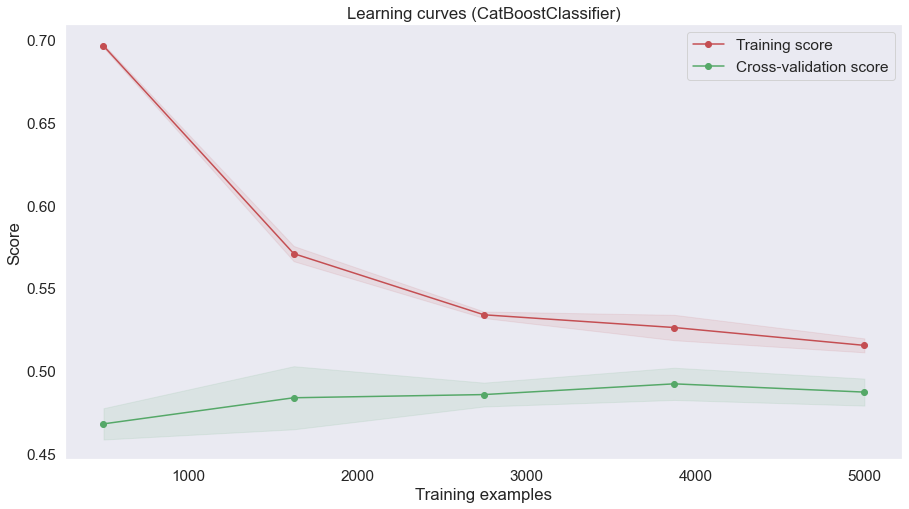

In [803]:
show_learning_curve_plot(final_model, df, y)

### $\S 2.5$. Выбор порога вероятности для определения класса<a class="anchor" id="par2.5"></a>

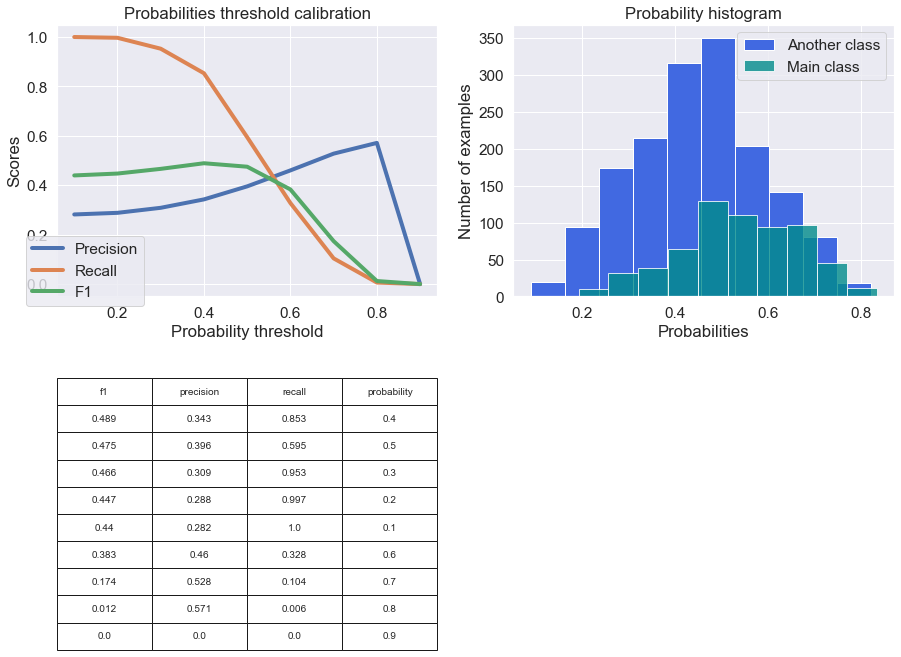

In [798]:
y_test_pred_probs = final_model.predict_proba(X_test)
show_proba_calibration_plots(y_test_pred_probs[:, 1], y_test)

***Вывод:*** лучшая отсечка между 0,4 и 0,5

In [804]:
# Делаем предсказание класса
y_train_preds= final_model.predict(X_train)
y_test_preds = final_model.predict(X_test)

# Считаем метрику f1
f1_train = f1_score(y_train, y_train_preds)
f1_test = f1_score(y_test, y_test_preds)
print(f'f1 на train {f1_train}')
print(f'f1 на test {f1_test}')

f1 на train 0.5214626391096979
f1 на test 0.4751102709514808


In [805]:
# Предсказываем вероятности классов (0 и 1 соответственно)
y_train_preds_proba = final_model.predict_proba(X_train)
#y_train_preds_proba[:5]

# Предсказываем вероятности классов (0 и 1 соответственно)
y_test_preds_proba = final_model.predict_proba(X_test)
#y_test_preds_proba[:5]

In [816]:
# Меняем отсечку в меньшую сторону (чтобы увеличить полноту)
y_train_preds = np.where(y_train_preds_proba[:, 1] >= 0.45, 1, 0)

# Меняем отсечку в меньшую сторону (чтобы увеличить полноту)
y_test_preds = np.where(y_test_preds_proba[:, 1] >= 0.45, 1, 0)

# Считаем метрику f1
f1_train = f1_score(y_train, y_train_preds)
f1_test = f1_score(y_test, y_test_preds)
print(f'f1 на train {f1_train}')
print(f'f1 на test {f1_test}')

f1 на train 0.5159445788431933
f1 на test 0.5012840267077555


***Вывод:*** лучшая отсечка равна 0,45

### $\S2.6$. Важность признаков<a class="anchor" id="par2.6"></a>

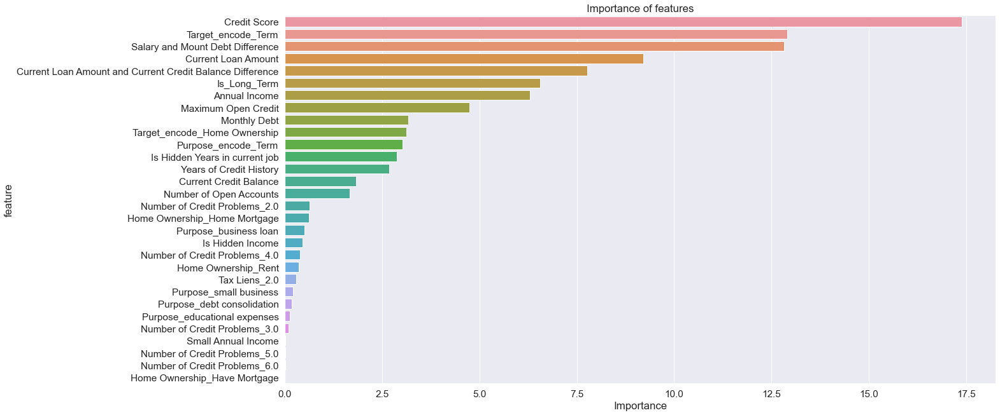

In [821]:
important_features_top = show_feature_importances(X_train.columns, final_model.feature_importances_, get_top=15)

In [822]:
important_features_top

['Credit Score',
 'Target_encode_Term',
 'Salary and Mount Debt Difference',
 'Current Loan Amount',
 'Current Loan Amount and Current Credit Balance Difference',
 'Is_Long_Term',
 'Annual Income',
 'Maximum Open Credit',
 'Monthly Debt',
 'Target_encode_Home Ownership',
 'Purpose_encode_Term',
 'Is Hidden Years in current job',
 'Years of Credit History',
 'Current Credit Balance',
 'Number of Open Accounts']

### $\S2.7$. Получение итоговой модели<a class="anchor" id="par2.7"></a>

In [823]:
frozen_params = {
     'class_weights':[1, disbalance], 
     'silent':True,
     'random_state':21,
     'eval_metric':'F1',
     'early_stopping_rounds':20
}

result_model = catb.CatBoostClassifier(**frozen_params,
                                      iterations=200,
                                      max_depth=3,
                                      reg_lambda=0.8898734177)

result_model.fit(X_train[important_features_top], y_train)

evaluate_preds(result_model, X_train[important_features_top], X_test[important_features_top], y_train, y_test)

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.65      0.73      3771
           1       0.43      0.67      0.52      1479

    accuracy                           0.66      5250
   macro avg       0.63      0.66      0.63      5250
weighted avg       0.72      0.66      0.67      5250

TEST

              precision    recall  f1-score   support

           0       0.80      0.64      0.71      1616
           1       0.40      0.60      0.48       634

    accuracy                           0.63      2250
   macro avg       0.60      0.62      0.59      2250
weighted avg       0.69      0.63      0.65      2250

CONFUSION MATRIX

col_0              0    1
Credit Default           
0               1030  586
1                251  383


In [824]:
# Делаем предсказание класса
y_train_preds= result_model.predict(X_train[important_features_top])
y_test_preds = result_model.predict(X_test[important_features_top])

# Считаем метрику f1
f1_train = f1_score(y_train, y_train_preds)
f1_test = f1_score(y_test, y_test_preds)
print(f'f1 на train {f1_train}')
print(f'f1 на test {f1_test}')

f1 на train 0.5245729303547964
f1 на test 0.4778540237055521


In [825]:
# Предсказываем вероятности классов (0 и 1 соответственно)
y_train_preds_proba = result_model.predict_proba(X_train[important_features_top])
#y_train_preds_proba[:5]

# Предсказываем вероятности классов (0 и 1 соответственно)
y_test_preds_proba = result_model.predict_proba(X_test[important_features_top])
#y_test_preds_proba[:5]

In [830]:
# Меняем отсечку в меньшую сторону (чтобы увеличить полноту)
y_train_preds = np.where(y_train_preds_proba[:, 1] >= 0.45, 1, 0)

# Меняем отсечку в меньшую сторону (чтобы увеличить полноту)
y_test_preds = np.where(y_test_preds_proba[:, 1] >= 0.45, 1, 0)

# Считаем метрику f1
f1_train = f1_score(y_train, y_train_preds)
f1_test = f1_score(y_test, y_test_preds)
print(f'f1 на train {f1_train}')
print(f'f1 на test {f1_test}')

f1 на train 0.5157177401626731
f1 на test 0.503345342254246


**Сохранение итоговой модели**

In [833]:
with open('result_model', 'wb') as file:
    pickle.dump(result_model, file)

## <center>Глава 3. Прогнозирование на датасете test<a class="anchor" id="part3"></a><center>

### $\S3.1$. Предсказание класса с помощью итоговой модели<a class="anchor" id="par3.1"></a>

In [846]:
# Заружаем и просматриваем подготовленный тестовый датасет
Test = pd.read_csv('test_prep.csv')

# Просматриваем тестовый датасет с important_features_top
print(f'Форма третировочного датасета с important_features_top: {Test[important_features_top].shape}')
Test[important_features_top].head()

Форма третировочного датасета с important_features_top: (2500, 15)


,Credit Score,Target_encode_Term,Salary and Mount Debt Difference,Current Loan Amount,Current Loan Amount and Current Credit Balance Difference,Is_Long_Term,Annual Income,Maximum Open Credit,Monthly Debt,Target_encode_Home Ownership,Purpose_encode_Term,Is Hidden Years in current job,Years of Credit History,Current Credit Balance,Number of Open Accounts
0,727.0,0.233441,91393.250000,162470.0,56564.0,0,1178475.0,220968.0,6813.0,0.313046,0.278264,0,12.5,105906.0,9.0
1,699.0,0.233441,17001.833333,78298.0,32261.0,0,231838.0,55946.0,2318.0,0.313046,0.100000,0,32.7,46037.0,6.0
2,726.0,0.233441,77316.000000,200178.0,53688.0,0,1152540.0,204600.0,18729.0,0.251856,0.278264,0,13.7,146490.0,10.0
3,739.0,0.233441,74133.750000,217382.0,4183.0,0,1220313.0,456302.0,27559.0,0.251856,0.278264,0,17.0,213199.0,16.0
4,706.0,0.419753,152474.333333,777634.0,352243.0,1,2340952.0,1207272.0,42605.0,0.251856,0.278264,0,23.6,425391.0,11.0


In [847]:
# Делаем предсказание класса
test_preds = result_model.predict(Test[important_features_top])
test_preds

array([0, 1, 0, ..., 1, 0, 1], dtype=int64)

In [848]:
# Предсказываем вероятности классов (0 и 1 соответственно)
test_preds_proba = result_model.predict_proba(Test[important_features_top])
test_preds_proba[:5]

array([[0.52947396, 0.47052604],
       [0.44775444, 0.55224556],
       [0.52485054, 0.47514946],
       [0.58412248, 0.41587752],
       [0.44740621, 0.55259379]])

In [849]:
# Меняем отсечку на 0,45
test_preds = np.where(test_preds_proba[:, 1] >= 0.45, 1, 0)
test_preds

array([1, 1, 1, ..., 1, 0, 1])

### $\S3.2$. Создание и сохранение датасета с прогнозами класса<a class="anchor" id="par3.2"></a>

**Создание датасета с предсказаниями**

In [865]:
# Формируем первый столбец итогового датасета
Test.index.tolist() 

# Формируем второй столбей итогового датасета
test_preds.tolist()

# формируем итоговый датасет
result = pd.DataFrame({
       "Id" : Test.index.tolist(),
       "Credit Default" : test_preds.tolist()
                     })
result

,Id,Credit Default
0,0,1
1,1,1
2,2,1
3,3,0
4,4,1
...,...,...
2495,2495,0
2496,2496,1
2497,2497,1
2498,2498,0


**Сохранение датасета с предсказаниями**

In [866]:
result.to_csv('BazhanovaEN_predictions.csv', index=None)

Интерпретация:
1. Полученное значение (прогноз для первого наблюдения): -0.24.
2. Базовое значение: 0.02852 -- среднее значение, полученное при обучении.
3. Предсказание в сторону класса 1 смещает то, что:\
 -- есть проблемы с сердцем,\
 -- при наличии проблем с сердцем роженицам наиболее часто делают касарево сечение, \
 -- в возрасте 33 лет роженицам чаще делают кесарево сечение.
   
   Предсказание в сторону класса 0 смещает то, что:\
 -- кровяное давление нормальное,\
 -- с таким кровяным давление чаще роженицам не делают кесарево сечение,\
 -- номер поступления 3,\
 -- при запоздалом поступлении роженицам чаще не делают кесарево сечение.